# Imports

In [13]:
import os
import torch
import numpy as np
import gymnasium as gym
from gymnasium.wrappers import (
    FrameStack,
    GrayScaleObservation,
    ResizeObservation,
    TransformObservation,
    RecordVideo
)

# Import custom modules
from src.helper_functions.create_ActionSpaceWrapper import ActionSpaceWrapper
from src.helper_functions.create_Agent import EpsilonGreedyAgent
from src.helper_functions.create_Plot import plot_results

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

# Set Hyperparameters

In [14]:
action_space = [
    # No Operation
    0,
    # Right
    2,
    # Left
    3
]
buffer_size = 25000
batch_size = 64
learning_rate = 0.00009
stacking_number = 10
online_update_every = 3
exp_before_target_sync = 5000
epsilon_start = 1.0
epsilon_min = 0.01
epsilon_decay = 0.001
gamma = 0.99
num_episodes = 1000
plot_every = 25
save_every = 50

# Set all paths

In [15]:
# change this version-number to create new folders
train_version = "v1"

trainfolder = "training_" + train_version
vid_folder = os.path.join("res", trainfolder, "all_videos")

model_folder = os.path.join("models")
if not os.path.exists(model_folder):
    os.makedirs(model_folder)

checkpoint_folder = os.path.join(model_folder, trainfolder, "checkpoints")
if not os.path.exists(checkpoint_folder):
    os.makedirs(checkpoint_folder)

plot_folder = os.path.join("res", trainfolder, "plots")
if not os.path.exists(plot_folder):
    os.makedirs(plot_folder)

starting_point = None  # os.path.join(checkpoint_folder, "model_epxxx.pth")

# Initialize Environment and other variables

In [16]:
env = gym.make("ALE/Pong-v5", render_mode='rgb_array')
env = ActionSpaceWrapper(env, action_space)
env = RecordVideo(env, vid_folder, episode_trigger=lambda episode_id: True, video_length=0)
env = GrayScaleObservation(env)
env = ResizeObservation(env, shape=84)
env = TransformObservation(env, lambda obs: np.expand_dims(obs, axis=-1))
env = FrameStack(env, num_stack=stacking_number)


state, _ = env.reset()
state = np.squeeze(state, axis=-1)
state_shape = state.shape


exp_before_training = batch_size + 5


agent = EpsilonGreedyAgent(
    num_actions=len(action_space),
    state_shape=state_shape,
    checkpoint_folder=checkpoint_folder,
    model_folder=model_folder,
    wantcuda=True,
    starting_point=starting_point,
    learning_rate=learning_rate,
    epsilon_start=epsilon_start,
    epsilon_min=epsilon_min,
    epsilon_decay=epsilon_decay,
    batch_size=batch_size,
    gamma=gamma,
    buffer_size=buffer_size,
    exp_before_training=exp_before_training,
    online_update_every=online_update_every,
    exp_before_target_sync=exp_before_target_sync,
    save_every=save_every,
)

reward_list = []
steps_list = []
q_list = []
loss_list = []
epsilon_list = []

c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\.venv\Lib\site-packages\gymnasium\wrappers\monitoring\video_recorder.py:178: UserWarning: WARN: Unable to save last video! Did you call close()?
  logger.warn("Unable to save last video! Did you call close()?")


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-0.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-0.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-0.mp4
Episode 1 abgeschlossen mit 1005 Schritten, Gesamtbelohnung: -21.0, Epsilon: 1.0




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-1.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-1.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-1.mp4
Episode 2 abgeschlossen mit 1007 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.999




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-2.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-2.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-2.mp4
Episode 3 abgeschlossen mit 948 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.998




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-3.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-3.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-3.mp4
Episode 4 abgeschlossen mit 982 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.997




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-4.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-4.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-4.mp4
Episode 5 abgeschlossen mit 764 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.996




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-5.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-5.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-5.mp4
Episode 6 abgeschlossen mit 944 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.995




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-6.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-6.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-6.mp4
Episode 7 abgeschlossen mit 1162 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.994




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-7.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-7.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-7.mp4
Episode 8 abgeschlossen mit 981 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.993




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-8.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-8.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-8.mp4
Episode 9 abgeschlossen mit 946 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.992




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-9.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-9.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-9.mp4
Episode 10 abgeschlossen mit 1188 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.991


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-10.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-10.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-10.mp4
Episode 11 abgeschlossen mit 1186 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.99




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-11.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-11.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-11.mp4
Episode 12 abgeschlossen mit 944 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.989




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-12.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-12.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-12.mp4
Episode 13 abgeschlossen mit 826 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.988




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-13.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-13.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-13.mp4
Episode 14 abgeschlossen mit 826 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.987




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-14.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-14.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-14.mp4
Episode 15 abgeschlossen mit 1005 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.986




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-15.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-15.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-15.mp4
Episode 16 abgeschlossen mit 1068 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.985




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-16.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-16.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-16.mp4


Episode 17 abgeschlossen mit 1161 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.984


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-17.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-17.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-17.mp4
Episode 18 abgeschlossen mit 886 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.983




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-18.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-18.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-18.mp4


Episode 19 abgeschlossen mit 1005 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.982


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-19.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-19.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-19.mp4


Episode 20 abgeschlossen mit 1129 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.981


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-20.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-20.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-20.mp4


Episode 21 abgeschlossen mit 1041 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.98


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-21.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-21.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-21.mp4
Episode 22 abgeschlossen mit 826 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.979




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-22.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-22.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-22.mp4
Episode 23 abgeschlossen mit 1381 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.978


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-23.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-23.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-23.mp4
Episode 24 abgeschlossen mit 1138 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.977


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-24.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-24.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-24.mp4
Episode 25 abgeschlossen mit 944 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.976




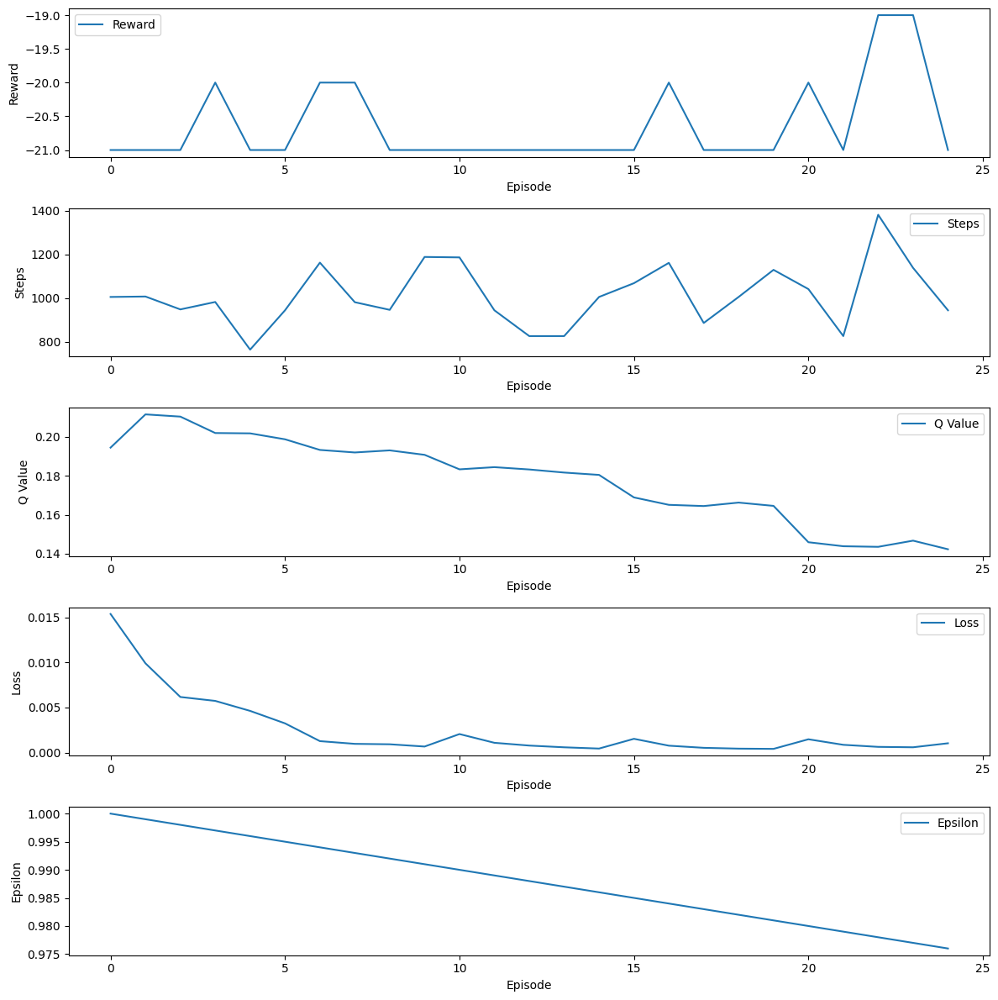

Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-25.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-25.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-25.mp4
Episode 26 abgeschlossen mit 1100 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.975




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-26.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-26.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-26.mp4
Episode 27 abgeschlossen mit 944 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.974




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-27.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-27.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-27.mp4
Episode 28 abgeschlossen mit 825 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.973




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-28.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-28.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-28.mp4
Episode 29 abgeschlossen mit 825 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.972




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-29.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-29.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-29.mp4
Episode 30 abgeschlossen mit 947 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.971




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-30.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-30.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-30.mp4


Episode 31 abgeschlossen mit 945 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.97


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-31.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-31.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-31.mp4


Episode 32 abgeschlossen mit 1007 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.969


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-32.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-32.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-32.mp4
Episode 33 abgeschlossen mit 1099 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.968




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-33.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-33.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-33.mp4
Episode 34 abgeschlossen mit 884 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.967




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-34.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-34.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-34.mp4
Episode 35 abgeschlossen mit 884 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.966




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-35.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-35.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-35.mp4
Episode 36 abgeschlossen mit 824 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.965




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-36.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-36.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-36.mp4
Episode 37 abgeschlossen mit 824 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.964




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-37.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-37.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-37.mp4
Episode 38 abgeschlossen mit 824 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.963




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-38.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-38.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-38.mp4
Episode 39 abgeschlossen mit 1005 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.962




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-39.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-39.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-39.mp4
Episode 40 abgeschlossen mit 826 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.961




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-40.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-40.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-40.mp4
Episode 41 abgeschlossen mit 1006 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.96




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-41.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-41.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-41.mp4
Episode 42 abgeschlossen mit 886 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.959




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-42.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-42.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-42.mp4
Episode 43 abgeschlossen mit 945 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.958




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-43.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-43.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-43.mp4
Episode 44 abgeschlossen mit 824 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.957




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-44.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-44.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-44.mp4
Episode 45 abgeschlossen mit 884 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.956




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-45.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-45.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-45.mp4


Episode 46 abgeschlossen mit 1186 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.955


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-46.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-46.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-46.mp4
Episode 47 abgeschlossen mit 1008 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.954




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-47.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-47.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-47.mp4


Episode 48 abgeschlossen mit 981 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.953


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-48.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-48.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-48.mp4


Episode 49 abgeschlossen mit 1070 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.952


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-49.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-49.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-49.mp4
Episode 50 abgeschlossen mit 1006 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.951




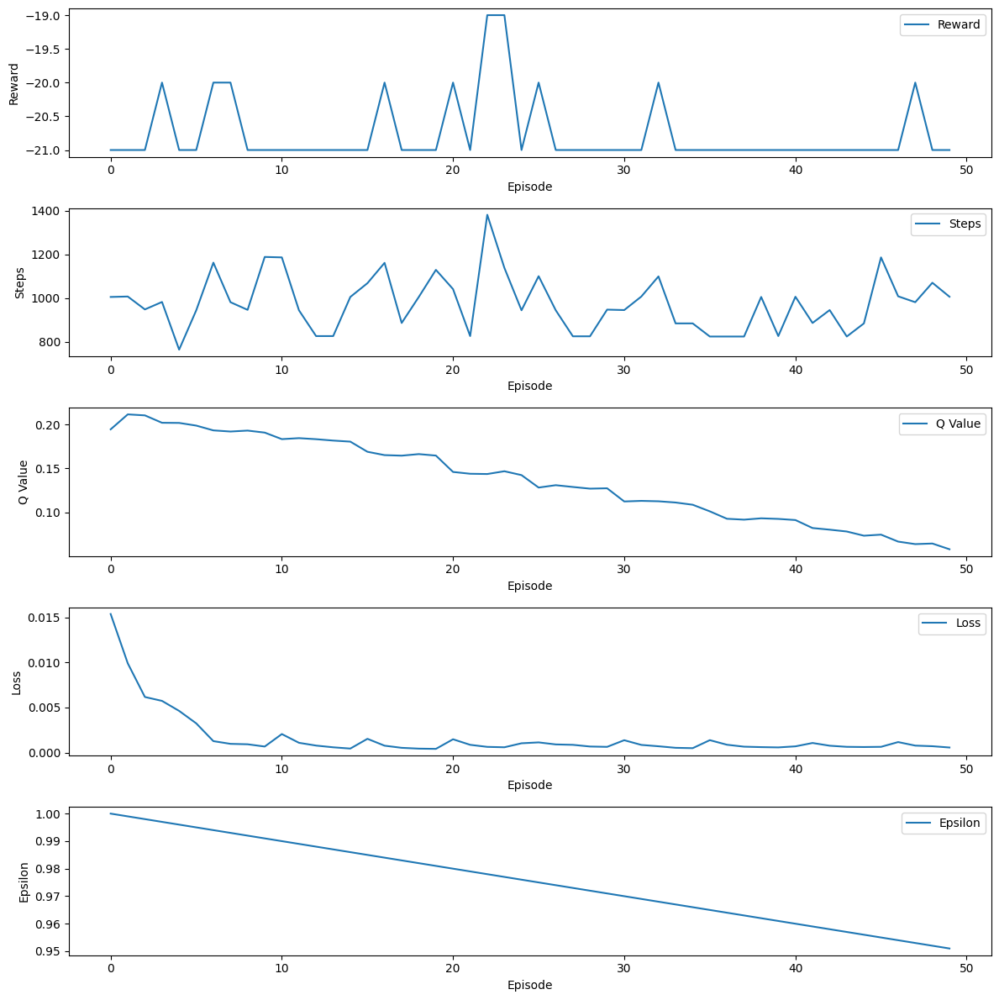

Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-50.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-50.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-50.mp4
Episode 51 abgeschlossen mit 1007 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.95




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-51.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-51.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-51.mp4


Episode 52 abgeschlossen mit 1163 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.949


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-52.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-52.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-52.mp4


Episode 53 abgeschlossen mit 1068 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.948


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-53.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-53.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-53.mp4
Episode 54 abgeschlossen mit 1016 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.947




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-54.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-54.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-54.mp4
Episode 55 abgeschlossen mit 944 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.946




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-55.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-55.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-55.mp4


Episode 56 abgeschlossen mit 919 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.945


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-56.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-56.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-56.mp4
Episode 57 abgeschlossen mit 983 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.944




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-57.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-57.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-57.mp4
Episode 58 abgeschlossen mit 824 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.943




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-58.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-58.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-58.mp4
Episode 59 abgeschlossen mit 1295 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.942


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-59.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-59.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-59.mp4
Episode 60 abgeschlossen mit 764 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.941




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-60.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-60.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-60.mp4
Episode 61 abgeschlossen mit 1008 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.94




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-61.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-61.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-61.mp4
Episode 62 abgeschlossen mit 1006 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.939




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-62.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-62.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-62.mp4
Episode 63 abgeschlossen mit 1064 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.938




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-63.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-63.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-63.mp4
Episode 64 abgeschlossen mit 1041 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.9369999999999999




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-64.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-64.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-64.mp4
Episode 65 abgeschlossen mit 1281 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.9359999999999999


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-65.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-65.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-65.mp4
Episode 66 abgeschlossen mit 1016 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.9349999999999999




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-66.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-66.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-66.mp4
Episode 67 abgeschlossen mit 944 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.9339999999999999




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-67.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-67.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-67.mp4
Episode 68 abgeschlossen mit 884 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.9329999999999999




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-68.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-68.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-68.mp4
Episode 69 abgeschlossen mit 980 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.9319999999999999




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-69.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-69.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-69.mp4
Episode 70 abgeschlossen mit 946 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.9309999999999999




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-70.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-70.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-70.mp4
Episode 71 abgeschlossen mit 1101 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.9299999999999999




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-71.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-71.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-71.mp4


Episode 72 abgeschlossen mit 1102 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.9289999999999999


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-72.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-72.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-72.mp4
Episode 73 abgeschlossen mit 1162 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.9279999999999999


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-73.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-73.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-73.mp4


Episode 74 abgeschlossen mit 886 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.9269999999999999


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-74.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-74.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-74.mp4
Episode 75 abgeschlossen mit 944 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.9259999999999999




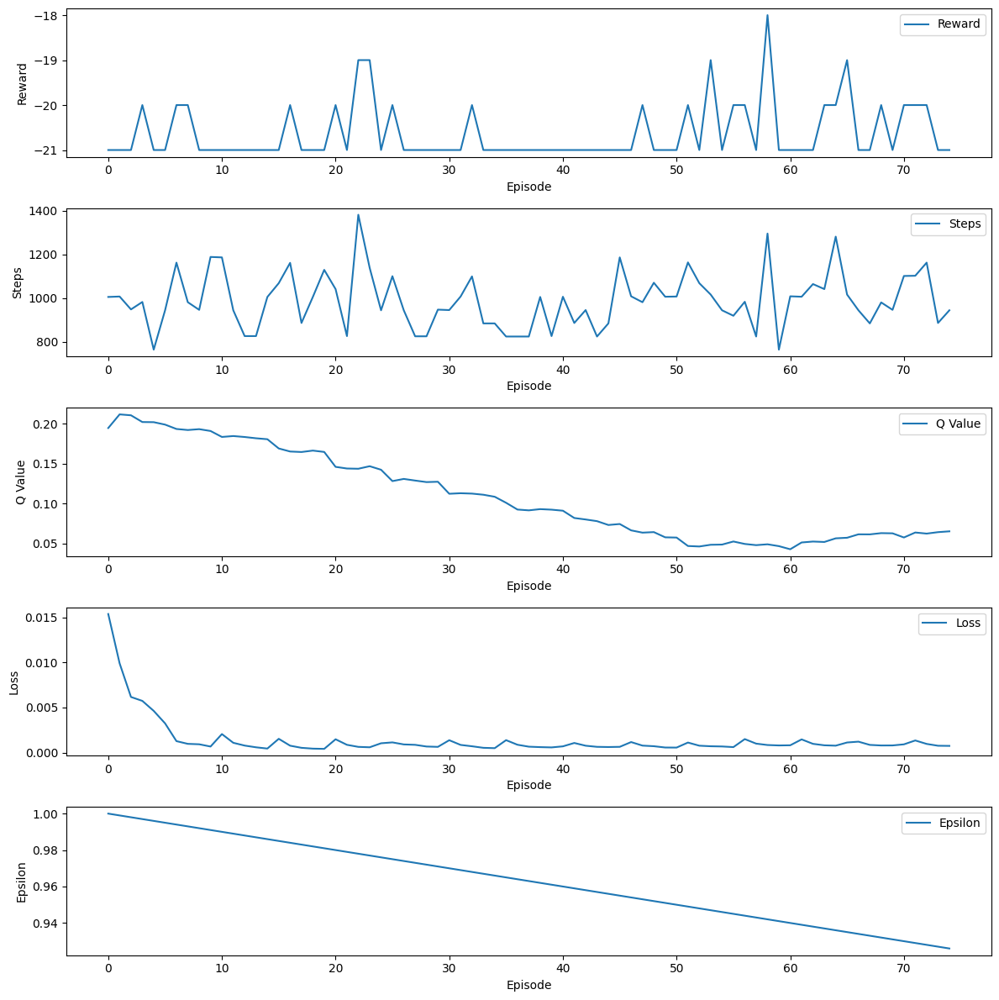

Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-75.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-75.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-75.mp4
Episode 76 abgeschlossen mit 1680 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.9249999999999999


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-76.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-76.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-76.mp4
Episode 77 abgeschlossen mit 1199 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.9239999999999999




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-77.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-77.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-77.mp4
Episode 78 abgeschlossen mit 1065 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.9229999999999999




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-78.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-78.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-78.mp4
Episode 79 abgeschlossen mit 1004 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.9219999999999999




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-79.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-79.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-79.mp4
Episode 80 abgeschlossen mit 1231 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.9209999999999999


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-80.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-80.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-80.mp4


Episode 81 abgeschlossen mit 1040 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.9199999999999999


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-81.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-81.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-81.mp4
Episode 82 abgeschlossen mit 1009 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.9189999999999999




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-82.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-82.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-82.mp4
Episode 83 abgeschlossen mit 946 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.9179999999999999




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-83.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-83.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-83.mp4
Episode 84 abgeschlossen mit 884 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.9169999999999999




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-84.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-84.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-84.mp4


Episode 85 abgeschlossen mit 980 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.9159999999999999


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-85.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-85.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-85.mp4
Episode 86 abgeschlossen mit 884 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.9149999999999999




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-86.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-86.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-86.mp4
Episode 87 abgeschlossen mit 886 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.9139999999999999




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-87.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-87.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-87.mp4


Episode 88 abgeschlossen mit 1267 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.9129999999999999


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-88.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-88.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-88.mp4
Episode 89 abgeschlossen mit 884 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.9119999999999999




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-89.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-89.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-89.mp4


Episode 90 abgeschlossen mit 1065 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.9109999999999999


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-90.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-90.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-90.mp4
Episode 91 abgeschlossen mit 1224 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.9099999999999999


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-91.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-91.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-91.mp4
Episode 92 abgeschlossen mit 1018 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.9089999999999999




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-92.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-92.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-92.mp4
Episode 93 abgeschlossen mit 945 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.9079999999999999




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-93.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-93.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-93.mp4


Episode 94 abgeschlossen mit 1064 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.9069999999999999


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-94.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-94.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-94.mp4
Episode 95 abgeschlossen mit 1235 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.9059999999999999


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-95.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-95.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-95.mp4
Episode 96 abgeschlossen mit 1043 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.9049999999999999




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-96.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-96.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-96.mp4


Episode 97 abgeschlossen mit 1130 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.9039999999999999


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-97.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-97.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-97.mp4
Episode 98 abgeschlossen mit 1067 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.9029999999999999




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-98.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-98.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-98.mp4
Episode 99 abgeschlossen mit 945 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.9019999999999999




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-99.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-99.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-99.mp4
Episode 100 abgeschlossen mit 1075 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.9009999999999999




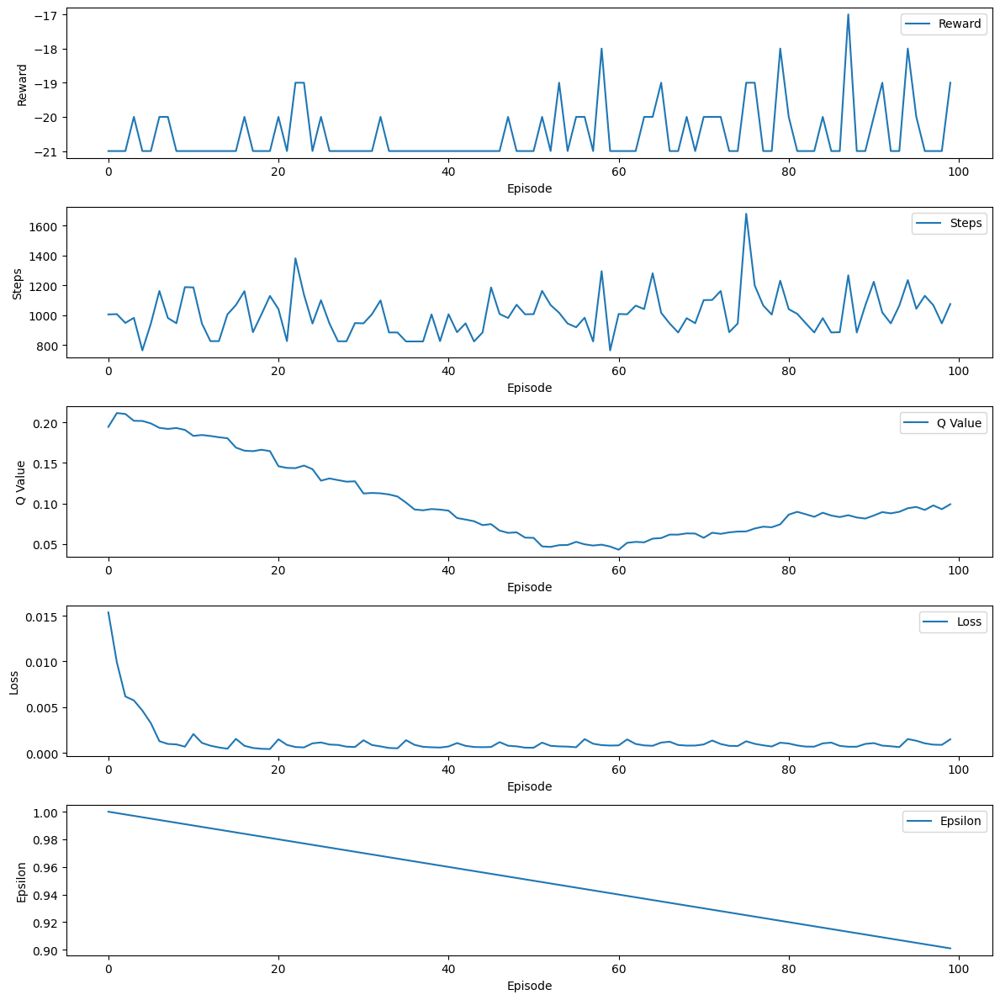

Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-100.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-100.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-100.mp4
Episode 101 abgeschlossen mit 1135 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.8999999999999999




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-101.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-101.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-101.mp4


Episode 102 abgeschlossen mit 1135 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.8989999999999999


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-102.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-102.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-102.mp4
Episode 103 abgeschlossen mit 946 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.8979999999999999




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-103.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-103.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-103.mp4


Episode 104 abgeschlossen mit 1127 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.8969999999999999


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-104.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-104.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-104.mp4
Episode 105 abgeschlossen mit 1127 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.8959999999999999




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-105.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-105.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-105.mp4


Episode 106 abgeschlossen mit 1189 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.8949999999999999


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-106.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-106.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-106.mp4


Episode 107 abgeschlossen mit 1103 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.8939999999999999


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-107.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-107.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-107.mp4


Episode 108 abgeschlossen mit 1067 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.8929999999999999


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-108.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-108.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-108.mp4
Episode 109 abgeschlossen mit 919 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.8919999999999999




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-109.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-109.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-109.mp4


Episode 110 abgeschlossen mit 1161 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.8909999999999999


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-110.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-110.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-110.mp4
Episode 111 abgeschlossen mit 1065 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.8899999999999999




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-111.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-111.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-111.mp4
Episode 112 abgeschlossen mit 1292 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.8889999999999999


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-112.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-112.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-112.mp4


Episode 113 abgeschlossen mit 1187 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.8879999999999999


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-113.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-113.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-113.mp4
Episode 114 abgeschlossen mit 1067 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.8869999999999999




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-114.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-114.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-114.mp4
Episode 115 abgeschlossen mit 946 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.8859999999999999




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-115.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-115.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-115.mp4


Episode 116 abgeschlossen mit 1188 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.8849999999999999


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-116.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-116.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-116.mp4
Episode 117 abgeschlossen mit 1501 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.8839999999999999


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-117.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-117.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-117.mp4
Episode 118 abgeschlossen mit 885 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.8829999999999999




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-118.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-118.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-118.mp4


Episode 119 abgeschlossen mit 1136 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.8819999999999999


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-119.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-119.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-119.mp4


Episode 120 abgeschlossen mit 1064 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.8809999999999999


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-120.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-120.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-120.mp4


Episode 121 abgeschlossen mit 1067 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.8799999999999999


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-121.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-121.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-121.mp4
Episode 122 abgeschlossen mit 1223 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.8789999999999999


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-122.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-122.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-122.mp4
Episode 123 abgeschlossen mit 1440 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.8779999999999999


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-123.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-123.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-123.mp4
Episode 124 abgeschlossen mit 1006 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.8769999999999999




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-124.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-124.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-124.mp4
Episode 125 abgeschlossen mit 884 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.8759999999999999




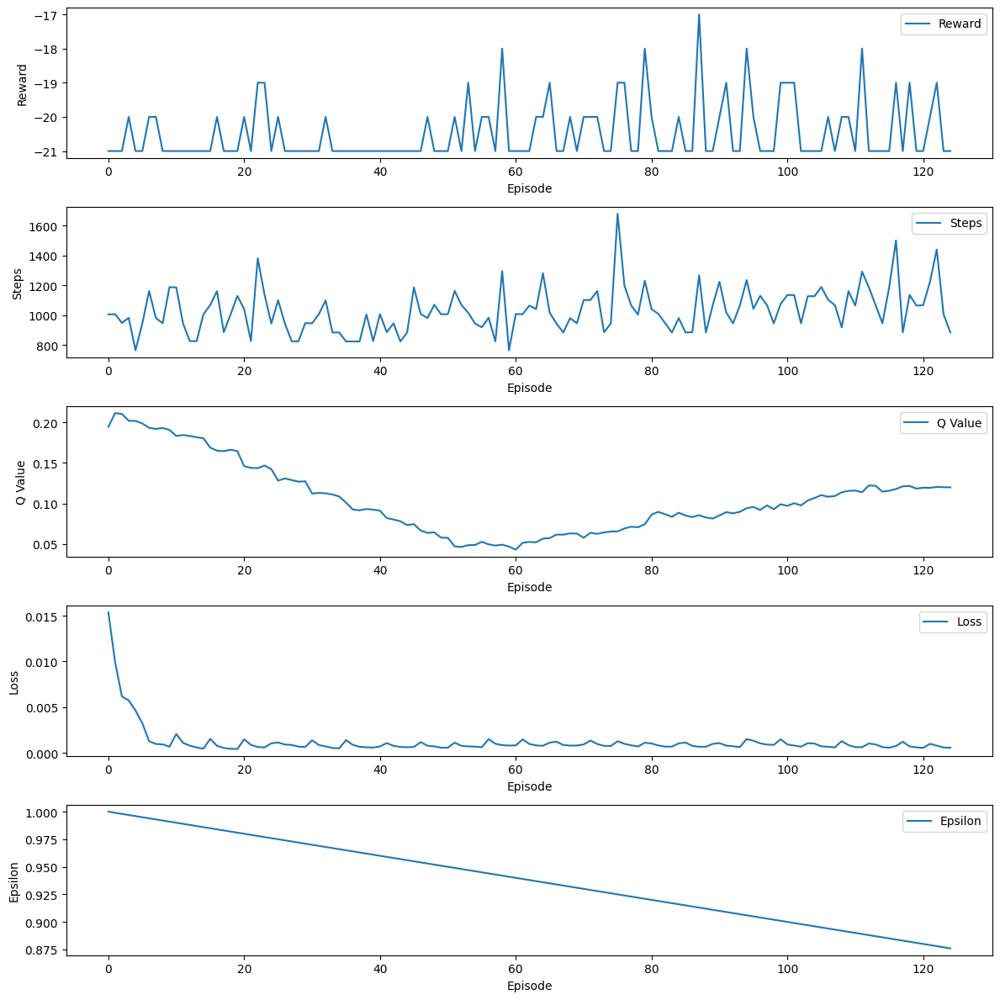

Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-125.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-125.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-125.mp4
Episode 126 abgeschlossen mit 824 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.8749999999999999


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-126.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-126.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-126.mp4
Episode 127 abgeschlossen mit 885 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.8739999999999999




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-127.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-127.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-127.mp4


Episode 128 abgeschlossen mit 1165 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.8729999999999999


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-128.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-128.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-128.mp4


Episode 129 abgeschlossen mit 1042 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.8719999999999999


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-129.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-129.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-129.mp4
Episode 130 abgeschlossen mit 1222 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.8709999999999999




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-130.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-130.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-130.mp4


Episode 131 abgeschlossen mit 946 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.8699999999999999


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-131.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-131.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-131.mp4


Episode 132 abgeschlossen mit 1284 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.8689999999999999


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-132.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-132.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-132.mp4


Episode 133 abgeschlossen mit 1129 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.8679999999999999


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-133.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-133.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-133.mp4


Episode 134 abgeschlossen mit 1042 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.8669999999999999


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-134.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-134.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-134.mp4
Episode 135 abgeschlossen mit 1328 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.8659999999999999


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-135.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-135.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-135.mp4
Episode 136 abgeschlossen mit 1203 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.8649999999999999


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-136.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-136.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-136.mp4
Episode 137 abgeschlossen mit 948 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.8639999999999999




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-137.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-137.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-137.mp4
Episode 138 abgeschlossen mit 944 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.8629999999999999




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-138.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-138.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-138.mp4


Episode 139 abgeschlossen mit 1283 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.8619999999999999


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-139.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-139.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-139.mp4
Episode 140 abgeschlossen mit 947 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.8609999999999999




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-140.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-140.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-140.mp4
Episode 141 abgeschlossen mit 886 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.8599999999999999




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-141.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-141.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-141.mp4
Episode 142 abgeschlossen mit 824 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.8589999999999999




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-142.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-142.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-142.mp4
Episode 143 abgeschlossen mit 1467 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.8579999999999999


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-143.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-143.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-143.mp4


Episode 144 abgeschlossen mit 981 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.8569999999999999


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-144.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-144.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-144.mp4
Episode 145 abgeschlossen mit 982 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.8559999999999999




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-145.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-145.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-145.mp4
Episode 146 abgeschlossen mit 981 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.8549999999999999




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-146.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-146.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-146.mp4
Episode 147 abgeschlossen mit 1041 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.8539999999999999




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-147.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-147.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-147.mp4


Episode 148 abgeschlossen mit 1127 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.8529999999999999


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-148.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-148.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-148.mp4


Episode 149 abgeschlossen mit 1102 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.8519999999999999


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-149.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-149.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-149.mp4
Episode 150 abgeschlossen mit 948 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.8509999999999999




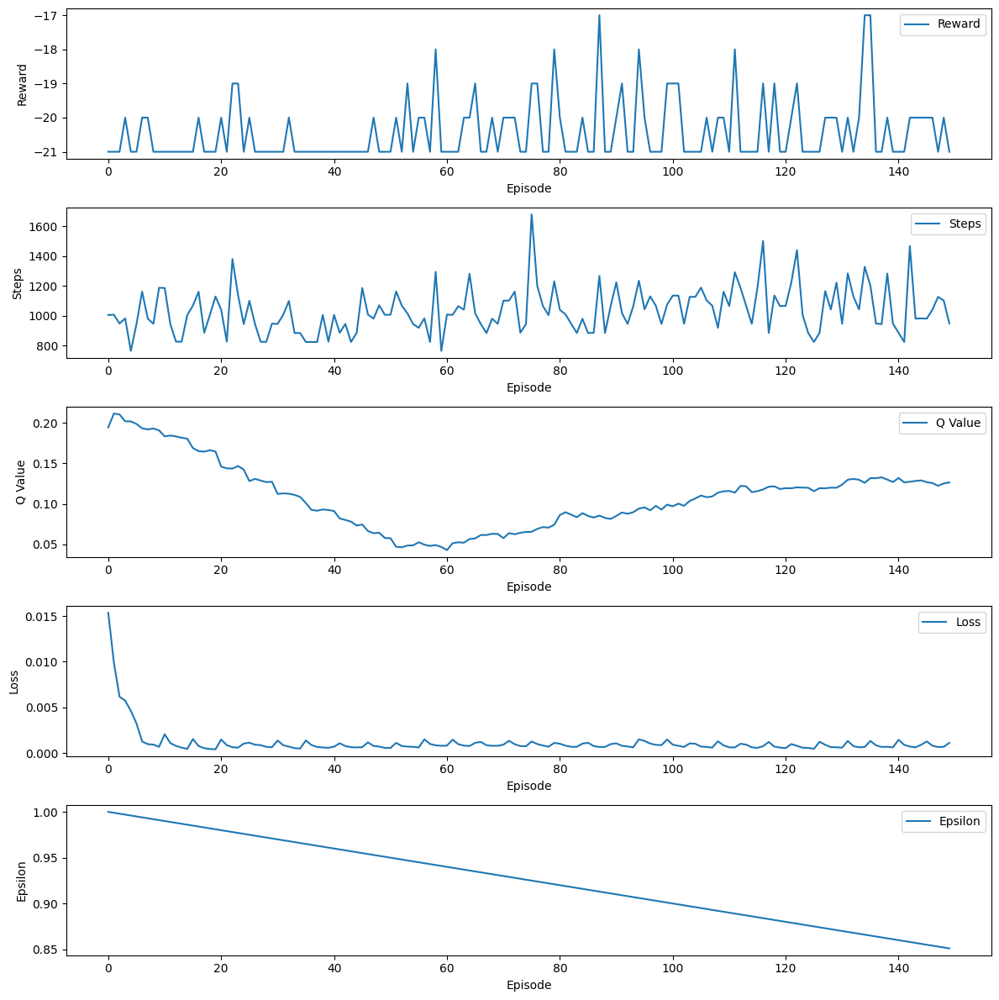

Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-150.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-150.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-150.mp4
Episode 151 abgeschlossen mit 1008 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.8499999999999999




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-151.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-151.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-151.mp4
Episode 152 abgeschlossen mit 1006 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.8489999999999999




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-152.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-152.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-152.mp4


Episode 153 abgeschlossen mit 1248 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.8479999999999999


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-153.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-153.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-153.mp4
Episode 154 abgeschlossen mit 1317 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.8469999999999999


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-154.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-154.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-154.mp4
Episode 155 abgeschlossen mit 1351 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.8459999999999999


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-155.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-155.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-155.mp4
Episode 156 abgeschlossen mit 1536 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.8449999999999999


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-156.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-156.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-156.mp4
Episode 157 abgeschlossen mit 946 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.8439999999999999




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-157.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-157.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-157.mp4
Episode 158 abgeschlossen mit 1446 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.8429999999999999


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-158.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-158.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-158.mp4
Episode 159 abgeschlossen mit 981 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.8419999999999999




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-159.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-159.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-159.mp4


Episode 160 abgeschlossen mit 1102 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.8409999999999999


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-160.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-160.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-160.mp4


Episode 161 abgeschlossen mit 1159 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.8399999999999999


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-161.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-161.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-161.mp4
Episode 162 abgeschlossen mit 1409 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.8389999999999999


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-162.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-162.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-162.mp4
Episode 163 abgeschlossen mit 1072 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.8379999999999999




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-163.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-163.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-163.mp4


Episode 164 abgeschlossen mit 1221 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.8369999999999999


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-164.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-164.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-164.mp4
Episode 165 abgeschlossen mit 1284 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.8359999999999999


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-165.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-165.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-165.mp4
Episode 166 abgeschlossen mit 1558 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.8349999999999999


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-166.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-166.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-166.mp4
Episode 167 abgeschlossen mit 1040 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.8339999999999999




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-167.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-167.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-167.mp4


Episode 168 abgeschlossen mit 1135 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.8329999999999999


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-168.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-168.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-168.mp4
Episode 169 abgeschlossen mit 1471 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.8319999999999999


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-169.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-169.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-169.mp4
Episode 170 abgeschlossen mit 1352 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.8309999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-170.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-170.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-170.mp4


Episode 171 abgeschlossen mit 1066 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.8299999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-171.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-171.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-171.mp4
Episode 172 abgeschlossen mit 1165 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.8289999999999998




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-172.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-172.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-172.mp4
Episode 173 abgeschlossen mit 1101 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.8279999999999998




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-173.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-173.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-173.mp4


Episode 174 abgeschlossen mit 1102 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.8269999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-174.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-174.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-174.mp4
Episode 175 abgeschlossen mit 1527 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.8259999999999998




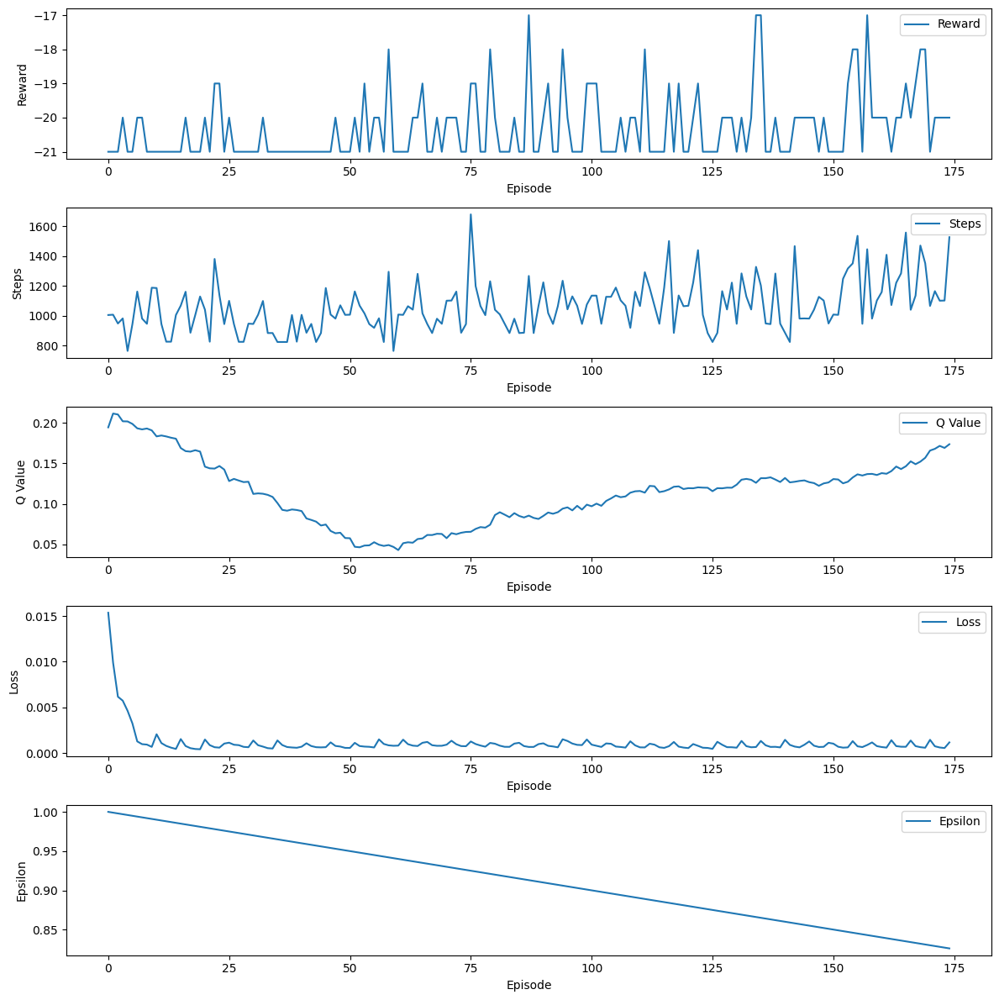

Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-175.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-175.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-175.mp4
Episode 176 abgeschlossen mit 1401 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.8249999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-176.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-176.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-176.mp4
Episode 177 abgeschlossen mit 1472 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.8239999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-177.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-177.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-177.mp4
Episode 178 abgeschlossen mit 884 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.8229999999999998




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-178.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-178.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-178.mp4


Episode 179 abgeschlossen mit 1161 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.8219999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-179.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-179.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-179.mp4
Episode 180 abgeschlossen mit 1190 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.8209999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-180.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-180.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-180.mp4
Episode 181 abgeschlossen mit 1256 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.8199999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-181.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-181.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-181.mp4
Episode 182 abgeschlossen mit 1655 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.8189999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-182.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-182.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-182.mp4


Episode 183 abgeschlossen mit 884 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.8179999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-183.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-183.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-183.mp4
Episode 184 abgeschlossen mit 1510 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.8169999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-184.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-184.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-184.mp4
Episode 185 abgeschlossen mit 1065 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.8159999999999998




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-185.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-185.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-185.mp4
Episode 186 abgeschlossen mit 1249 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.8149999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-186.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-186.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-186.mp4
Episode 187 abgeschlossen mit 1104 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.8139999999999998




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-187.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-187.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-187.mp4


Episode 188 abgeschlossen mit 1197 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.8129999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-188.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-188.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-188.mp4
Episode 189 abgeschlossen mit 884 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.8119999999999998




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-189.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-189.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-189.mp4


Episode 190 abgeschlossen mit 1129 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.8109999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-190.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-190.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-190.mp4
Episode 191 abgeschlossen mit 1471 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.8099999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-191.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-191.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-191.mp4
Episode 192 abgeschlossen mit 1308 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.8089999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-192.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-192.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-192.mp4


Episode 193 abgeschlossen mit 1196 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.8079999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-193.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-193.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-193.mp4
Episode 194 abgeschlossen mit 1283 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.8069999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-194.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-194.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-194.mp4
Episode 195 abgeschlossen mit 1321 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.8059999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-195.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-195.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-195.mp4
Episode 196 abgeschlossen mit 1160 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.8049999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-196.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-196.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-196.mp4


Episode 197 abgeschlossen mit 1071 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.8039999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-197.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-197.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-197.mp4
Episode 198 abgeschlossen mit 1076 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.8029999999999998




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-198.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-198.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-198.mp4


Episode 199 abgeschlossen mit 1169 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.8019999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-199.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-199.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-199.mp4
Episode 200 abgeschlossen mit 1127 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.8009999999999998




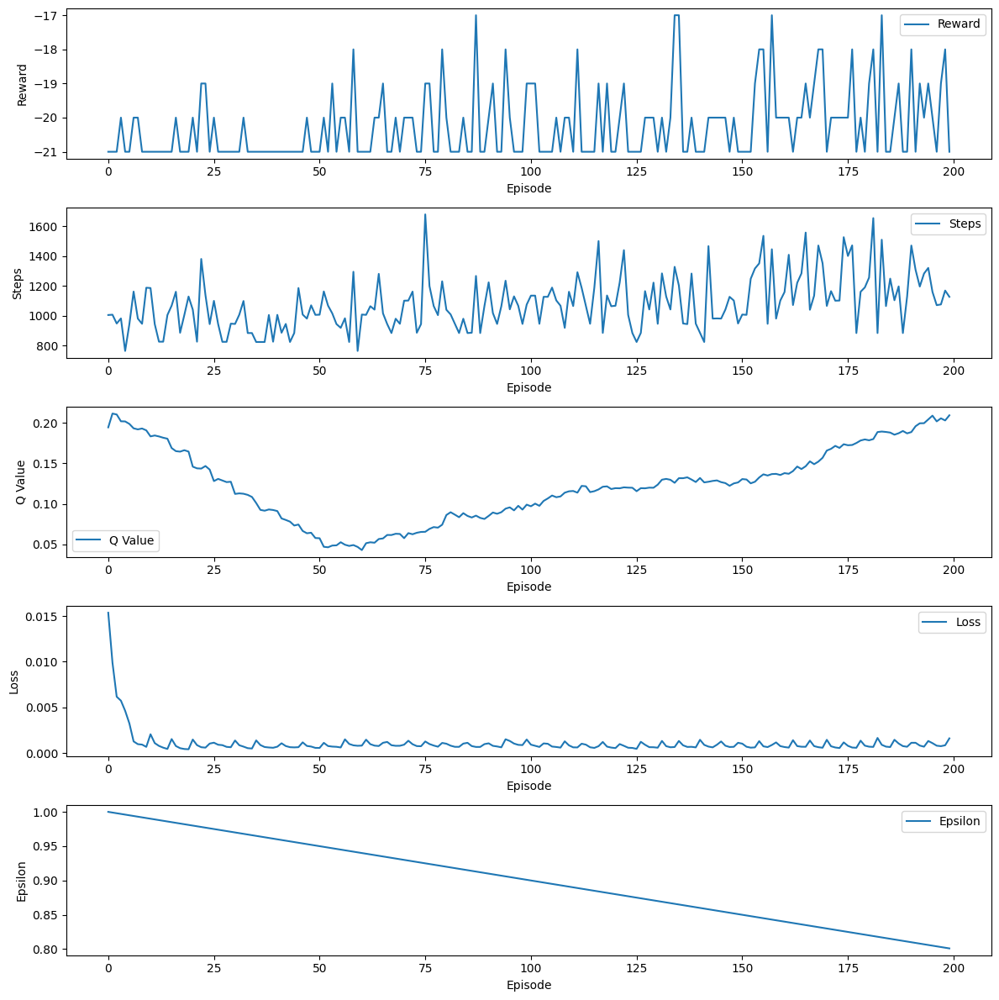

Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-200.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-200.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-200.mp4
Episode 201 abgeschlossen mit 1309 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.7999999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-201.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-201.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-201.mp4
Episode 202 abgeschlossen mit 1221 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.7989999999999998




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-202.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-202.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-202.mp4
Episode 203 abgeschlossen mit 1256 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.7979999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-203.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-203.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-203.mp4
Episode 204 abgeschlossen mit 1129 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.7969999999999998




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-204.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-204.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-204.mp4


Episode 205 abgeschlossen mit 1130 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.7959999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-205.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-205.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-205.mp4
Episode 206 abgeschlossen mit 1355 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.7949999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-206.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-206.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-206.mp4
Episode 207 abgeschlossen mit 1043 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.7939999999999998




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-207.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-207.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-207.mp4
Episode 208 abgeschlossen mit 1189 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.7929999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-208.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-208.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-208.mp4
Episode 209 abgeschlossen mit 1679 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.7919999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-209.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-209.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-209.mp4
Episode 210 abgeschlossen mit 1102 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.7909999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-210.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-210.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-210.mp4
Episode 211 abgeschlossen mit 1561 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.7899999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-211.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-211.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-211.mp4
Episode 212 abgeschlossen mit 2080 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.7889999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-212.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-212.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-212.mp4
Episode 213 abgeschlossen mit 1220 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.7879999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-213.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-213.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-213.mp4
Episode 214 abgeschlossen mit 1162 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.7869999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-214.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-214.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-214.mp4
Episode 215 abgeschlossen mit 1346 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.7859999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-215.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-215.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-215.mp4
Episode 216 abgeschlossen mit 1099 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.7849999999999998




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-216.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-216.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-216.mp4


Episode 217 abgeschlossen mit 1248 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.7839999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-217.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-217.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-217.mp4
Episode 218 abgeschlossen mit 1186 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.7829999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-218.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-218.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-218.mp4
Episode 219 abgeschlossen mit 1597 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.7819999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-219.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-219.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-219.mp4


Episode 220 abgeschlossen mit 1127 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.7809999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-220.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-220.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-220.mp4


Episode 221 abgeschlossen mit 1195 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.7799999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-221.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-221.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-221.mp4
Episode 222 abgeschlossen mit 1221 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.7789999999999998




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-222.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-222.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-222.mp4
Episode 223 abgeschlossen mit 948 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.7779999999999998




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-223.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-223.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-223.mp4
Episode 224 abgeschlossen mit 1198 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.7769999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-224.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-224.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-224.mp4
Episode 225 abgeschlossen mit 1593 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.7759999999999998




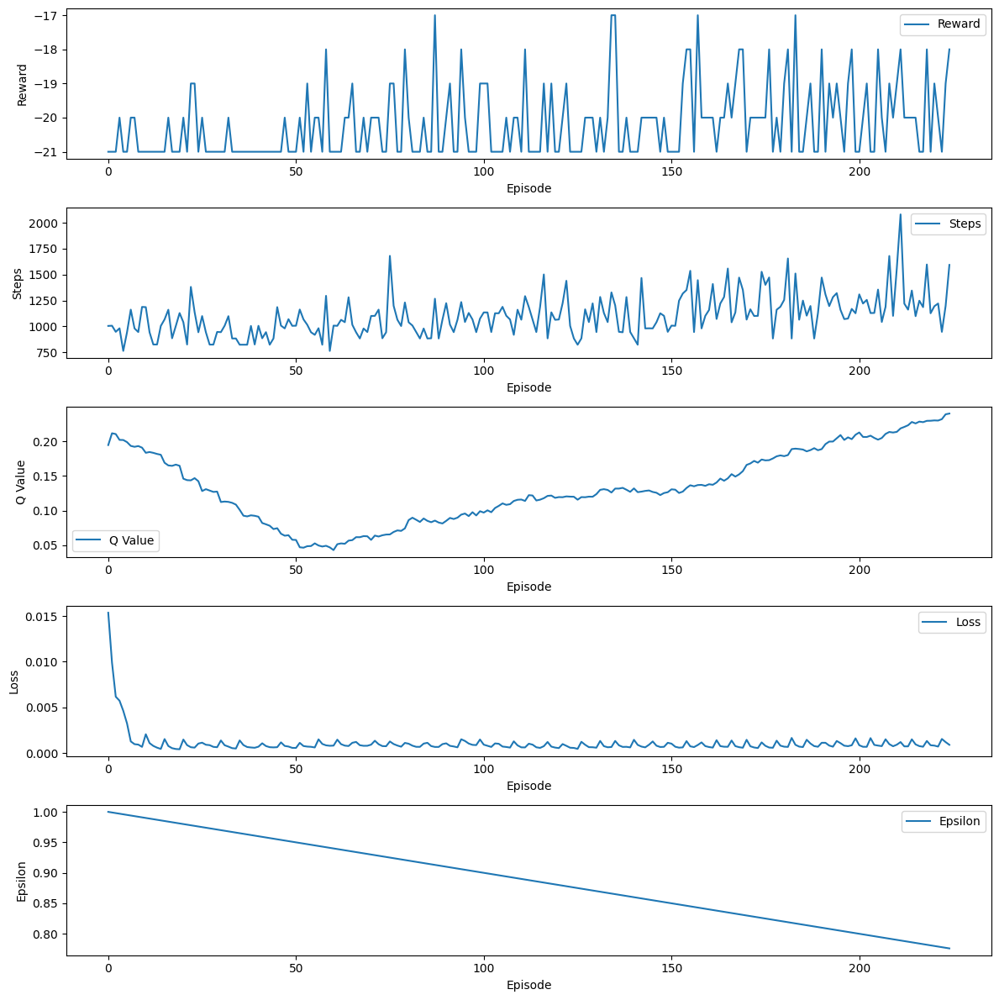

Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-225.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-225.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-225.mp4
Episode 226 abgeschlossen mit 1551 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.7749999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-226.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-226.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-226.mp4
Episode 227 abgeschlossen mit 1400 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.7739999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-227.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-227.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-227.mp4


Episode 228 abgeschlossen mit 1258 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.7729999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-228.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-228.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-228.mp4
Episode 229 abgeschlossen mit 1967 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.7719999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-229.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-229.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-229.mp4


Episode 230 abgeschlossen mit 1196 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.7709999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-230.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-230.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-230.mp4


Episode 231 abgeschlossen mit 1162 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.7699999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-231.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-231.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-231.mp4
Episode 232 abgeschlossen mit 1643 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.7689999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-232.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-232.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-232.mp4
Episode 233 abgeschlossen mit 1308 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.7679999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-233.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-233.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-233.mp4
Episode 234 abgeschlossen mit 1068 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.7669999999999998




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-234.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-234.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-234.mp4
Episode 235 abgeschlossen mit 1101 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.7659999999999998




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-235.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-235.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-235.mp4
Episode 236 abgeschlossen mit 1527 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.7649999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-236.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-236.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-236.mp4
Episode 237 abgeschlossen mit 946 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.7639999999999998




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-237.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-237.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-237.mp4
Episode 238 abgeschlossen mit 1378 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.7629999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-238.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-238.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-238.mp4
Episode 239 abgeschlossen mit 1536 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.7619999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-239.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-239.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-239.mp4


Episode 240 abgeschlossen mit 1137 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.7609999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-240.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-240.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-240.mp4
Episode 241 abgeschlossen mit 1385 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.7599999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-241.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-241.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-241.mp4


Episode 242 abgeschlossen mit 1223 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.7589999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-242.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-242.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-242.mp4
Episode 243 abgeschlossen mit 1374 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.7579999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-243.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-243.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-243.mp4
Episode 244 abgeschlossen mit 1475 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.7569999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-244.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-244.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-244.mp4
Episode 245 abgeschlossen mit 1385 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.7559999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-245.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-245.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-245.mp4
Episode 246 abgeschlossen mit 1343 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.7549999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-246.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-246.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-246.mp4
Episode 247 abgeschlossen mit 1403 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.7539999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-247.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-247.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-247.mp4
Episode 248 abgeschlossen mit 1307 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.7529999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-248.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-248.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-248.mp4
Episode 249 abgeschlossen mit 1229 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.7519999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-249.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-249.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-249.mp4
Episode 250 abgeschlossen mit 1318 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.7509999999999998




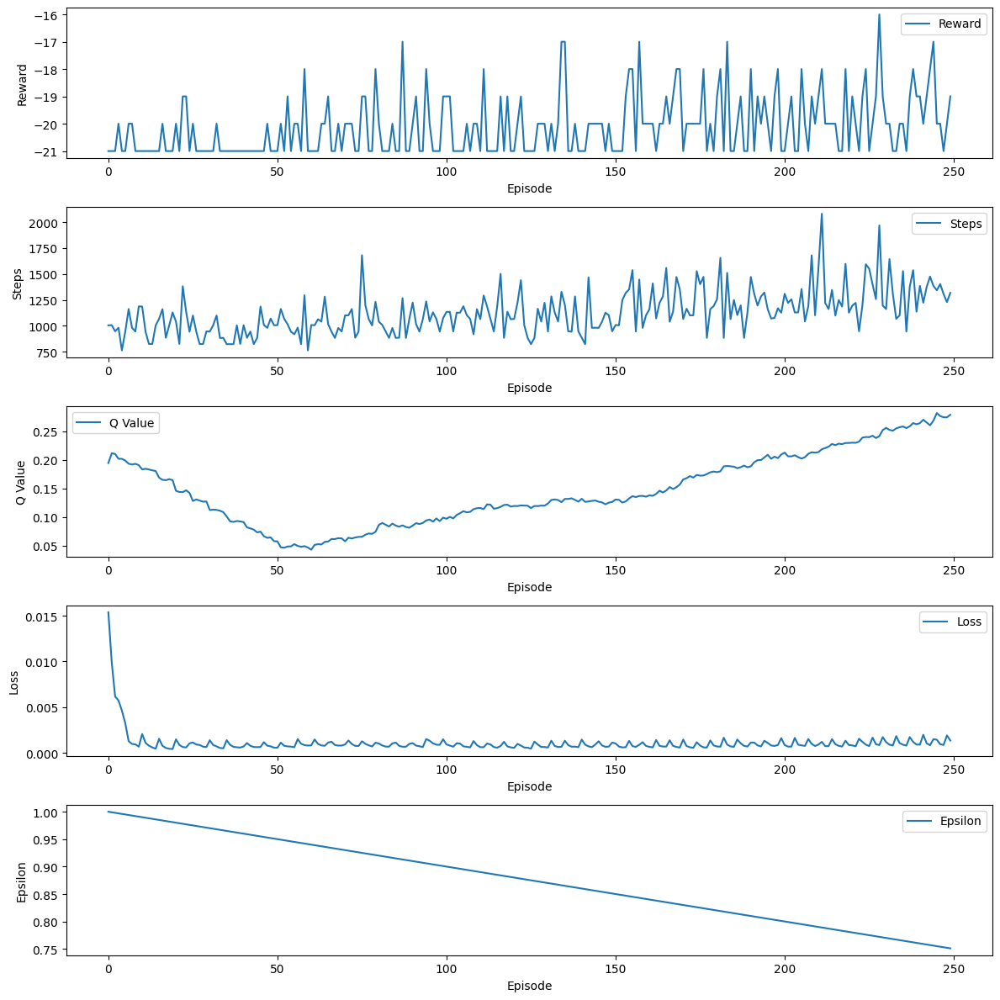

Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-250.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-250.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-250.mp4
Episode 251 abgeschlossen mit 1222 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.7499999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-251.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-251.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-251.mp4
Episode 252 abgeschlossen mit 1159 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.7489999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-252.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-252.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-252.mp4
Episode 253 abgeschlossen mit 1346 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.7479999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-253.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-253.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-253.mp4
Episode 254 abgeschlossen mit 1247 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.7469999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-254.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-254.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-254.mp4
Episode 255 abgeschlossen mit 1497 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.7459999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-255.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-255.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-255.mp4
Episode 256 abgeschlossen mit 920 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.7449999999999998




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-256.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-256.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-256.mp4
Episode 257 abgeschlossen mit 1260 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.7439999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-257.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-257.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-257.mp4
Episode 258 abgeschlossen mit 1306 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.7429999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-258.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-258.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-258.mp4
Episode 259 abgeschlossen mit 1587 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.7419999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-259.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-259.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-259.mp4
Episode 260 abgeschlossen mit 1382 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.7409999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-260.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-260.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-260.mp4
Episode 261 abgeschlossen mit 1371 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.7399999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-261.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-261.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-261.mp4
Episode 262 abgeschlossen mit 1382 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.7389999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-262.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-262.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-262.mp4
Episode 263 abgeschlossen mit 1257 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.7379999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-263.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-263.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-263.mp4
Episode 264 abgeschlossen mit 1368 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.7369999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-264.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-264.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-264.mp4
Episode 265 abgeschlossen mit 1562 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.7359999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-265.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-265.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-265.mp4
Episode 266 abgeschlossen mit 1604 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.7349999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-266.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-266.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-266.mp4
Episode 267 abgeschlossen mit 1571 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.7339999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-267.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-267.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-267.mp4
Episode 268 abgeschlossen mit 1501 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.7329999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-268.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-268.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-268.mp4
Episode 269 abgeschlossen mit 1354 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.7319999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-269.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-269.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-269.mp4
Episode 270 abgeschlossen mit 1905 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.7309999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-270.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-270.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-270.mp4
Episode 271 abgeschlossen mit 1246 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.7299999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-271.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-271.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-271.mp4
Episode 272 abgeschlossen mit 1347 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.7289999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-272.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-272.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-272.mp4
Episode 273 abgeschlossen mit 1163 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.7279999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-273.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-273.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-273.mp4
Episode 274 abgeschlossen mit 1505 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.7269999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-274.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-274.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-274.mp4
Episode 275 abgeschlossen mit 1129 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.7259999999999998




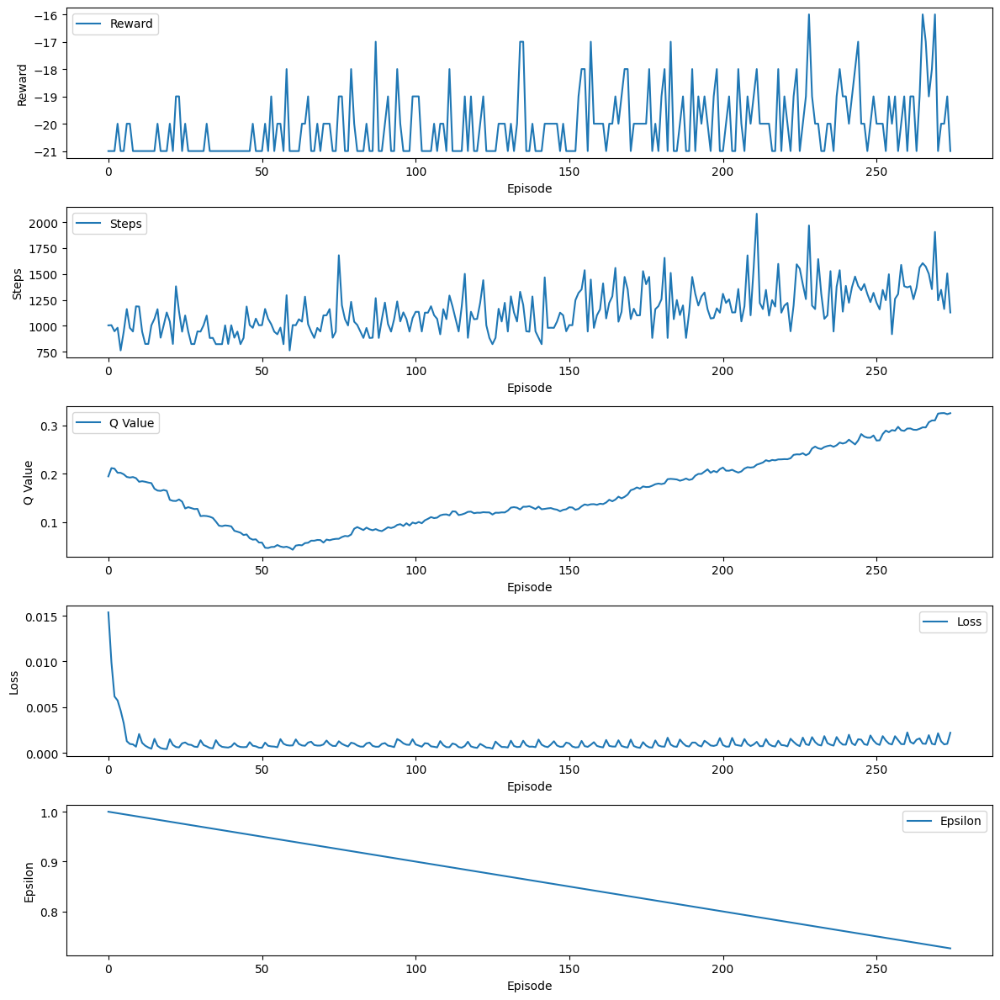

Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-275.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-275.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-275.mp4
Episode 276 abgeschlossen mit 1526 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.7249999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-276.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-276.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-276.mp4
Episode 277 abgeschlossen mit 1467 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.7239999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-277.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-277.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-277.mp4
Episode 278 abgeschlossen mit 1317 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.7229999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-278.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-278.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-278.mp4
Episode 279 abgeschlossen mit 1345 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.7219999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-279.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-279.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-279.mp4


Episode 280 abgeschlossen mit 1249 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.7209999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-280.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-280.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-280.mp4
Episode 281 abgeschlossen mit 1317 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.7199999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-281.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-281.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-281.mp4
Episode 282 abgeschlossen mit 1804 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.7189999999999998


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-282.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-282.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-282.mp4
Episode 283 abgeschlossen mit 1320 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.7179999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-283.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-283.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-283.mp4
Episode 284 abgeschlossen mit 1285 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.7169999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-284.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-284.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-284.mp4
Episode 285 abgeschlossen mit 1008 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.7159999999999997




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-285.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-285.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-285.mp4
Episode 286 abgeschlossen mit 1905 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.7149999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-286.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-286.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-286.mp4
Episode 287 abgeschlossen mit 1663 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.7139999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-287.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-287.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-287.mp4
Episode 288 abgeschlossen mit 1188 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.7129999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-288.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-288.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-288.mp4
Episode 289 abgeschlossen mit 1416 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.7119999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-289.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-289.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-289.mp4
Episode 290 abgeschlossen mit 1752 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.7109999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-290.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-290.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-290.mp4
Episode 291 abgeschlossen mit 1654 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.7099999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-291.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-291.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-291.mp4
Episode 292 abgeschlossen mit 1367 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.7089999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-292.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-292.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-292.mp4
Episode 293 abgeschlossen mit 1403 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.7079999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-293.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-293.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-293.mp4
Episode 294 abgeschlossen mit 1005 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.7069999999999997




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-294.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-294.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-294.mp4
Episode 295 abgeschlossen mit 1931 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.7059999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-295.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-295.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-295.mp4
Episode 296 abgeschlossen mit 1484 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.7049999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-296.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-296.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-296.mp4
Episode 297 abgeschlossen mit 1100 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.7039999999999997




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-297.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-297.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-297.mp4


Episode 298 abgeschlossen mit 1101 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.7029999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-298.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-298.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-298.mp4
Episode 299 abgeschlossen mit 1620 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.7019999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-299.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-299.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-299.mp4
Episode 300 abgeschlossen mit 1222 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.7009999999999997




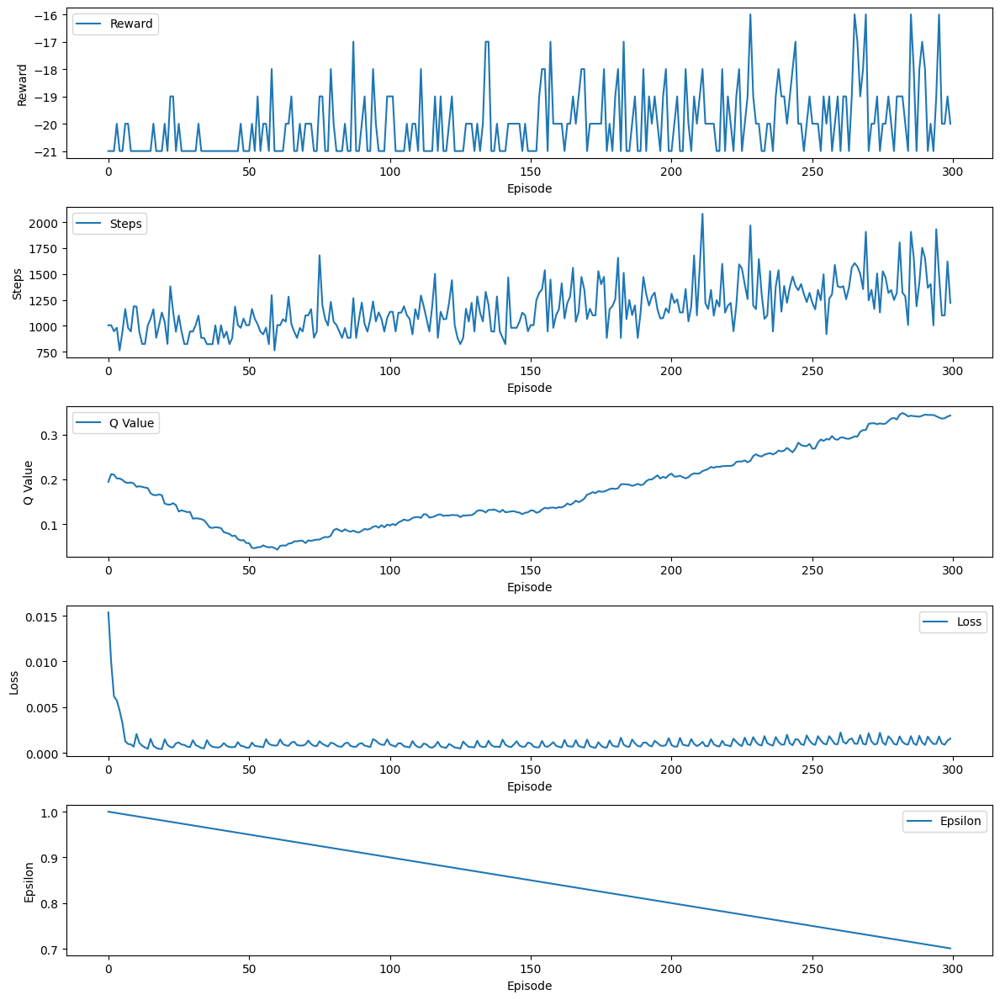

Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-300.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-300.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-300.mp4
Episode 301 abgeschlossen mit 1127 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.6999999999999997




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-301.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-301.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-301.mp4
Episode 302 abgeschlossen mit 1430 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.6989999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-302.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-302.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-302.mp4
Episode 303 abgeschlossen mit 1381 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.6979999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-303.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-303.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-303.mp4
Episode 304 abgeschlossen mit 1502 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.6969999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-304.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-304.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-304.mp4
Episode 305 abgeschlossen mit 1287 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.6959999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-305.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-305.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-305.mp4
Episode 306 abgeschlossen mit 1377 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.6949999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-306.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-306.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-306.mp4
Episode 307 abgeschlossen mit 1225 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.6939999999999997




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-307.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-307.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-307.mp4


Episode 308 abgeschlossen mit 1099 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.6929999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-308.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-308.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-308.mp4
Episode 309 abgeschlossen mit 1497 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.6919999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-309.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-309.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-309.mp4
Episode 310 abgeschlossen mit 1647 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.6909999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-310.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-310.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-310.mp4
Episode 311 abgeschlossen mit 1065 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.6899999999999997




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-311.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-311.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-311.mp4
Episode 312 abgeschlossen mit 1353 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.6889999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-312.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-312.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-312.mp4


Episode 313 abgeschlossen mit 1251 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.6879999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-313.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-313.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-313.mp4
Episode 314 abgeschlossen mit 2050 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.6869999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-314.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-314.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-314.mp4
Episode 315 abgeschlossen mit 1567 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.6859999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-315.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-315.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-315.mp4
Episode 316 abgeschlossen mit 1282 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.6849999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-316.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-316.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-316.mp4
Episode 317 abgeschlossen mit 1562 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.6839999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-317.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-317.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-317.mp4
Episode 318 abgeschlossen mit 1573 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.6829999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-318.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-318.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-318.mp4
Episode 319 abgeschlossen mit 1321 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.6819999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-319.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-319.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-319.mp4
Episode 320 abgeschlossen mit 1441 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.6809999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-320.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-320.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-320.mp4


Episode 321 abgeschlossen mit 1247 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.6799999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-321.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-321.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-321.mp4
Episode 322 abgeschlossen mit 1377 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.6789999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-322.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-322.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-322.mp4
Episode 323 abgeschlossen mit 1076 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.6779999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-323.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-323.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-323.mp4
Episode 324 abgeschlossen mit 947 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.6769999999999997




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-324.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-324.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-324.mp4
Episode 325 abgeschlossen mit 1450 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.6759999999999997




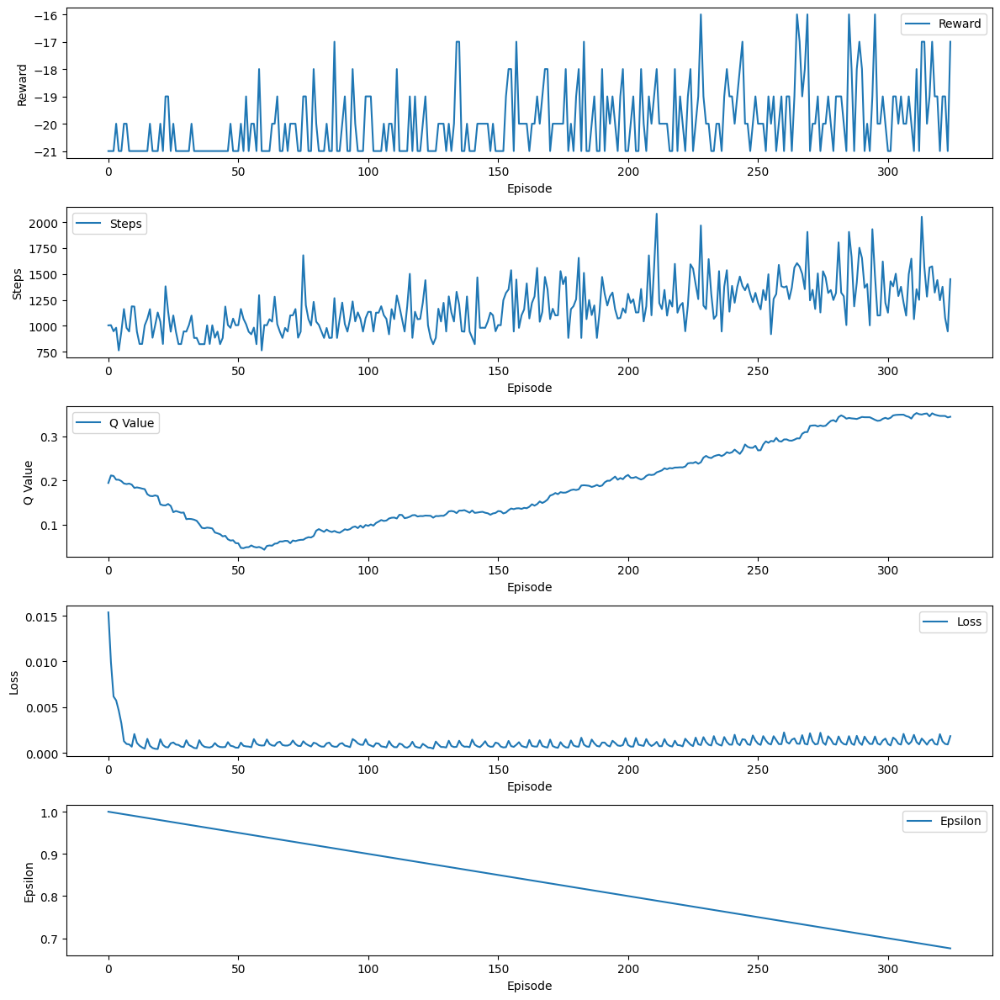

Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-325.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-325.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-325.mp4
Episode 326 abgeschlossen mit 1466 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.6749999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-326.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-326.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-326.mp4


Episode 327 abgeschlossen mit 1190 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.6739999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-327.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-327.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-327.mp4
Episode 328 abgeschlossen mit 2038 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.6729999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-328.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-328.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-328.mp4
Episode 329 abgeschlossen mit 1366 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.6719999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-329.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-329.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-329.mp4
Episode 330 abgeschlossen mit 1565 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.6709999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-330.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-330.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-330.mp4


Episode 331 abgeschlossen mit 1100 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.6699999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-331.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-331.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-331.mp4
Episode 332 abgeschlossen mit 1775 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.6689999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-332.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-332.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-332.mp4
Episode 333 abgeschlossen mit 1639 Schritten, Gesamtbelohnung: -15.0, Epsilon: 0.6679999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-333.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-333.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-333.mp4
Episode 334 abgeschlossen mit 1628 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.6669999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-334.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-334.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-334.mp4


Episode 335 abgeschlossen mit 1161 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.6659999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-335.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-335.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-335.mp4
Episode 336 abgeschlossen mit 1316 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.6649999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-336.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-336.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-336.mp4
Episode 337 abgeschlossen mit 1463 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.6639999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-337.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-337.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-337.mp4
Episode 338 abgeschlossen mit 1220 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.6629999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-338.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-338.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-338.mp4
Episode 339 abgeschlossen mit 1247 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.6619999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-339.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-339.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-339.mp4
Episode 340 abgeschlossen mit 1826 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.6609999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-340.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-340.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-340.mp4
Episode 341 abgeschlossen mit 1281 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.6599999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-341.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-341.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-341.mp4
Episode 342 abgeschlossen mit 1701 Schritten, Gesamtbelohnung: -15.0, Epsilon: 0.6589999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-342.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-342.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-342.mp4
Episode 343 abgeschlossen mit 1381 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.6579999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-343.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-343.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-343.mp4
Episode 344 abgeschlossen mit 1312 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.6569999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-344.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-344.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-344.mp4
Episode 345 abgeschlossen mit 1477 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.6559999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-345.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-345.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-345.mp4
Episode 346 abgeschlossen mit 1551 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.6549999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-346.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-346.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-346.mp4
Episode 347 abgeschlossen mit 1586 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.6539999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-347.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-347.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-347.mp4
Episode 348 abgeschlossen mit 1596 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.6529999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-348.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-348.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-348.mp4
Episode 349 abgeschlossen mit 2065 Schritten, Gesamtbelohnung: -15.0, Epsilon: 0.6519999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-349.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-349.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-349.mp4
Episode 350 abgeschlossen mit 1065 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.6509999999999997




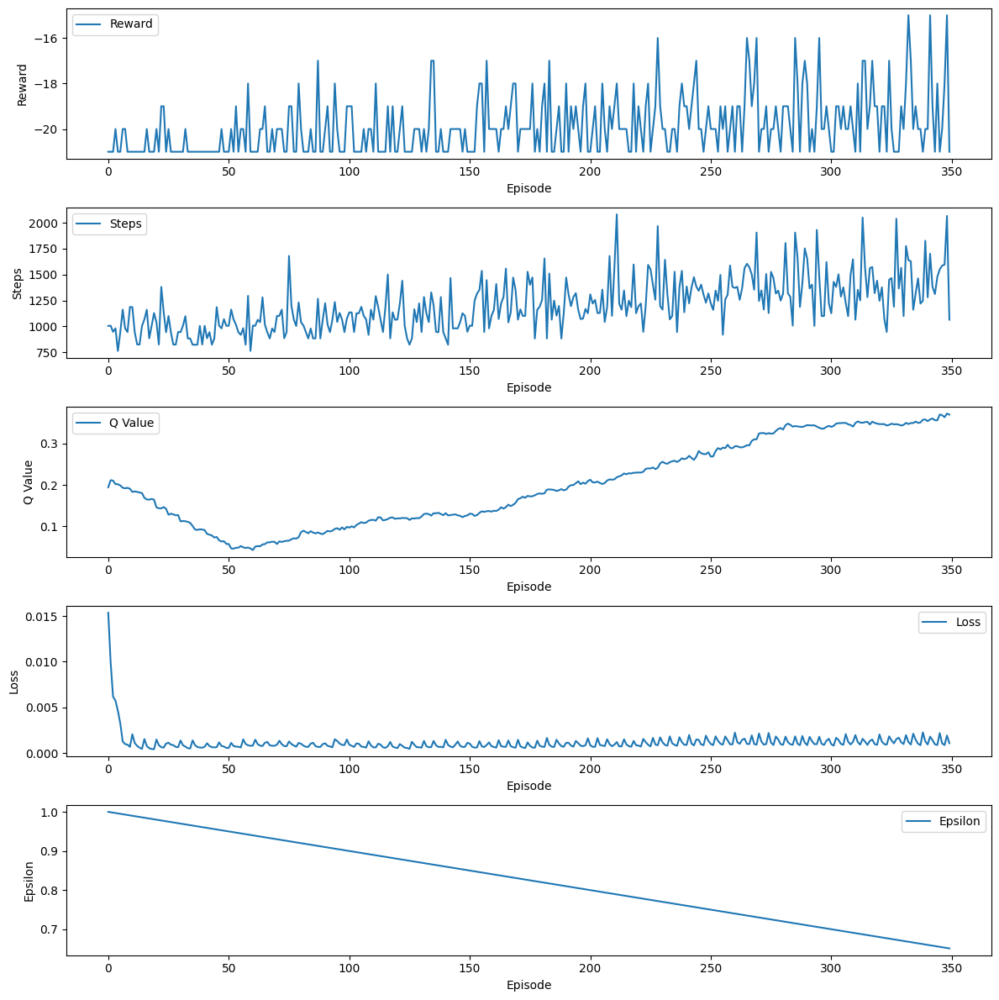

Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-350.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-350.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-350.mp4


Episode 351 abgeschlossen mit 1130 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.6499999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-351.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-351.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-351.mp4
Episode 352 abgeschlossen mit 1624 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.6489999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-352.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-352.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-352.mp4
Episode 353 abgeschlossen mit 1473 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.6479999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-353.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-353.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-353.mp4
Episode 354 abgeschlossen mit 1836 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.6469999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-354.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-354.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-354.mp4
Episode 355 abgeschlossen mit 1695 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.6459999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-355.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-355.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-355.mp4
Episode 356 abgeschlossen mit 1917 Schritten, Gesamtbelohnung: -14.0, Epsilon: 0.6449999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-356.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-356.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-356.mp4
Episode 357 abgeschlossen mit 1524 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.6439999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-357.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-357.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-357.mp4
Episode 358 abgeschlossen mit 1250 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.6429999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-358.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-358.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-358.mp4
Episode 359 abgeschlossen mit 2302 Schritten, Gesamtbelohnung: -15.0, Epsilon: 0.6419999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-359.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-359.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-359.mp4
Episode 360 abgeschlossen mit 1776 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.6409999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-360.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-360.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-360.mp4
Episode 361 abgeschlossen mit 1404 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.6399999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-361.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-361.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-361.mp4
Episode 362 abgeschlossen mit 1745 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.6389999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-362.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-362.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-362.mp4
Episode 363 abgeschlossen mit 1767 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.6379999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-363.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-363.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-363.mp4
Episode 364 abgeschlossen mit 1803 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.6369999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-364.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-364.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-364.mp4
Episode 365 abgeschlossen mit 2019 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.6359999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-365.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-365.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-365.mp4
Episode 366 abgeschlossen mit 2075 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.6349999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-366.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-366.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-366.mp4
Episode 367 abgeschlossen mit 1469 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.6339999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-367.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-367.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-367.mp4
Episode 368 abgeschlossen mit 1551 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.6329999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-368.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-368.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-368.mp4
Episode 369 abgeschlossen mit 1401 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.6319999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-369.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-369.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-369.mp4
Episode 370 abgeschlossen mit 1377 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.6309999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-370.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-370.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-370.mp4
Episode 371 abgeschlossen mit 1468 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.6299999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-371.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-371.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-371.mp4
Episode 372 abgeschlossen mit 1665 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.6289999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-372.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-372.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-372.mp4
Episode 373 abgeschlossen mit 1853 Schritten, Gesamtbelohnung: -14.0, Epsilon: 0.6279999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-373.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-373.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-373.mp4
Episode 374 abgeschlossen mit 1891 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.6269999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-374.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-374.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-374.mp4
Episode 375 abgeschlossen mit 1624 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.6259999999999997




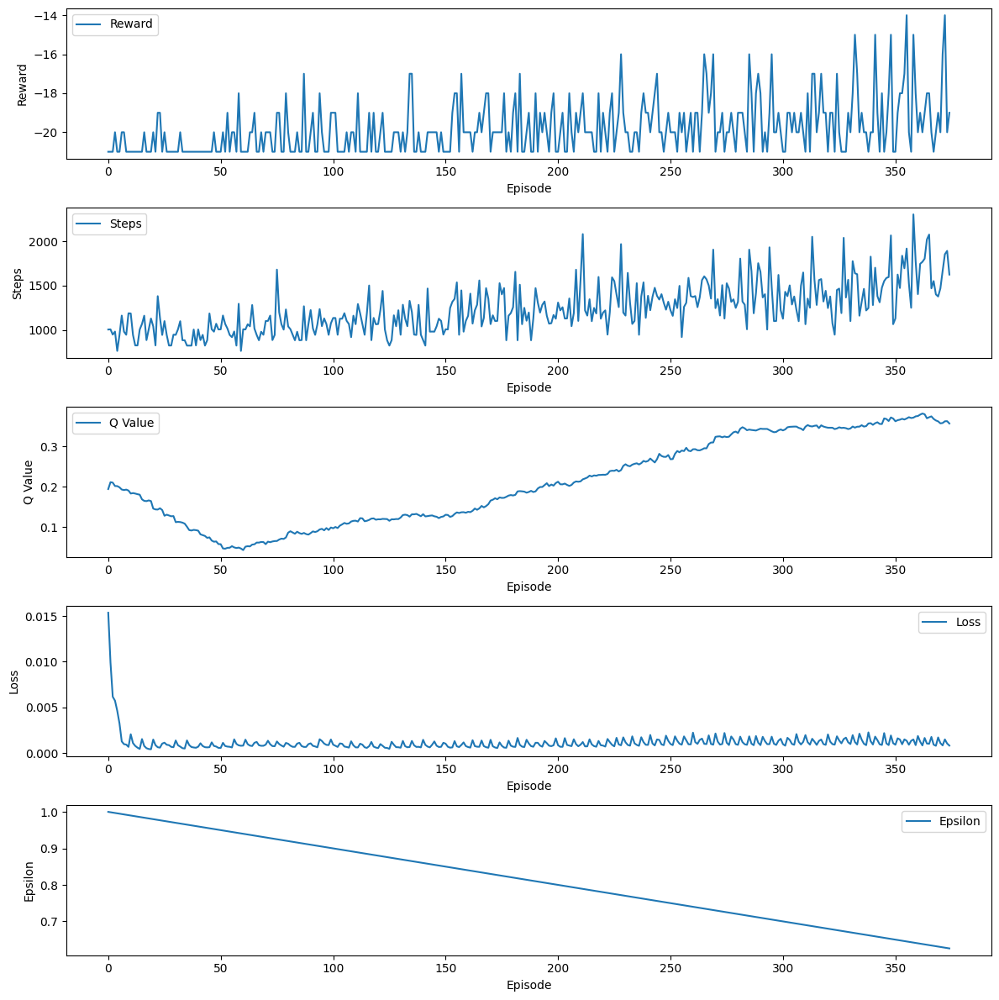

Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-375.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-375.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-375.mp4
Episode 376 abgeschlossen mit 1902 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.6249999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-376.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-376.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-376.mp4
Episode 377 abgeschlossen mit 1342 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.6239999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-377.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-377.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-377.mp4
Episode 378 abgeschlossen mit 1234 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.6229999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-378.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-378.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-378.mp4
Episode 379 abgeschlossen mit 1435 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.6219999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-379.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-379.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-379.mp4
Episode 380 abgeschlossen mit 1588 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.6209999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-380.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-380.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-380.mp4
Episode 381 abgeschlossen mit 1368 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.6199999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-381.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-381.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-381.mp4
Episode 382 abgeschlossen mit 1899 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.6189999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-382.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-382.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-382.mp4
Episode 383 abgeschlossen mit 1748 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.6179999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-383.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-383.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-383.mp4
Episode 384 abgeschlossen mit 1802 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.6169999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-384.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-384.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-384.mp4
Episode 385 abgeschlossen mit 2177 Schritten, Gesamtbelohnung: -15.0, Epsilon: 0.6159999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-385.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-385.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-385.mp4
Episode 386 abgeschlossen mit 2531 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.6149999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-386.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-386.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-386.mp4
Episode 387 abgeschlossen mit 1665 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.6139999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-387.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-387.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-387.mp4
Episode 388 abgeschlossen mit 1644 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.6129999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-388.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-388.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-388.mp4
Episode 389 abgeschlossen mit 1922 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.6119999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-389.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-389.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-389.mp4
Episode 390 abgeschlossen mit 2336 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.6109999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-390.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-390.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-390.mp4
Episode 391 abgeschlossen mit 1666 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.6099999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-391.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-391.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-391.mp4
Episode 392 abgeschlossen mit 2171 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.6089999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-392.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-392.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-392.mp4
Episode 393 abgeschlossen mit 1462 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.6079999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-393.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-393.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-393.mp4
Episode 394 abgeschlossen mit 1319 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.6069999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-394.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-394.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-394.mp4
Episode 395 abgeschlossen mit 1373 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.6059999999999997


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-395.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-395.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-395.mp4
Episode 396 abgeschlossen mit 1285 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.6049999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-396.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-396.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-396.mp4
Episode 397 abgeschlossen mit 1741 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.6039999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-397.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-397.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-397.mp4
Episode 398 abgeschlossen mit 1535 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.6029999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-398.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-398.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-398.mp4
Episode 399 abgeschlossen mit 1823 Schritten, Gesamtbelohnung: -15.0, Epsilon: 0.6019999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-399.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-399.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-399.mp4
Episode 400 abgeschlossen mit 1646 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.6009999999999996




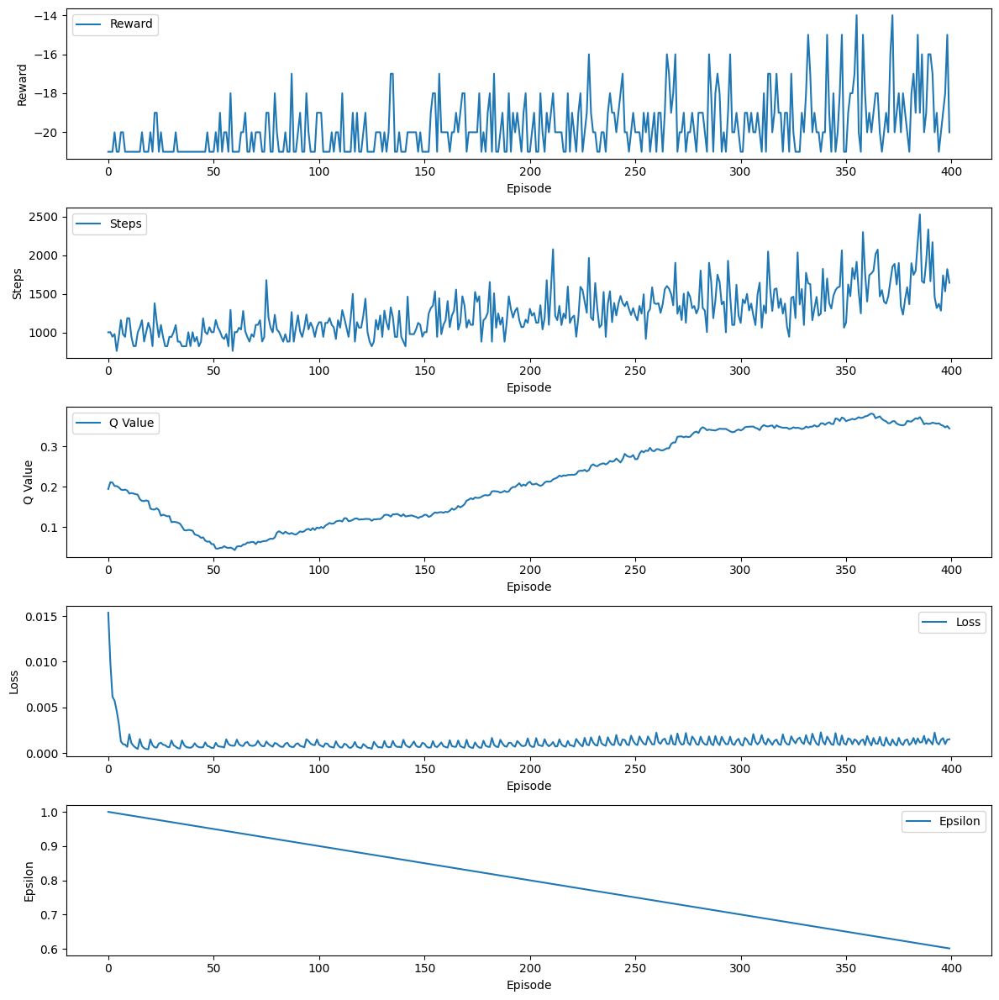

Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-400.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-400.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-400.mp4
Episode 401 abgeschlossen mit 1583 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.5999999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-401.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-401.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-401.mp4
Episode 402 abgeschlossen mit 1071 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.5989999999999996




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-402.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-402.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-402.mp4
Episode 403 abgeschlossen mit 1717 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.5979999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-403.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-403.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-403.mp4
Episode 404 abgeschlossen mit 1441 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.5969999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-404.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-404.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-404.mp4
Episode 405 abgeschlossen mit 1678 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.5959999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-405.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-405.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-405.mp4
Episode 406 abgeschlossen mit 1341 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.5949999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-406.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-406.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-406.mp4
Episode 407 abgeschlossen mit 1804 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.5939999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-407.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-407.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-407.mp4
Episode 408 abgeschlossen mit 1749 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.5929999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-408.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-408.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-408.mp4
Episode 409 abgeschlossen mit 1405 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.5919999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-409.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-409.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-409.mp4
Episode 410 abgeschlossen mit 1749 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.5909999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-410.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-410.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-410.mp4
Episode 411 abgeschlossen mit 1620 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.5899999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-411.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-411.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-411.mp4


Episode 412 abgeschlossen mit 1159 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.5889999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-412.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-412.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-412.mp4
Episode 413 abgeschlossen mit 2084 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.5879999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-413.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-413.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-413.mp4
Episode 414 abgeschlossen mit 1771 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.5869999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-414.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-414.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-414.mp4
Episode 415 abgeschlossen mit 1225 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.5859999999999996




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-415.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-415.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-415.mp4
Episode 416 abgeschlossen mit 1622 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.5849999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-416.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-416.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-416.mp4
Episode 417 abgeschlossen mit 1414 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.5839999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-417.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-417.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-417.mp4
Episode 418 abgeschlossen mit 2076 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.5829999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-418.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-418.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-418.mp4
Episode 419 abgeschlossen mit 2019 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.5819999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-419.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-419.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-419.mp4
Episode 420 abgeschlossen mit 1896 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.5809999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-420.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-420.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-420.mp4
Episode 421 abgeschlossen mit 1437 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.5799999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-421.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-421.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-421.mp4
Episode 422 abgeschlossen mit 1986 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.5789999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-422.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-422.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-422.mp4
Episode 423 abgeschlossen mit 1508 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.5779999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-423.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-423.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-423.mp4
Episode 424 abgeschlossen mit 2234 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.5769999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-424.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-424.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-424.mp4
Episode 425 abgeschlossen mit 1512 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.5759999999999996




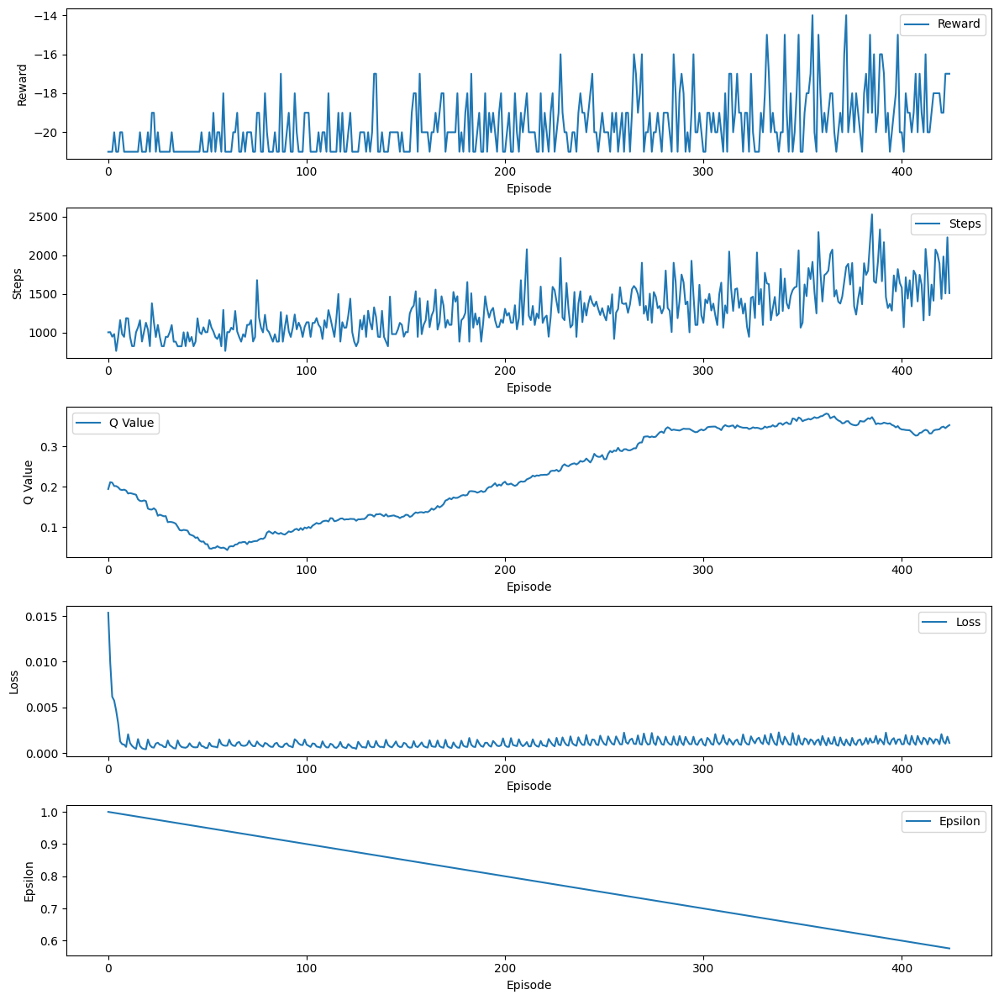

Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-425.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-425.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-425.mp4
Episode 426 abgeschlossen mit 1441 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.5749999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-426.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-426.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-426.mp4
Episode 427 abgeschlossen mit 1617 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.5739999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-427.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-427.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-427.mp4
Episode 428 abgeschlossen mit 1543 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.5729999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-428.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-428.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-428.mp4
Episode 429 abgeschlossen mit 1817 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.5719999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-429.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-429.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-429.mp4
Episode 430 abgeschlossen mit 1126 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.5709999999999996




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-430.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-430.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-430.mp4
Episode 431 abgeschlossen mit 2077 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.5699999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-431.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-431.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-431.mp4
Episode 432 abgeschlossen mit 1704 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.5689999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-432.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-432.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-432.mp4
Episode 433 abgeschlossen mit 1772 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.5679999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-433.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-433.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-433.mp4
Episode 434 abgeschlossen mit 1651 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.5669999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-434.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-434.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-434.mp4
Episode 435 abgeschlossen mit 1988 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.5659999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-435.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-435.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-435.mp4
Episode 436 abgeschlossen mit 2398 Schritten, Gesamtbelohnung: -14.0, Epsilon: 0.5649999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-436.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-436.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-436.mp4
Episode 437 abgeschlossen mit 1688 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.5639999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-437.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-437.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-437.mp4
Episode 438 abgeschlossen mit 1918 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.5629999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-438.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-438.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-438.mp4
Episode 439 abgeschlossen mit 1646 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.5619999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-439.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-439.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-439.mp4
Episode 440 abgeschlossen mit 1738 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.5609999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-440.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-440.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-440.mp4
Episode 441 abgeschlossen mit 1403 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.5599999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-441.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-441.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-441.mp4
Episode 442 abgeschlossen mit 1403 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.5589999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-442.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-442.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-442.mp4
Episode 443 abgeschlossen mit 1835 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.5579999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-443.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-443.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-443.mp4
Episode 444 abgeschlossen mit 2173 Schritten, Gesamtbelohnung: -10.0, Epsilon: 0.5569999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-444.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-444.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-444.mp4
Episode 445 abgeschlossen mit 1821 Schritten, Gesamtbelohnung: -15.0, Epsilon: 0.5559999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-445.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-445.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-445.mp4
Episode 446 abgeschlossen mit 1677 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.5549999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-446.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-446.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-446.mp4
Episode 447 abgeschlossen mit 1602 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.5539999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-447.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-447.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-447.mp4
Episode 448 abgeschlossen mit 1786 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.5529999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-448.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-448.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-448.mp4
Episode 449 abgeschlossen mit 1777 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.5519999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-449.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-449.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-449.mp4
Episode 450 abgeschlossen mit 1558 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.5509999999999996




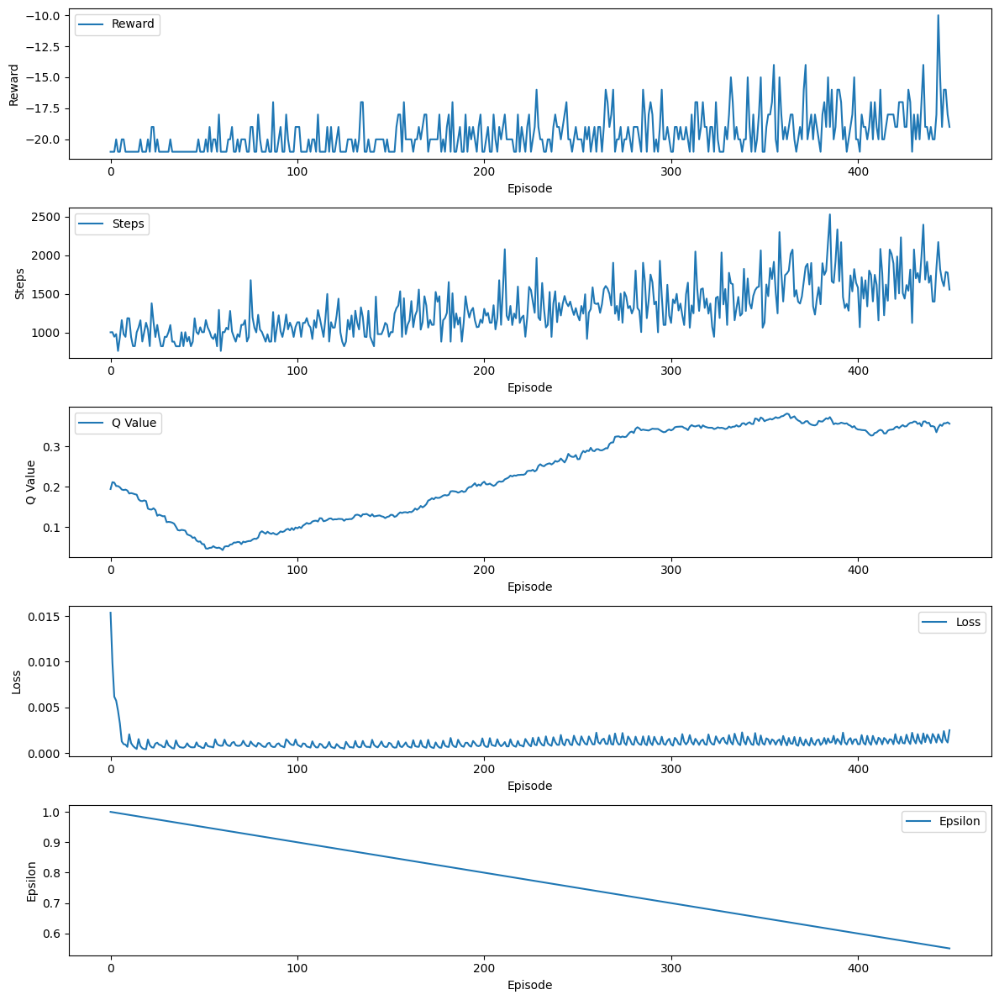

Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-450.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-450.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-450.mp4
Episode 451 abgeschlossen mit 2501 Schritten, Gesamtbelohnung: -11.0, Epsilon: 0.5499999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-451.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-451.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-451.mp4
Episode 452 abgeschlossen mit 1756 Schritten, Gesamtbelohnung: -15.0, Epsilon: 0.5489999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-452.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-452.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-452.mp4
Episode 453 abgeschlossen mit 1751 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.5479999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-453.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-453.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-453.mp4
Episode 454 abgeschlossen mit 1644 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.5469999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-454.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-454.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-454.mp4
Episode 455 abgeschlossen mit 1656 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.5459999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-455.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-455.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-455.mp4
Episode 456 abgeschlossen mit 1348 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.5449999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-456.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-456.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-456.mp4
Episode 457 abgeschlossen mit 1255 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.5439999999999996




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-457.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-457.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-457.mp4
Episode 458 abgeschlossen mit 1647 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.5429999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-458.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-458.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-458.mp4
Episode 459 abgeschlossen mit 1448 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.5419999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-459.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-459.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-459.mp4
Episode 460 abgeschlossen mit 1946 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.5409999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-460.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-460.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-460.mp4
Episode 461 abgeschlossen mit 1067 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.5399999999999996




Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-461.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-461.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-461.mp4
Episode 462 abgeschlossen mit 1344 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.5389999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-462.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-462.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-462.mp4
Episode 463 abgeschlossen mit 1938 Schritten, Gesamtbelohnung: -15.0, Epsilon: 0.5379999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-463.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-463.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-463.mp4
Episode 464 abgeschlossen mit 1776 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.5369999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-464.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-464.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-464.mp4
Episode 465 abgeschlossen mit 1793 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.5359999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-465.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-465.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-465.mp4
Episode 466 abgeschlossen mit 1928 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.5349999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-466.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-466.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-466.mp4
Episode 467 abgeschlossen mit 1284 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.5339999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-467.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-467.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-467.mp4
Episode 468 abgeschlossen mit 1488 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.5329999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-468.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-468.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-468.mp4
Episode 469 abgeschlossen mit 1824 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.5319999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-469.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-469.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-469.mp4
Episode 470 abgeschlossen mit 1775 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.5309999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-470.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-470.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-470.mp4
Episode 471 abgeschlossen mit 1671 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.5299999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-471.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-471.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-471.mp4
Episode 472 abgeschlossen mit 1772 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.5289999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-472.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-472.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-472.mp4
Episode 473 abgeschlossen mit 1742 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.5279999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-473.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-473.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-473.mp4
Episode 474 abgeschlossen mit 2139 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.5269999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-474.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-474.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-474.mp4
Episode 475 abgeschlossen mit 1595 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.5259999999999996




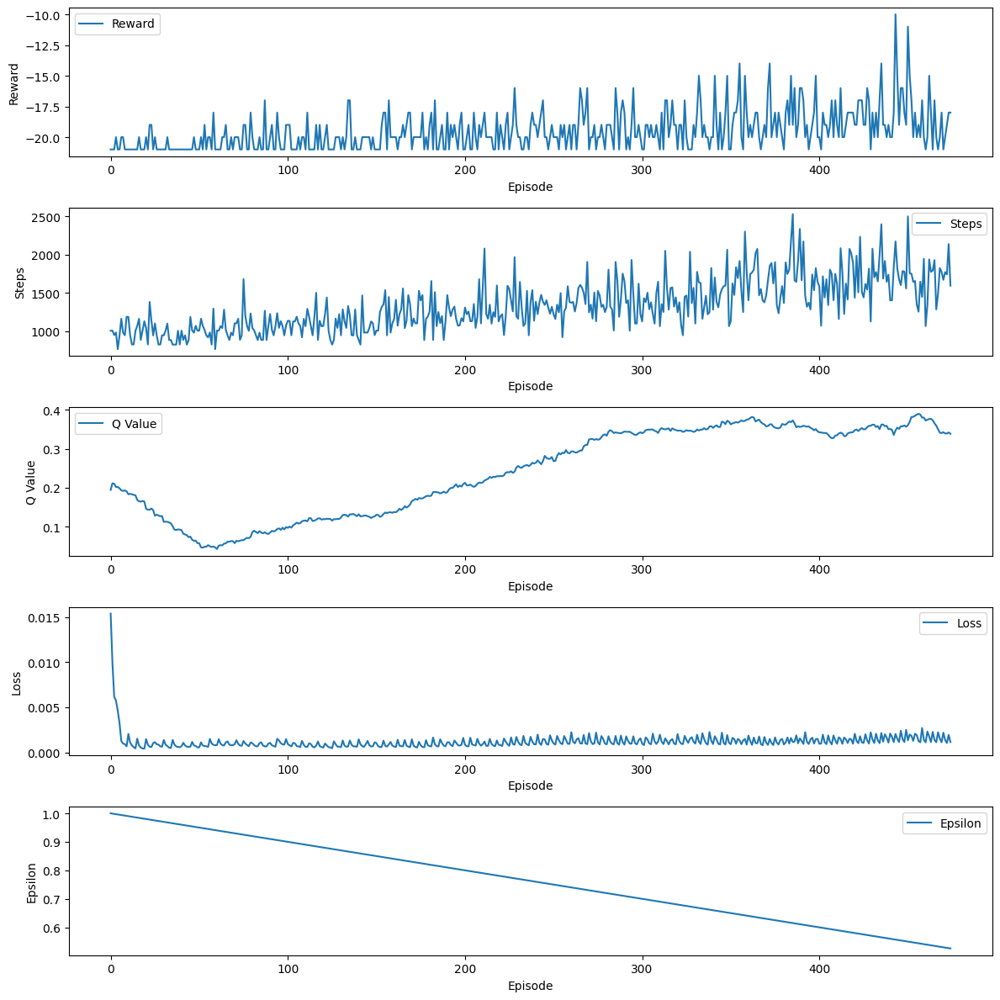

Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-475.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-475.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-475.mp4
Episode 476 abgeschlossen mit 1987 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.5249999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-476.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-476.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-476.mp4
Episode 477 abgeschlossen mit 2059 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.5239999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-477.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-477.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-477.mp4
Episode 478 abgeschlossen mit 2228 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.5229999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-478.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-478.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-478.mp4
Episode 479 abgeschlossen mit 1899 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.5219999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-479.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-479.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-479.mp4
Episode 480 abgeschlossen mit 1354 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.5209999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-480.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-480.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-480.mp4
Episode 481 abgeschlossen mit 1510 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.5199999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-481.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-481.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-481.mp4
Episode 482 abgeschlossen mit 2053 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.5189999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-482.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-482.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-482.mp4
Episode 483 abgeschlossen mit 1579 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.5179999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-483.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-483.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-483.mp4
Episode 484 abgeschlossen mit 2028 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.5169999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-484.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-484.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-484.mp4
Episode 485 abgeschlossen mit 1562 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.5159999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-485.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-485.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-485.mp4
Episode 486 abgeschlossen mit 1776 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.5149999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-486.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-486.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-486.mp4
Episode 487 abgeschlossen mit 1771 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.5139999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-487.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-487.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-487.mp4
Episode 488 abgeschlossen mit 2039 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.5129999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-488.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-488.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-488.mp4
Episode 489 abgeschlossen mit 1749 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.5119999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-489.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-489.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-489.mp4
Episode 490 abgeschlossen mit 1500 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.5109999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-490.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-490.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-490.mp4
Episode 491 abgeschlossen mit 2109 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.5099999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-491.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-491.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-491.mp4
Episode 492 abgeschlossen mit 2149 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.5089999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-492.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-492.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-492.mp4
Episode 493 abgeschlossen mit 2281 Schritten, Gesamtbelohnung: -14.0, Epsilon: 0.5079999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-493.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-493.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-493.mp4
Episode 494 abgeschlossen mit 1559 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.5069999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-494.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-494.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-494.mp4
Episode 495 abgeschlossen mit 1524 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.5059999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-495.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-495.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-495.mp4
Episode 496 abgeschlossen mit 2192 Schritten, Gesamtbelohnung: -13.0, Epsilon: 0.5049999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-496.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-496.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-496.mp4
Episode 497 abgeschlossen mit 1583 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.5039999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-497.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-497.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-497.mp4
Episode 498 abgeschlossen mit 1847 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.5029999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-498.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-498.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-498.mp4
Episode 499 abgeschlossen mit 1782 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.5019999999999996


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-499.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-499.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-499.mp4
Episode 500 abgeschlossen mit 1533 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.5009999999999996




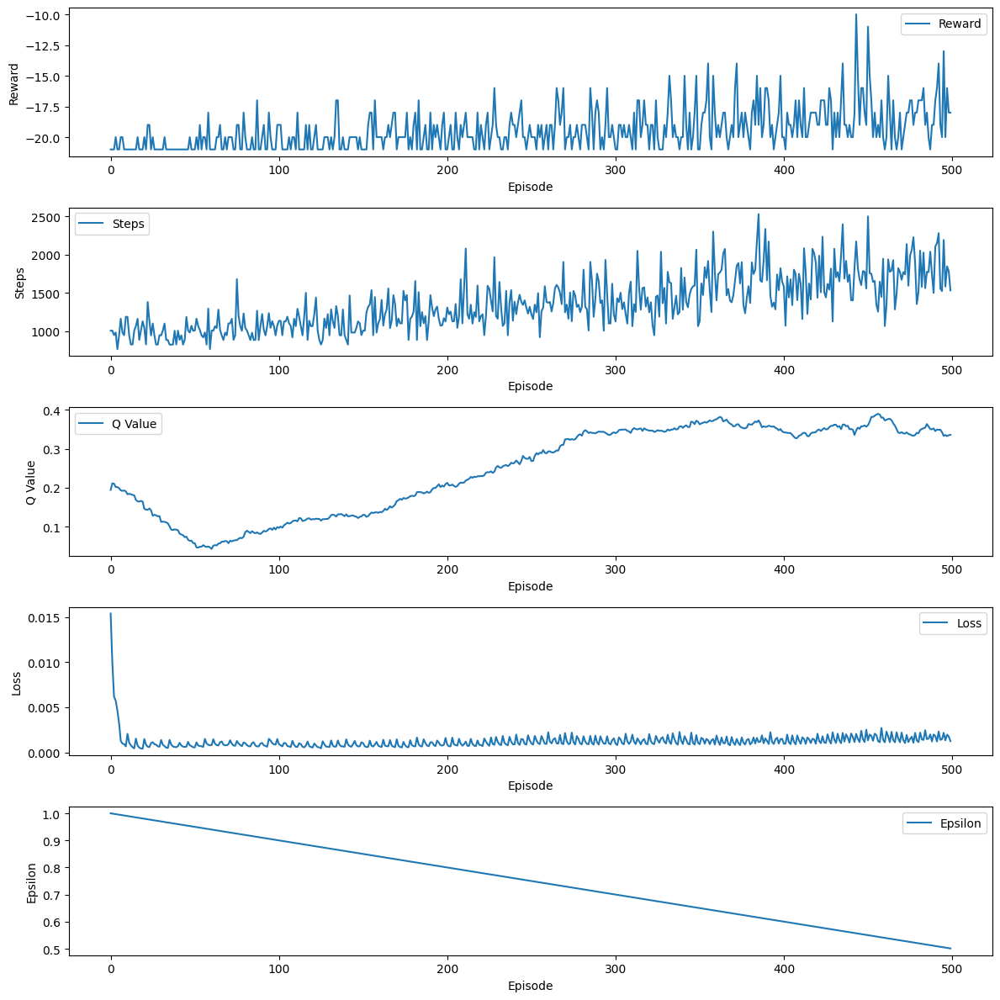

Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-500.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-500.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-500.mp4
Episode 501 abgeschlossen mit 1899 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.49999999999999956


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-501.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-501.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-501.mp4
Episode 502 abgeschlossen mit 1257 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.49899999999999956


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-502.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-502.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-502.mp4
Episode 503 abgeschlossen mit 1621 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.49799999999999955


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-503.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-503.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-503.mp4
Episode 504 abgeschlossen mit 1510 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.49699999999999955


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-504.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-504.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-504.mp4
Episode 505 abgeschlossen mit 2238 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.49599999999999955


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-505.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-505.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-505.mp4
Episode 506 abgeschlossen mit 1764 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.49499999999999955


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-506.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-506.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-506.mp4
Episode 507 abgeschlossen mit 1488 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.49399999999999955


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-507.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-507.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-507.mp4
Episode 508 abgeschlossen mit 2294 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.49299999999999955


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-508.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-508.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-508.mp4
Episode 509 abgeschlossen mit 1741 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.49199999999999955


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-509.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-509.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-509.mp4
Episode 510 abgeschlossen mit 1413 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.49099999999999955


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-510.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-510.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-510.mp4
Episode 511 abgeschlossen mit 1467 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.48999999999999955


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-511.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-511.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-511.mp4
Episode 512 abgeschlossen mit 2031 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.48899999999999955


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-512.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-512.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-512.mp4
Episode 513 abgeschlossen mit 1654 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.48799999999999955


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-513.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-513.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-513.mp4
Episode 514 abgeschlossen mit 1892 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.48699999999999954


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-514.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-514.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-514.mp4
Episode 515 abgeschlossen mit 1645 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.48599999999999954


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-515.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-515.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-515.mp4
Episode 516 abgeschlossen mit 1931 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.48499999999999954


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-516.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-516.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-516.mp4
Episode 517 abgeschlossen mit 1281 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.48399999999999954


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-517.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-517.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-517.mp4
Episode 518 abgeschlossen mit 2255 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.48299999999999954


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-518.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-518.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-518.mp4
Episode 519 abgeschlossen mit 1623 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.48199999999999954


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-519.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-519.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-519.mp4
Episode 520 abgeschlossen mit 2258 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.48099999999999954


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-520.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-520.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-520.mp4
Episode 521 abgeschlossen mit 2026 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.47999999999999954


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-521.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-521.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-521.mp4
Episode 522 abgeschlossen mit 1524 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.47899999999999954


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-522.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-522.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-522.mp4


Episode 523 abgeschlossen mit 1285 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.47799999999999954


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-523.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-523.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-523.mp4
Episode 524 abgeschlossen mit 2138 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.47699999999999954


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-524.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-524.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-524.mp4
Episode 525 abgeschlossen mit 1713 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.47599999999999953




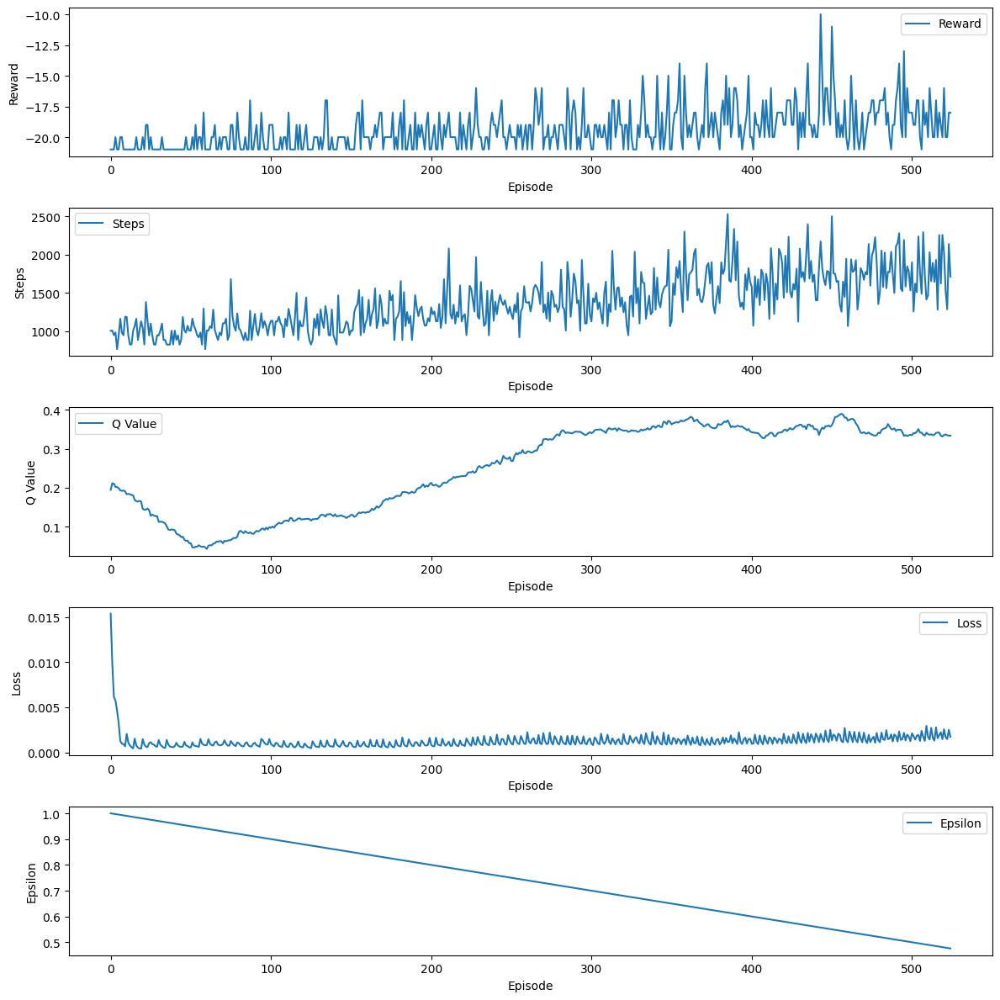

Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-525.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-525.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-525.mp4
Episode 526 abgeschlossen mit 1647 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.47499999999999953


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-526.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-526.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-526.mp4
Episode 527 abgeschlossen mit 2549 Schritten, Gesamtbelohnung: -15.0, Epsilon: 0.47399999999999953


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-527.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-527.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-527.mp4
Episode 528 abgeschlossen mit 2125 Schritten, Gesamtbelohnung: -15.0, Epsilon: 0.47299999999999953


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-528.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-528.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-528.mp4
Episode 529 abgeschlossen mit 1780 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.47199999999999953


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-529.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-529.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-529.mp4


Episode 530 abgeschlossen mit 1163 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.47099999999999953


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-530.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-530.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-530.mp4
Episode 531 abgeschlossen mit 2145 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.46999999999999953


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-531.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-531.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-531.mp4
Episode 532 abgeschlossen mit 2358 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.46899999999999953


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-532.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-532.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-532.mp4
Episode 533 abgeschlossen mit 1968 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.4679999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-533.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-533.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-533.mp4
Episode 534 abgeschlossen mit 2269 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.4669999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-534.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-534.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-534.mp4
Episode 535 abgeschlossen mit 1558 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.4659999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-535.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-535.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-535.mp4
Episode 536 abgeschlossen mit 1467 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.4649999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-536.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-536.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-536.mp4
Episode 537 abgeschlossen mit 1314 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.4639999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-537.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-537.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-537.mp4
Episode 538 abgeschlossen mit 1620 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.4629999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-538.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-538.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-538.mp4
Episode 539 abgeschlossen mit 1714 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.4619999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-539.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-539.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-539.mp4
Episode 540 abgeschlossen mit 1890 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.4609999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-540.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-540.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-540.mp4


Episode 541 abgeschlossen mit 1258 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.4599999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-541.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-541.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-541.mp4
Episode 542 abgeschlossen mit 1646 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.4589999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-542.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-542.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-542.mp4
Episode 543 abgeschlossen mit 1527 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.4579999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-543.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-543.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-543.mp4
Episode 544 abgeschlossen mit 1559 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.4569999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-544.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-544.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-544.mp4
Episode 545 abgeschlossen mit 2503 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.4559999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-545.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-545.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-545.mp4
Episode 546 abgeschlossen mit 1657 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.4549999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-546.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-546.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-546.mp4
Episode 547 abgeschlossen mit 1495 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.4539999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-547.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-547.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-547.mp4
Episode 548 abgeschlossen mit 1530 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.4529999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-548.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-548.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-548.mp4
Episode 549 abgeschlossen mit 1414 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.4519999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-549.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-549.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-549.mp4
Episode 550 abgeschlossen mit 1634 Schritten, Gesamtbelohnung: -15.0, Epsilon: 0.4509999999999995




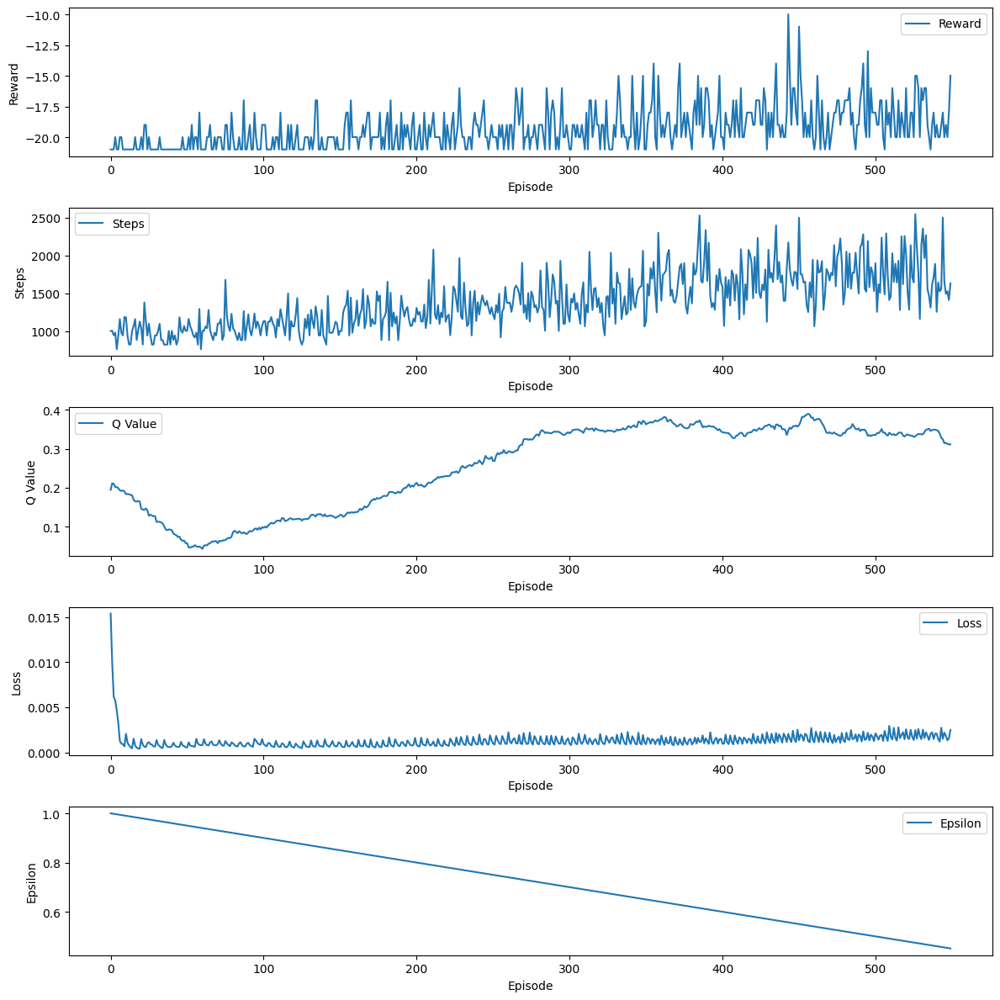

Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-550.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-550.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-550.mp4
Episode 551 abgeschlossen mit 1967 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.4499999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-551.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-551.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-551.mp4
Episode 552 abgeschlossen mit 1348 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.4489999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-552.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-552.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-552.mp4
Episode 553 abgeschlossen mit 2753 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.4479999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-553.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-553.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-553.mp4
Episode 554 abgeschlossen mit 1727 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.4469999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-554.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-554.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-554.mp4
Episode 555 abgeschlossen mit 1889 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.4459999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-555.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-555.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-555.mp4
Episode 556 abgeschlossen mit 1743 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.4449999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-556.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-556.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-556.mp4
Episode 557 abgeschlossen mit 1611 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.4439999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-557.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-557.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-557.mp4
Episode 558 abgeschlossen mit 1654 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.4429999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-558.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-558.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-558.mp4
Episode 559 abgeschlossen mit 1913 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.4419999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-559.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-559.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-559.mp4
Episode 560 abgeschlossen mit 2294 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.4409999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-560.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-560.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-560.mp4
Episode 561 abgeschlossen mit 1712 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.4399999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-561.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-561.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-561.mp4
Episode 562 abgeschlossen mit 2353 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.4389999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-562.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-562.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-562.mp4
Episode 563 abgeschlossen mit 1682 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.4379999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-563.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-563.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-563.mp4
Episode 564 abgeschlossen mit 1645 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.4369999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-564.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-564.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-564.mp4
Episode 565 abgeschlossen mit 1341 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.4359999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-565.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-565.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-565.mp4
Episode 566 abgeschlossen mit 1534 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.4349999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-566.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-566.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-566.mp4
Episode 567 abgeschlossen mit 1646 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.4339999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-567.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-567.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-567.mp4
Episode 568 abgeschlossen mit 1349 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.4329999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-568.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-568.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-568.mp4
Episode 569 abgeschlossen mit 1497 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.4319999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-569.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-569.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-569.mp4
Episode 570 abgeschlossen mit 2197 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.4309999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-570.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-570.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-570.mp4
Episode 571 abgeschlossen mit 1960 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.4299999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-571.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-571.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-571.mp4
Episode 572 abgeschlossen mit 1685 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.4289999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-572.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-572.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-572.mp4
Episode 573 abgeschlossen mit 1572 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.4279999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-573.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-573.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-573.mp4
Episode 574 abgeschlossen mit 1960 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.4269999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-574.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-574.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-574.mp4


Episode 575 abgeschlossen mit 1222 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.4259999999999995




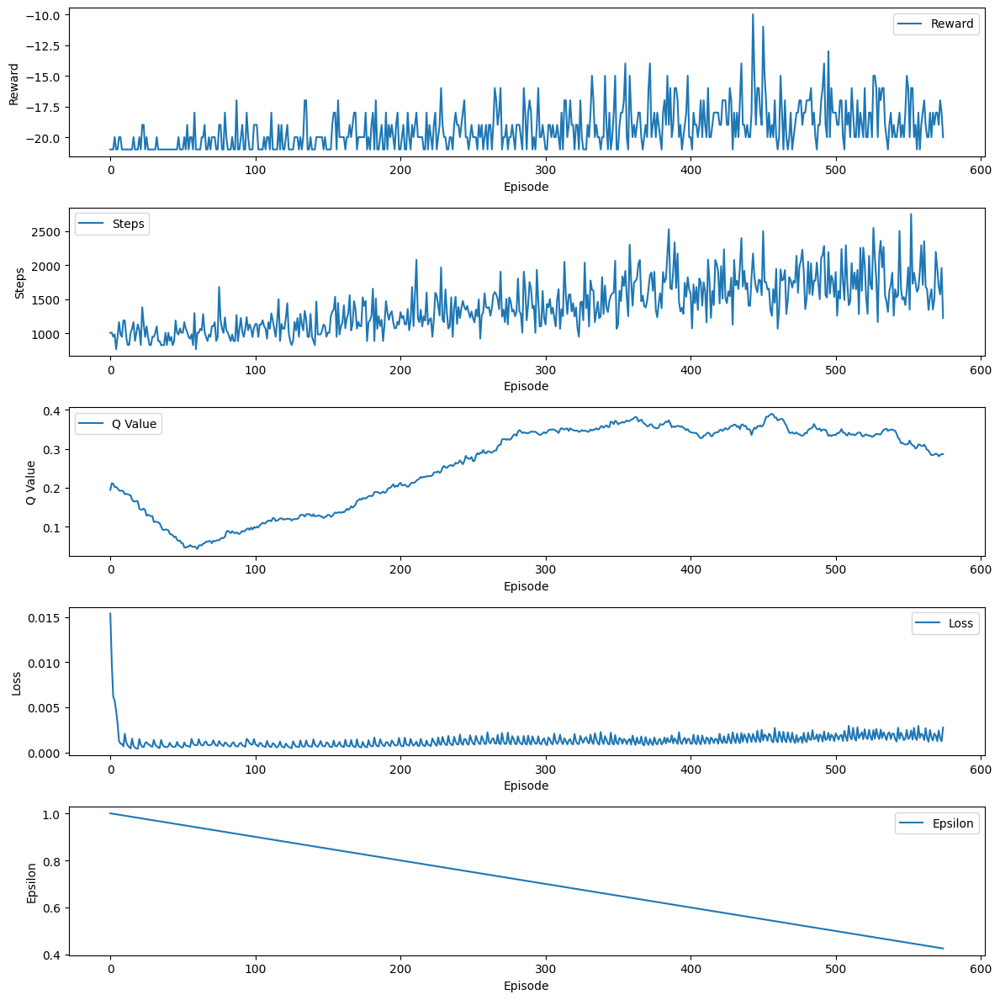

Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-575.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-575.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-575.mp4
Episode 576 abgeschlossen mit 1892 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.4249999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-576.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-576.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-576.mp4
Episode 577 abgeschlossen mit 1343 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.4239999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-577.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-577.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-577.mp4
Episode 578 abgeschlossen mit 1535 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.4229999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-578.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-578.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-578.mp4
Episode 579 abgeschlossen mit 1498 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.4219999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-579.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-579.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-579.mp4
Episode 580 abgeschlossen mit 1368 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.4209999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-580.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-580.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-580.mp4
Episode 581 abgeschlossen mit 1632 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.4199999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-581.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-581.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-581.mp4
Episode 582 abgeschlossen mit 1558 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.4189999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-582.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-582.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-582.mp4
Episode 583 abgeschlossen mit 2130 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.4179999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-583.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-583.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-583.mp4
Episode 584 abgeschlossen mit 1631 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.4169999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-584.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-584.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-584.mp4
Episode 585 abgeschlossen mit 1684 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.4159999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-585.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-585.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-585.mp4
Episode 586 abgeschlossen mit 1781 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.4149999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-586.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-586.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-586.mp4


Episode 587 abgeschlossen mit 1287 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.4139999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-587.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-587.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-587.mp4
Episode 588 abgeschlossen mit 1684 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.4129999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-588.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-588.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-588.mp4
Episode 589 abgeschlossen mit 1752 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.4119999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-589.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-589.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-589.mp4
Episode 590 abgeschlossen mit 1874 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.4109999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-590.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-590.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-590.mp4
Episode 591 abgeschlossen mit 2154 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.4099999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-591.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-591.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-591.mp4
Episode 592 abgeschlossen mit 1896 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.4089999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-592.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-592.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-592.mp4
Episode 593 abgeschlossen mit 2089 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.4079999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-593.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-593.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-593.mp4
Episode 594 abgeschlossen mit 1878 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.4069999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-594.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-594.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-594.mp4
Episode 595 abgeschlossen mit 1797 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.4059999999999995


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-595.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-595.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-595.mp4
Episode 596 abgeschlossen mit 1890 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.40499999999999947


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-596.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-596.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-596.mp4
Episode 597 abgeschlossen mit 1752 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.40399999999999947


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-597.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-597.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-597.mp4
Episode 598 abgeschlossen mit 1803 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.40299999999999947


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-598.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-598.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-598.mp4
Episode 599 abgeschlossen mit 2232 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.40199999999999947


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-599.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-599.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-599.mp4
Episode 600 abgeschlossen mit 2050 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.40099999999999947




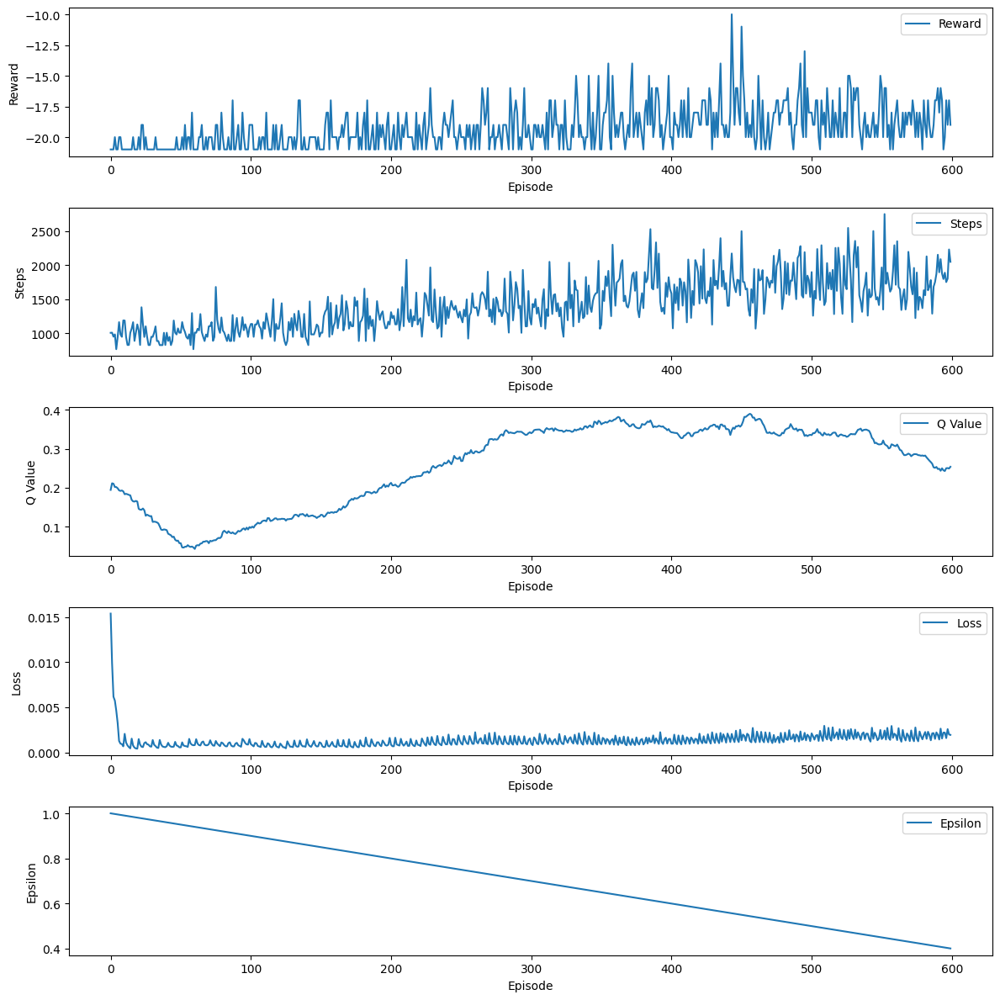

Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-600.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-600.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-600.mp4
Episode 601 abgeschlossen mit 1837 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.39999999999999947


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-601.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-601.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-601.mp4
Episode 602 abgeschlossen mit 2049 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.39899999999999947


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-602.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-602.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-602.mp4
Episode 603 abgeschlossen mit 1557 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.39799999999999947


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-603.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-603.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-603.mp4
Episode 604 abgeschlossen mit 1535 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.39699999999999946


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-604.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-604.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-604.mp4
Episode 605 abgeschlossen mit 1843 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.39599999999999946


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-605.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-605.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-605.mp4
Episode 606 abgeschlossen mit 1963 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.39499999999999946


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-606.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-606.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-606.mp4
Episode 607 abgeschlossen mit 2531 Schritten, Gesamtbelohnung: -12.0, Epsilon: 0.39399999999999946


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-607.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-607.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-607.mp4
Episode 608 abgeschlossen mit 1951 Schritten, Gesamtbelohnung: -13.0, Epsilon: 0.39299999999999946


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-608.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-608.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-608.mp4
Episode 609 abgeschlossen mit 2153 Schritten, Gesamtbelohnung: -14.0, Epsilon: 0.39199999999999946


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-609.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-609.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-609.mp4
Episode 610 abgeschlossen mit 2272 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.39099999999999946


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-610.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-610.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-610.mp4
Episode 611 abgeschlossen mit 2090 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.38999999999999946


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-611.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-611.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-611.mp4
Episode 612 abgeschlossen mit 1654 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.38899999999999946


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-612.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-612.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-612.mp4
Episode 613 abgeschlossen mit 1971 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.38799999999999946


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-613.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-613.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-613.mp4
Episode 614 abgeschlossen mit 3298 Schritten, Gesamtbelohnung: -9.0, Epsilon: 0.38699999999999946


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-614.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-614.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-614.mp4
Episode 615 abgeschlossen mit 2750 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.38599999999999945


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-615.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-615.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-615.mp4
Episode 616 abgeschlossen mit 2238 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.38499999999999945


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-616.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-616.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-616.mp4
Episode 617 abgeschlossen mit 2304 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.38399999999999945


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-617.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-617.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-617.mp4
Episode 618 abgeschlossen mit 2050 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.38299999999999945


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-618.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-618.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-618.mp4
Episode 619 abgeschlossen mit 2084 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.38199999999999945


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-619.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-619.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-619.mp4
Episode 620 abgeschlossen mit 1922 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.38099999999999945


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-620.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-620.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-620.mp4
Episode 621 abgeschlossen mit 2027 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.37999999999999945


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-621.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-621.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-621.mp4
Episode 622 abgeschlossen mit 1258 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.37899999999999945


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-622.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-622.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-622.mp4
Episode 623 abgeschlossen mit 2176 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.37799999999999945


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-623.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-623.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-623.mp4
Episode 624 abgeschlossen mit 2172 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.37699999999999945


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-624.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-624.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-624.mp4
Episode 625 abgeschlossen mit 2063 Schritten, Gesamtbelohnung: -15.0, Epsilon: 0.37599999999999945




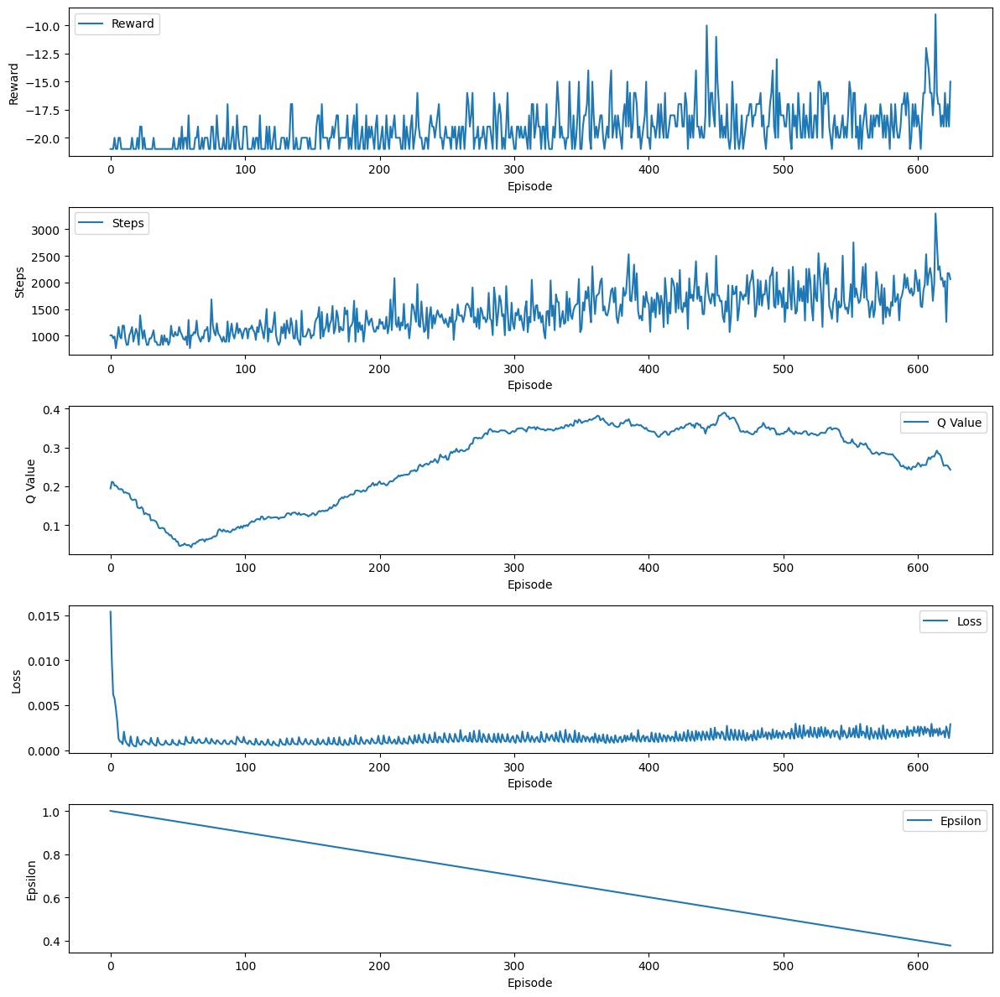

Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-625.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-625.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-625.mp4
Episode 626 abgeschlossen mit 2053 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.37499999999999944


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-626.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-626.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-626.mp4
Episode 627 abgeschlossen mit 1686 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.37399999999999944


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-627.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-627.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-627.mp4
Episode 628 abgeschlossen mit 2632 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.37299999999999944


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-628.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-628.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-628.mp4
Episode 629 abgeschlossen mit 1923 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.37199999999999944


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-629.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-629.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-629.mp4
Episode 630 abgeschlossen mit 1911 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.37099999999999944


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-630.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-630.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-630.mp4
Episode 631 abgeschlossen mit 3148 Schritten, Gesamtbelohnung: -15.0, Epsilon: 0.36999999999999944


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-631.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-631.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-631.mp4
Episode 632 abgeschlossen mit 2713 Schritten, Gesamtbelohnung: -12.0, Epsilon: 0.36899999999999944


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-632.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-632.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-632.mp4
Episode 633 abgeschlossen mit 2571 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.36799999999999944


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-633.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-633.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-633.mp4
Episode 634 abgeschlossen mit 1739 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.36699999999999944


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-634.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-634.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-634.mp4
Episode 635 abgeschlossen mit 2062 Schritten, Gesamtbelohnung: -15.0, Epsilon: 0.36599999999999944


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-635.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-635.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-635.mp4
Episode 636 abgeschlossen mit 1628 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.36499999999999944


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-636.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-636.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-636.mp4
Episode 637 abgeschlossen mit 2319 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.36399999999999944


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-637.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-637.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-637.mp4
Episode 638 abgeschlossen mit 2263 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.36299999999999943


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-638.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-638.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-638.mp4
Episode 639 abgeschlossen mit 1994 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.36199999999999943


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-639.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-639.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-639.mp4
Episode 640 abgeschlossen mit 1370 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.36099999999999943


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-640.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-640.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-640.mp4
Episode 641 abgeschlossen mit 1960 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.35999999999999943


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-641.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-641.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-641.mp4
Episode 642 abgeschlossen mit 2317 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.35899999999999943


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-642.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-642.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-642.mp4
Episode 643 abgeschlossen mit 1907 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.35799999999999943


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-643.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-643.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-643.mp4
Episode 644 abgeschlossen mit 2121 Schritten, Gesamtbelohnung: -15.0, Epsilon: 0.35699999999999943


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-644.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-644.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-644.mp4
Episode 645 abgeschlossen mit 2330 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.35599999999999943


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-645.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-645.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-645.mp4
Episode 646 abgeschlossen mit 1782 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.3549999999999994


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-646.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-646.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-646.mp4
Episode 647 abgeschlossen mit 2657 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.3539999999999994


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-647.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-647.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-647.mp4
Episode 648 abgeschlossen mit 2339 Schritten, Gesamtbelohnung: -14.0, Epsilon: 0.3529999999999994


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-648.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-648.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-648.mp4
Episode 649 abgeschlossen mit 1949 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.3519999999999994


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-649.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-649.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-649.mp4
Episode 650 abgeschlossen mit 1898 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.3509999999999994




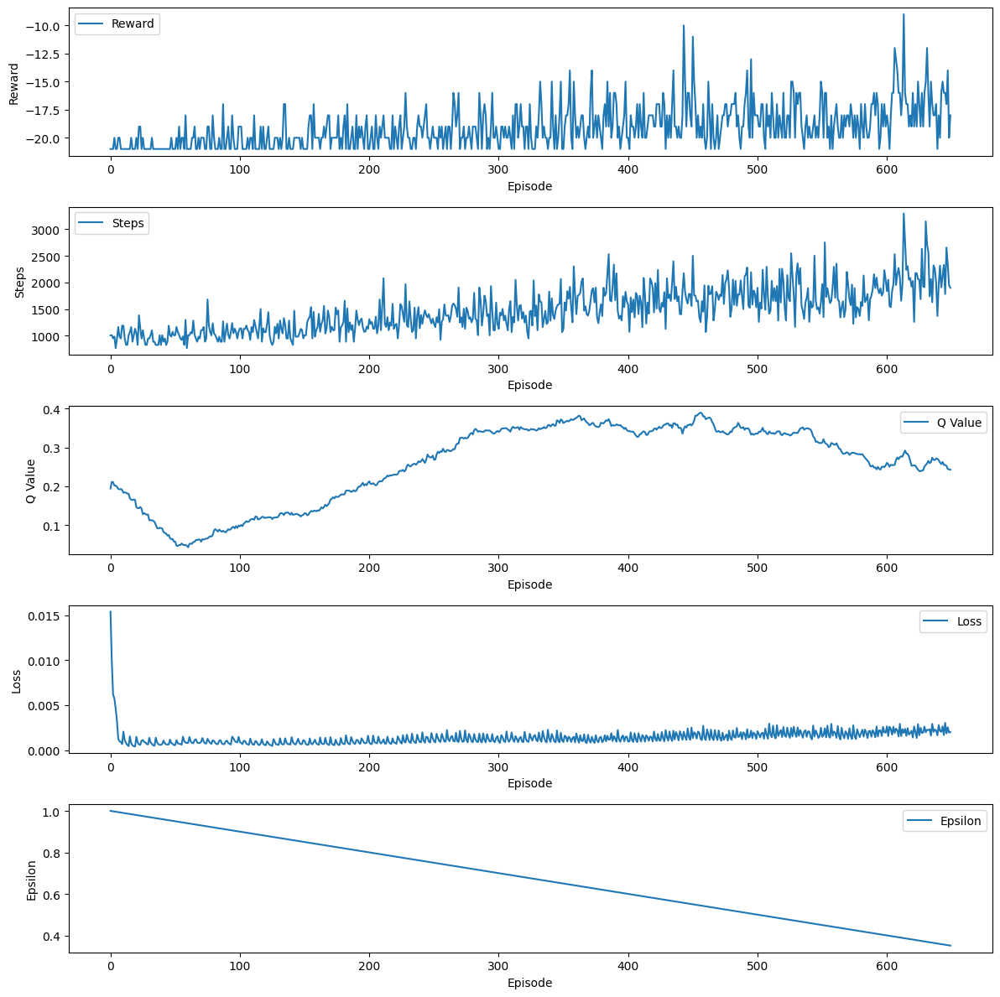

Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-650.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-650.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-650.mp4
Episode 651 abgeschlossen mit 3709 Schritten, Gesamtbelohnung: -13.0, Epsilon: 0.3499999999999994


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-651.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-651.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-651.mp4
Episode 652 abgeschlossen mit 2182 Schritten, Gesamtbelohnung: -15.0, Epsilon: 0.3489999999999994


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-652.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-652.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-652.mp4
Episode 653 abgeschlossen mit 2043 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.3479999999999994


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-653.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-653.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-653.mp4
Episode 654 abgeschlossen mit 1898 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.3469999999999994


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-654.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-654.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-654.mp4
Episode 655 abgeschlossen mit 2183 Schritten, Gesamtbelohnung: -15.0, Epsilon: 0.3459999999999994


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-655.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-655.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-655.mp4
Episode 656 abgeschlossen mit 1999 Schritten, Gesamtbelohnung: -15.0, Epsilon: 0.3449999999999994


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-656.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-656.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-656.mp4
Episode 657 abgeschlossen mit 2091 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.3439999999999994


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-657.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-657.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-657.mp4
Episode 658 abgeschlossen mit 1993 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.3429999999999994


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-658.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-658.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-658.mp4
Episode 659 abgeschlossen mit 2183 Schritten, Gesamtbelohnung: -15.0, Epsilon: 0.3419999999999994


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-659.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-659.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-659.mp4
Episode 660 abgeschlossen mit 1584 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.3409999999999994


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-660.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-660.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-660.mp4
Episode 661 abgeschlossen mit 1821 Schritten, Gesamtbelohnung: -15.0, Epsilon: 0.3399999999999994


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-661.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-661.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-661.mp4
Episode 662 abgeschlossen mit 1629 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.3389999999999994


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-662.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-662.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-662.mp4
Episode 663 abgeschlossen mit 1973 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.3379999999999994


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-663.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-663.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-663.mp4
Episode 664 abgeschlossen mit 2073 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.3369999999999994


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-664.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-664.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-664.mp4
Episode 665 abgeschlossen mit 1987 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.3359999999999994


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-665.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-665.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-665.mp4
Episode 666 abgeschlossen mit 2140 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.3349999999999994


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-666.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-666.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-666.mp4
Episode 667 abgeschlossen mit 1925 Schritten, Gesamtbelohnung: -12.0, Epsilon: 0.3339999999999994


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-667.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-667.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-667.mp4
Episode 668 abgeschlossen mit 1560 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.3329999999999994


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-668.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-668.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-668.mp4
Episode 669 abgeschlossen mit 2127 Schritten, Gesamtbelohnung: -15.0, Epsilon: 0.3319999999999994


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-669.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-669.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-669.mp4
Episode 670 abgeschlossen mit 2244 Schritten, Gesamtbelohnung: -15.0, Epsilon: 0.3309999999999994


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-670.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-670.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-670.mp4
Episode 671 abgeschlossen mit 1606 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.3299999999999994


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-671.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-671.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-671.mp4
Episode 672 abgeschlossen mit 2378 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.3289999999999994


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-672.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-672.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-672.mp4
Episode 673 abgeschlossen mit 1863 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.3279999999999994


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-673.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-673.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-673.mp4
Episode 674 abgeschlossen mit 2440 Schritten, Gesamtbelohnung: -11.0, Epsilon: 0.3269999999999994


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-674.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-674.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-674.mp4
Episode 675 abgeschlossen mit 1911 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.3259999999999994




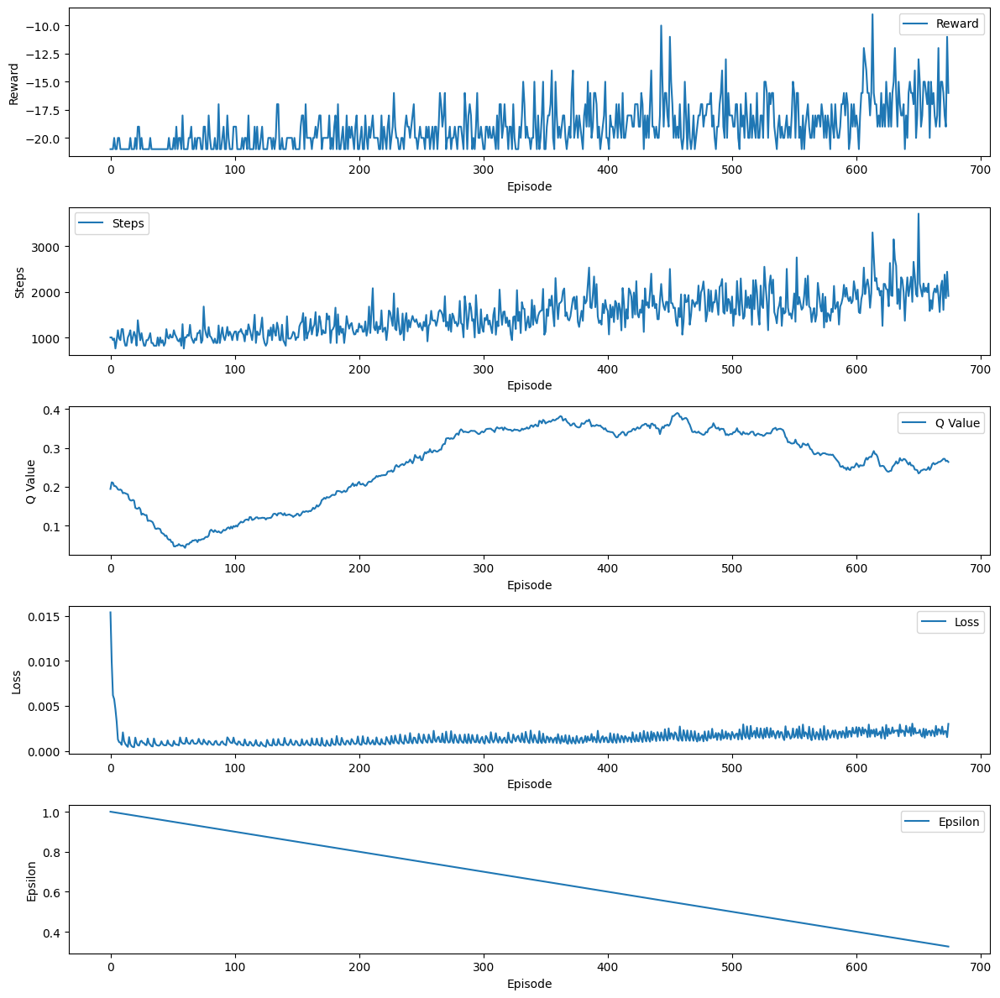

Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-675.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-675.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-675.mp4
Episode 676 abgeschlossen mit 1621 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.3249999999999994


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-676.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-676.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-676.mp4
Episode 677 abgeschlossen mit 1968 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.3239999999999994


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-677.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-677.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-677.mp4
Episode 678 abgeschlossen mit 1343 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.3229999999999994


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-678.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-678.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-678.mp4
Episode 679 abgeschlossen mit 2613 Schritten, Gesamtbelohnung: -13.0, Epsilon: 0.3219999999999994


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-679.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-679.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-679.mp4
Episode 680 abgeschlossen mit 2193 Schritten, Gesamtbelohnung: -13.0, Epsilon: 0.3209999999999994


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-680.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-680.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-680.mp4
Episode 681 abgeschlossen mit 2449 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.3199999999999994


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-681.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-681.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-681.mp4
Episode 682 abgeschlossen mit 1779 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.3189999999999994


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-682.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-682.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-682.mp4
Episode 683 abgeschlossen mit 2338 Schritten, Gesamtbelohnung: -14.0, Epsilon: 0.3179999999999994


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-683.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-683.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-683.mp4
Episode 684 abgeschlossen mit 1908 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.3169999999999994


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-684.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-684.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-684.mp4
Episode 685 abgeschlossen mit 2243 Schritten, Gesamtbelohnung: -15.0, Epsilon: 0.3159999999999994


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-685.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-685.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-685.mp4
Episode 686 abgeschlossen mit 2114 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.3149999999999994


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-686.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-686.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-686.mp4
Episode 687 abgeschlossen mit 2002 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.3139999999999994


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-687.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-687.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-687.mp4
Episode 688 abgeschlossen mit 2270 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.3129999999999994


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-688.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-688.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-688.mp4
Episode 689 abgeschlossen mit 2703 Schritten, Gesamtbelohnung: -14.0, Epsilon: 0.3119999999999994


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-689.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-689.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-689.mp4
Episode 690 abgeschlossen mit 2521 Schritten, Gesamtbelohnung: -14.0, Epsilon: 0.3109999999999994


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-690.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-690.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-690.mp4
Episode 691 abgeschlossen mit 2088 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.3099999999999994


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-691.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-691.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-691.mp4
Episode 692 abgeschlossen mit 2650 Schritten, Gesamtbelohnung: -12.0, Epsilon: 0.3089999999999994


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-692.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-692.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-692.mp4
Episode 693 abgeschlossen mit 1535 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.3079999999999994


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-693.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-693.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-693.mp4
Episode 694 abgeschlossen mit 1999 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.3069999999999994


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-694.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-694.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-694.mp4
Episode 695 abgeschlossen mit 1865 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.3059999999999994


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-695.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-695.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-695.mp4
Episode 696 abgeschlossen mit 2189 Schritten, Gesamtbelohnung: -13.0, Epsilon: 0.3049999999999994


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-696.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-696.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-696.mp4
Episode 697 abgeschlossen mit 2343 Schritten, Gesamtbelohnung: -14.0, Epsilon: 0.3039999999999994


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-697.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-697.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-697.mp4
Episode 698 abgeschlossen mit 2217 Schritten, Gesamtbelohnung: -14.0, Epsilon: 0.3029999999999994


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-698.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-698.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-698.mp4
Episode 699 abgeschlossen mit 2017 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.3019999999999994


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-699.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-699.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-699.mp4
Episode 700 abgeschlossen mit 2052 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.3009999999999994




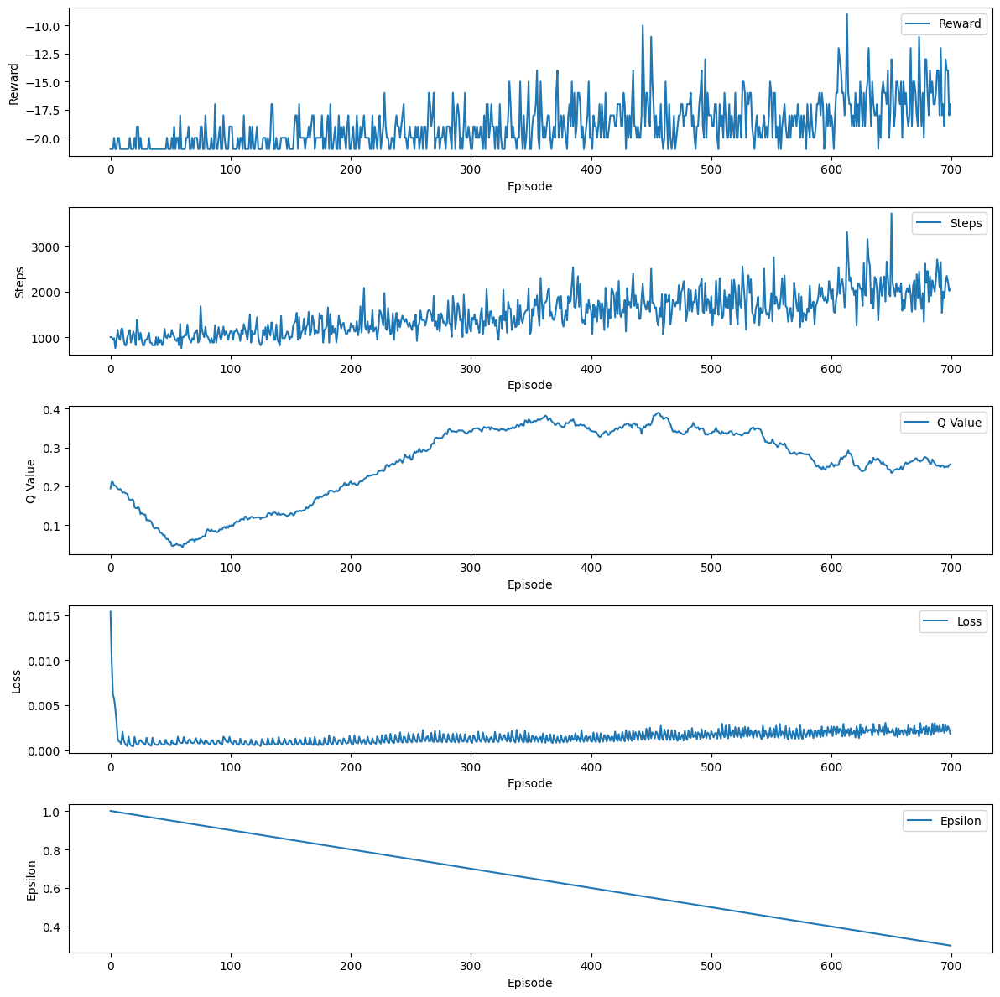

Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-700.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-700.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-700.mp4
Episode 701 abgeschlossen mit 1967 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.2999999999999994


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-701.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-701.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-701.mp4
Episode 702 abgeschlossen mit 2223 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.2989999999999994


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-702.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-702.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-702.mp4
Episode 703 abgeschlossen mit 1797 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.2979999999999994


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-703.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-703.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-703.mp4
Episode 704 abgeschlossen mit 2901 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.2969999999999994


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-704.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-704.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-704.mp4
Episode 705 abgeschlossen mit 1939 Schritten, Gesamtbelohnung: -15.0, Epsilon: 0.2959999999999994


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-705.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-705.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-705.mp4
Episode 706 abgeschlossen mit 2673 Schritten, Gesamtbelohnung: -15.0, Epsilon: 0.2949999999999994


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-706.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-706.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-706.mp4
Episode 707 abgeschlossen mit 1849 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.2939999999999994


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-707.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-707.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-707.mp4
Episode 708 abgeschlossen mit 2803 Schritten, Gesamtbelohnung: -13.0, Epsilon: 0.29299999999999937


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-708.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-708.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-708.mp4
Episode 709 abgeschlossen mit 2222 Schritten, Gesamtbelohnung: -12.0, Epsilon: 0.29199999999999937


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-709.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-709.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-709.mp4
Episode 710 abgeschlossen mit 2221 Schritten, Gesamtbelohnung: -14.0, Epsilon: 0.29099999999999937


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-710.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-710.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-710.mp4
Episode 711 abgeschlossen mit 1949 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.28999999999999937


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-711.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-711.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-711.mp4
Episode 712 abgeschlossen mit 1744 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.28899999999999937


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-712.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-712.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-712.mp4
Episode 713 abgeschlossen mit 2685 Schritten, Gesamtbelohnung: -11.0, Epsilon: 0.28799999999999937


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-713.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-713.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-713.mp4
Episode 714 abgeschlossen mit 2364 Schritten, Gesamtbelohnung: -15.0, Epsilon: 0.28699999999999937


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-714.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-714.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-714.mp4
Episode 715 abgeschlossen mit 2250 Schritten, Gesamtbelohnung: -15.0, Epsilon: 0.28599999999999937


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-715.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-715.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-715.mp4
Episode 716 abgeschlossen mit 1838 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.28499999999999936


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-716.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-716.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-716.mp4
Episode 717 abgeschlossen mit 1940 Schritten, Gesamtbelohnung: -15.0, Epsilon: 0.28399999999999936


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-717.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-717.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-717.mp4
Episode 718 abgeschlossen mit 1632 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.28299999999999936


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-718.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-718.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-718.mp4
Episode 719 abgeschlossen mit 1859 Schritten, Gesamtbelohnung: -14.0, Epsilon: 0.28199999999999936


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-719.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-719.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-719.mp4
Episode 720 abgeschlossen mit 1631 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.28099999999999936


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-720.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-720.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-720.mp4
Episode 721 abgeschlossen mit 1380 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.27999999999999936


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-721.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-721.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-721.mp4
Episode 722 abgeschlossen mit 2268 Schritten, Gesamtbelohnung: -9.0, Epsilon: 0.27899999999999936


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-722.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-722.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-722.mp4
Episode 723 abgeschlossen mit 2208 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.27799999999999936


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-723.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-723.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-723.mp4
Episode 724 abgeschlossen mit 1865 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.27699999999999936


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-724.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-724.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-724.mp4
Episode 725 abgeschlossen mit 1779 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.27599999999999936




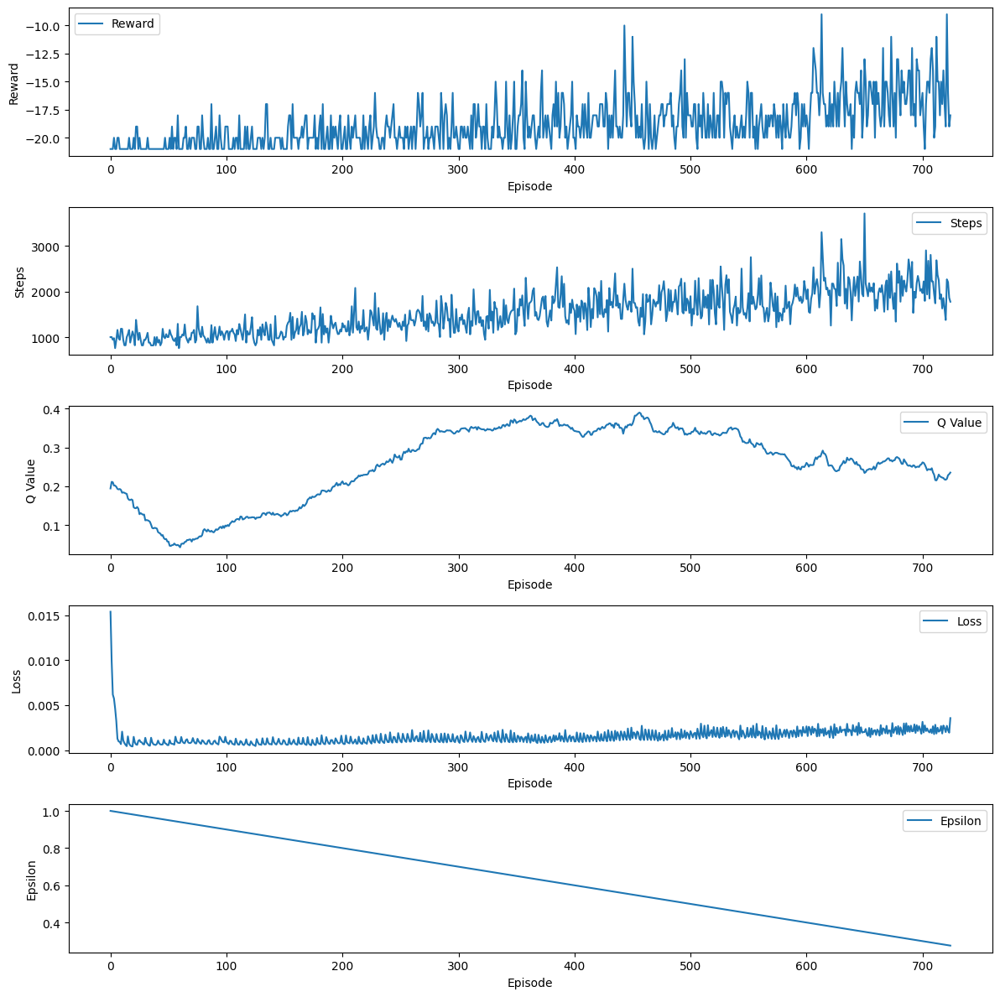

Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-725.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-725.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-725.mp4
Episode 726 abgeschlossen mit 3408 Schritten, Gesamtbelohnung: -6.0, Epsilon: 0.27499999999999936


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-726.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-726.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-726.mp4
Episode 727 abgeschlossen mit 2080 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.27399999999999936


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-727.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-727.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-727.mp4
Episode 728 abgeschlossen mit 2004 Schritten, Gesamtbelohnung: -15.0, Epsilon: 0.27299999999999935


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-728.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-728.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-728.mp4
Episode 729 abgeschlossen mit 1584 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.27199999999999935


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-729.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-729.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-729.mp4
Episode 730 abgeschlossen mit 2158 Schritten, Gesamtbelohnung: -14.0, Epsilon: 0.27099999999999935


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-730.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-730.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-730.mp4
Episode 731 abgeschlossen mit 2080 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.26999999999999935


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-731.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-731.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-731.mp4
Episode 732 abgeschlossen mit 1681 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.26899999999999935


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-732.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-732.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-732.mp4
Episode 733 abgeschlossen mit 2150 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.26799999999999935


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-733.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-733.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-733.mp4
Episode 734 abgeschlossen mit 2009 Schritten, Gesamtbelohnung: -13.0, Epsilon: 0.26699999999999935


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-734.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-734.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-734.mp4
Episode 735 abgeschlossen mit 1764 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.26599999999999935


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-735.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-735.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-735.mp4
Episode 736 abgeschlossen mit 2079 Schritten, Gesamtbelohnung: -13.0, Epsilon: 0.26499999999999935


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-736.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-736.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-736.mp4
Episode 737 abgeschlossen mit 2469 Schritten, Gesamtbelohnung: -14.0, Epsilon: 0.26399999999999935


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-737.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-737.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-737.mp4
Episode 738 abgeschlossen mit 3094 Schritten, Gesamtbelohnung: -15.0, Epsilon: 0.26299999999999935


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-738.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-738.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-738.mp4
Episode 739 abgeschlossen mit 2273 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.26199999999999934


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-739.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-739.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-739.mp4
Episode 740 abgeschlossen mit 2058 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.26099999999999934


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-740.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-740.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-740.mp4
Episode 741 abgeschlossen mit 2658 Schritten, Gesamtbelohnung: -12.0, Epsilon: 0.25999999999999934


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-741.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-741.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-741.mp4
Episode 742 abgeschlossen mit 1927 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.25899999999999934


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-742.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-742.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-742.mp4
Episode 743 abgeschlossen mit 1953 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.25799999999999934


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-743.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-743.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-743.mp4
Episode 744 abgeschlossen mit 2285 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.25699999999999934


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-744.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-744.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-744.mp4
Episode 745 abgeschlossen mit 1994 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.25599999999999934


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-745.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-745.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-745.mp4
Episode 746 abgeschlossen mit 1857 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.25499999999999934


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-746.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-746.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-746.mp4
Episode 747 abgeschlossen mit 1561 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.25399999999999934


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-747.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-747.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-747.mp4
Episode 748 abgeschlossen mit 2913 Schritten, Gesamtbelohnung: -15.0, Epsilon: 0.25299999999999934


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-748.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-748.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-748.mp4
Episode 749 abgeschlossen mit 2449 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.25199999999999934


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-749.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-749.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-749.mp4
Episode 750 abgeschlossen mit 2157 Schritten, Gesamtbelohnung: -14.0, Epsilon: 0.25099999999999933




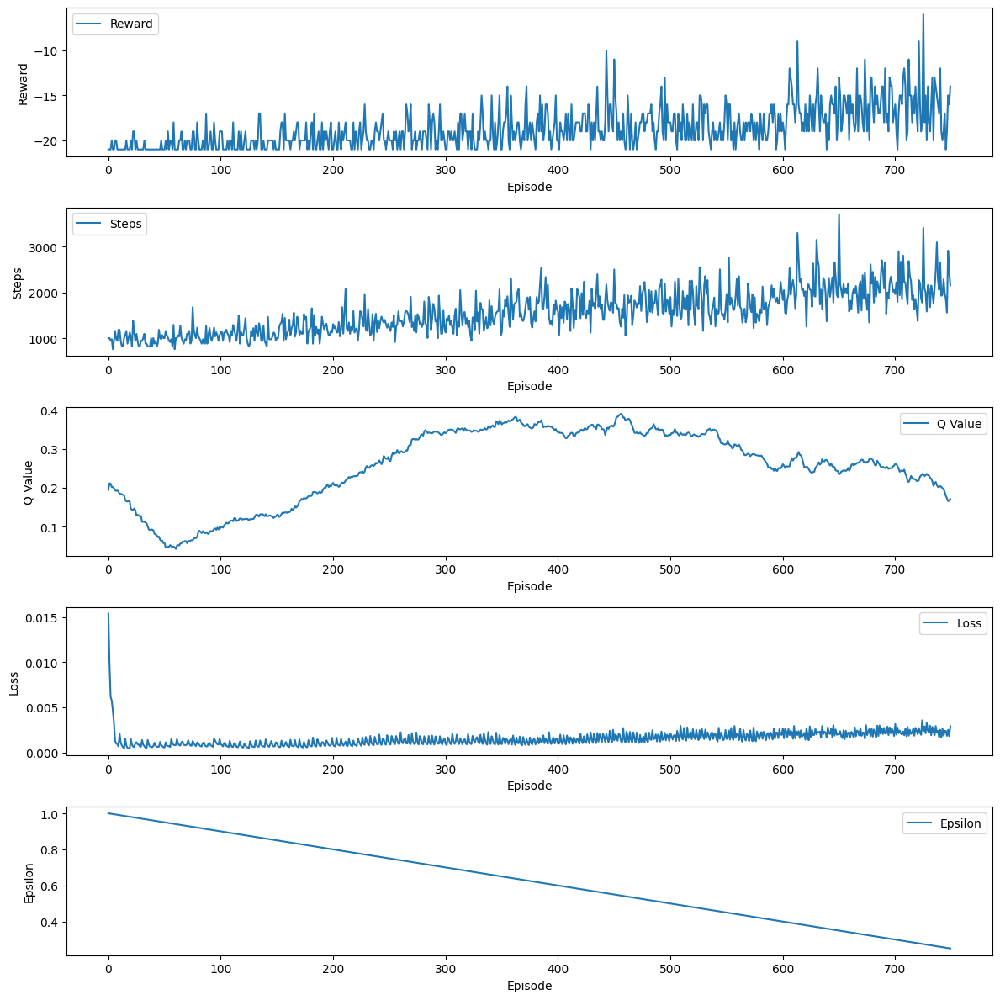

Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-750.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-750.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-750.mp4
Episode 751 abgeschlossen mit 2112 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.24999999999999933


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-751.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-751.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-751.mp4
Episode 752 abgeschlossen mit 2304 Schritten, Gesamtbelohnung: -15.0, Epsilon: 0.24899999999999933


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-752.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-752.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-752.mp4
Episode 753 abgeschlossen mit 2599 Schritten, Gesamtbelohnung: -10.0, Epsilon: 0.24799999999999933


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-753.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-753.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-753.mp4
Episode 754 abgeschlossen mit 4169 Schritten, Gesamtbelohnung: -3.0, Epsilon: 0.24699999999999933


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-754.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-754.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-754.mp4
Episode 755 abgeschlossen mit 3706 Schritten, Gesamtbelohnung: -10.0, Epsilon: 0.24599999999999933


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-755.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-755.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-755.mp4
Episode 756 abgeschlossen mit 3150 Schritten, Gesamtbelohnung: -8.0, Epsilon: 0.24499999999999933


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-756.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-756.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-756.mp4
Episode 757 abgeschlossen mit 3455 Schritten, Gesamtbelohnung: -10.0, Epsilon: 0.24399999999999933


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-757.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-757.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-757.mp4
Episode 758 abgeschlossen mit 2662 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.24299999999999933


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-758.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-758.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-758.mp4
Episode 759 abgeschlossen mit 3129 Schritten, Gesamtbelohnung: -14.0, Epsilon: 0.24199999999999933


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-759.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-759.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-759.mp4
Episode 760 abgeschlossen mit 2676 Schritten, Gesamtbelohnung: -13.0, Epsilon: 0.24099999999999933


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-760.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-760.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-760.mp4
Episode 761 abgeschlossen mit 1818 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.23999999999999932


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-761.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-761.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-761.mp4
Episode 762 abgeschlossen mit 1767 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.23899999999999932


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-762.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-762.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-762.mp4
Episode 763 abgeschlossen mit 2576 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.23799999999999932


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-763.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-763.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-763.mp4
Episode 764 abgeschlossen mit 2610 Schritten, Gesamtbelohnung: -15.0, Epsilon: 0.23699999999999932


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-764.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-764.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-764.mp4
Episode 765 abgeschlossen mit 1450 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.23599999999999932


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-765.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-765.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-765.mp4
Episode 766 abgeschlossen mit 1994 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.23499999999999932


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-766.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-766.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-766.mp4
Episode 767 abgeschlossen mit 2676 Schritten, Gesamtbelohnung: -13.0, Epsilon: 0.23399999999999932


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-767.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-767.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-767.mp4
Episode 768 abgeschlossen mit 2755 Schritten, Gesamtbelohnung: -14.0, Epsilon: 0.23299999999999932


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-768.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-768.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-768.mp4
Episode 769 abgeschlossen mit 2363 Schritten, Gesamtbelohnung: -15.0, Epsilon: 0.23199999999999932


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-769.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-769.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-769.mp4
Episode 770 abgeschlossen mit 2370 Schritten, Gesamtbelohnung: -15.0, Epsilon: 0.23099999999999932


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-770.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-770.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-770.mp4
Episode 771 abgeschlossen mit 3082 Schritten, Gesamtbelohnung: -12.0, Epsilon: 0.22999999999999932


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-771.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-771.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-771.mp4
Episode 772 abgeschlossen mit 2735 Schritten, Gesamtbelohnung: -13.0, Epsilon: 0.22899999999999932


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-772.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-772.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-772.mp4
Episode 773 abgeschlossen mit 1972 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.22799999999999931


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-773.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-773.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-773.mp4
Episode 774 abgeschlossen mit 1932 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.2269999999999993


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-774.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-774.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-774.mp4
Episode 775 abgeschlossen mit 1711 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.2259999999999993




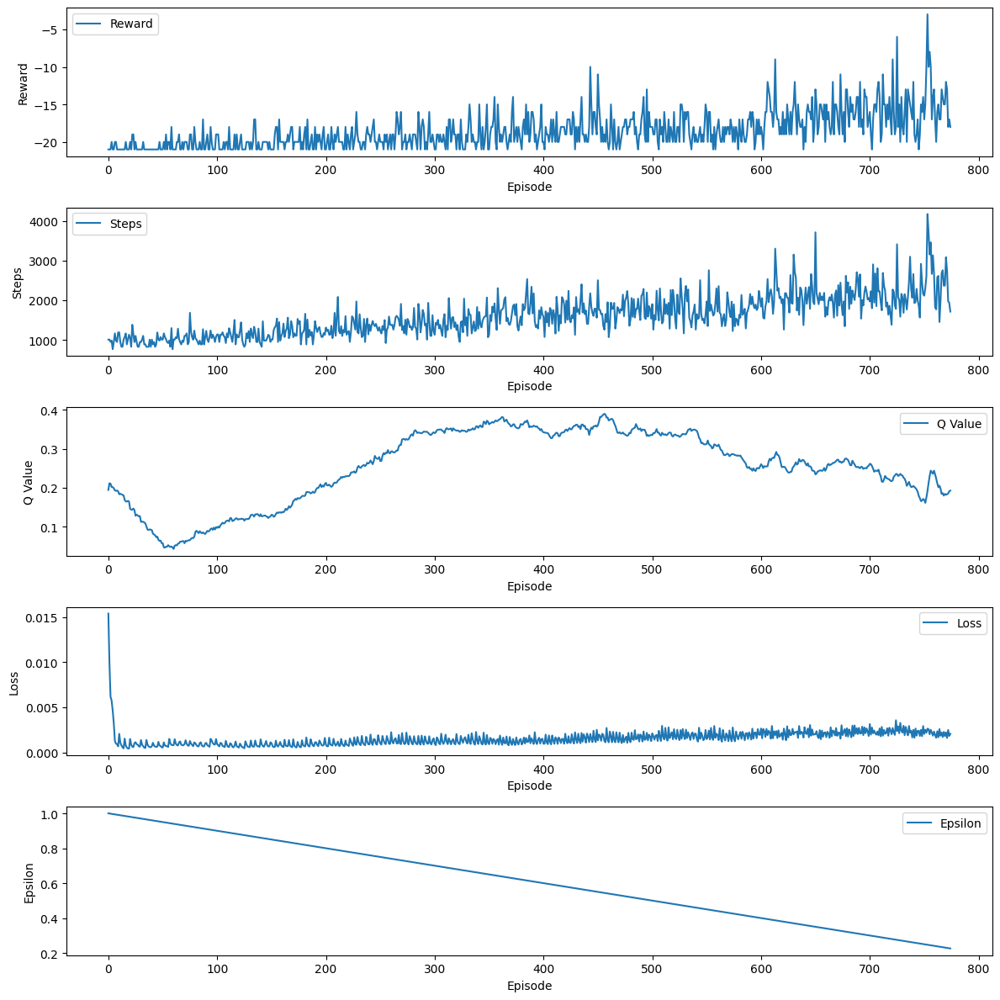

Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-775.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-775.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-775.mp4
Episode 776 abgeschlossen mit 2497 Schritten, Gesamtbelohnung: -15.0, Epsilon: 0.2249999999999993


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-776.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-776.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-776.mp4
Episode 777 abgeschlossen mit 2151 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.2239999999999993


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-777.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-777.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-777.mp4
Episode 778 abgeschlossen mit 2261 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.2229999999999993


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-778.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-778.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-778.mp4
Episode 779 abgeschlossen mit 2462 Schritten, Gesamtbelohnung: -14.0, Epsilon: 0.2219999999999993


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-779.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-779.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-779.mp4
Episode 780 abgeschlossen mit 1922 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.2209999999999993


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-780.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-780.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-780.mp4
Episode 781 abgeschlossen mit 2433 Schritten, Gesamtbelohnung: -15.0, Epsilon: 0.2199999999999993


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-781.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-781.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-781.mp4
Episode 782 abgeschlossen mit 1684 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.2189999999999993


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-782.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-782.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-782.mp4
Episode 783 abgeschlossen mit 2373 Schritten, Gesamtbelohnung: -13.0, Epsilon: 0.2179999999999993


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-783.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-783.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-783.mp4
Episode 784 abgeschlossen mit 2696 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.2169999999999993


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-784.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-784.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-784.mp4
Episode 785 abgeschlossen mit 2366 Schritten, Gesamtbelohnung: -15.0, Epsilon: 0.2159999999999993


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-785.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-785.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-785.mp4
Episode 786 abgeschlossen mit 2552 Schritten, Gesamtbelohnung: -13.0, Epsilon: 0.2149999999999993


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-786.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-786.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-786.mp4
Episode 787 abgeschlossen mit 2305 Schritten, Gesamtbelohnung: -15.0, Epsilon: 0.2139999999999993


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-787.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-787.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-787.mp4
Episode 788 abgeschlossen mit 3634 Schritten, Gesamtbelohnung: -15.0, Epsilon: 0.2129999999999993


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-788.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-788.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-788.mp4
Episode 789 abgeschlossen mit 2641 Schritten, Gesamtbelohnung: -14.0, Epsilon: 0.2119999999999993


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-789.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-789.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-789.mp4
Episode 790 abgeschlossen mit 3053 Schritten, Gesamtbelohnung: -11.0, Epsilon: 0.2109999999999993


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-790.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-790.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-790.mp4
Episode 791 abgeschlossen mit 2401 Schritten, Gesamtbelohnung: -14.0, Epsilon: 0.2099999999999993


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-791.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-791.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-791.mp4
Episode 792 abgeschlossen mit 2847 Schritten, Gesamtbelohnung: -10.0, Epsilon: 0.2089999999999993


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-792.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-792.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-792.mp4
Episode 793 abgeschlossen mit 2386 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.2079999999999993


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-793.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-793.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-793.mp4
Episode 794 abgeschlossen mit 2999 Schritten, Gesamtbelohnung: -9.0, Epsilon: 0.2069999999999993


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-794.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-794.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-794.mp4
Episode 795 abgeschlossen mit 3021 Schritten, Gesamtbelohnung: -10.0, Epsilon: 0.2059999999999993


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-795.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-795.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-795.mp4
Episode 796 abgeschlossen mit 2678 Schritten, Gesamtbelohnung: -15.0, Epsilon: 0.2049999999999993


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-796.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-796.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-796.mp4
Episode 797 abgeschlossen mit 2203 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.2039999999999993


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-797.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-797.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-797.mp4
Episode 798 abgeschlossen mit 2473 Schritten, Gesamtbelohnung: -12.0, Epsilon: 0.2029999999999993


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-798.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-798.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-798.mp4
Episode 799 abgeschlossen mit 2117 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.2019999999999993


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-799.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-799.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-799.mp4
Episode 800 abgeschlossen mit 2545 Schritten, Gesamtbelohnung: -15.0, Epsilon: 0.2009999999999993




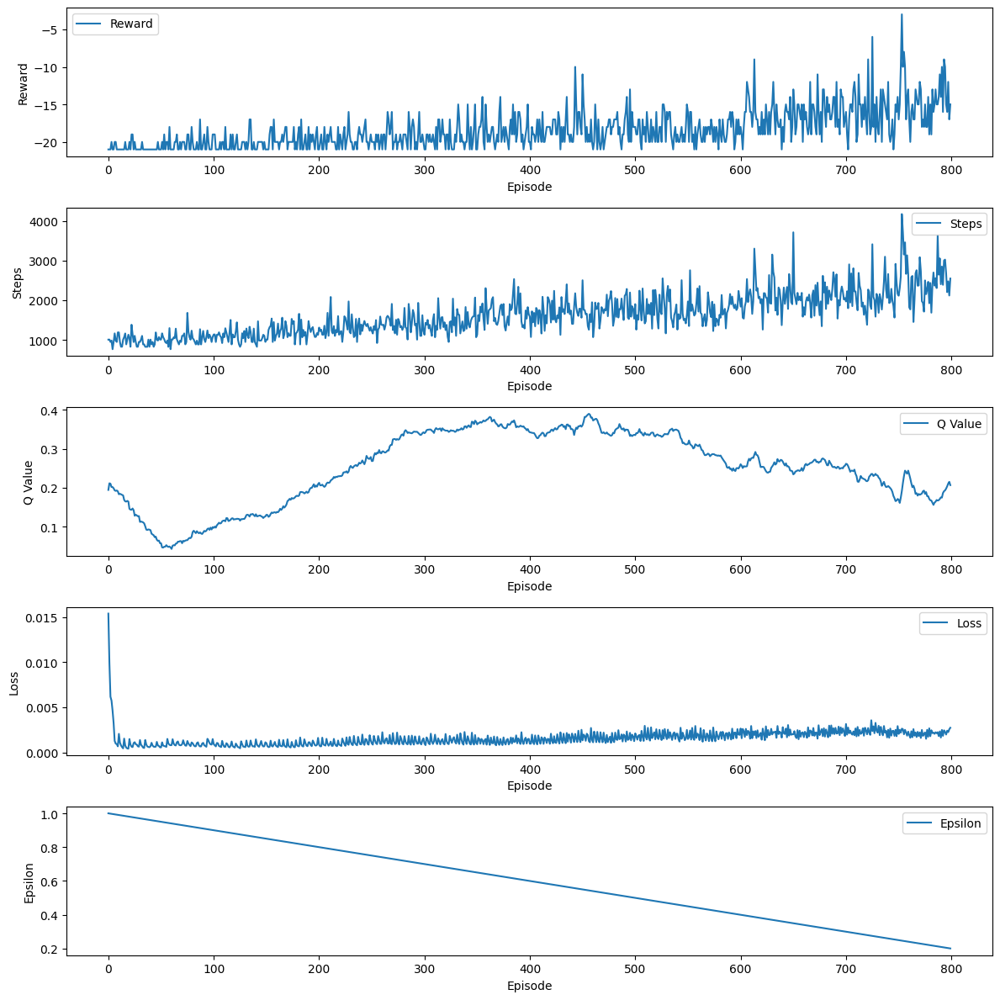

Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-800.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-800.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-800.mp4
Episode 801 abgeschlossen mit 2607 Schritten, Gesamtbelohnung: -10.0, Epsilon: 0.1999999999999993


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-801.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-801.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-801.mp4
Episode 802 abgeschlossen mit 1919 Schritten, Gesamtbelohnung: -14.0, Epsilon: 0.1989999999999993


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-802.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-802.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-802.mp4
Episode 803 abgeschlossen mit 2949 Schritten, Gesamtbelohnung: -5.0, Epsilon: 0.1979999999999993


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-803.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-803.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-803.mp4
Episode 804 abgeschlossen mit 3124 Schritten, Gesamtbelohnung: -7.0, Epsilon: 0.1969999999999993


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-804.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-804.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-804.mp4
Episode 805 abgeschlossen mit 2638 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.19599999999999929


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-805.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-805.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-805.mp4
Episode 806 abgeschlossen mit 1995 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.19499999999999929


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-806.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-806.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-806.mp4
Episode 807 abgeschlossen mit 2068 Schritten, Gesamtbelohnung: -15.0, Epsilon: 0.19399999999999928


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-807.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-807.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-807.mp4
Episode 808 abgeschlossen mit 3152 Schritten, Gesamtbelohnung: -8.0, Epsilon: 0.19299999999999928


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-808.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-808.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-808.mp4
Episode 809 abgeschlossen mit 4214 Schritten, Gesamtbelohnung: -2.0, Epsilon: 0.19199999999999928


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-809.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-809.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-809.mp4
Episode 810 abgeschlossen mit 3119 Schritten, Gesamtbelohnung: -11.0, Epsilon: 0.19099999999999928


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-810.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-810.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-810.mp4
Episode 811 abgeschlossen mit 2651 Schritten, Gesamtbelohnung: -12.0, Epsilon: 0.18999999999999928


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-811.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-811.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-811.mp4
Episode 812 abgeschlossen mit 3172 Schritten, Gesamtbelohnung: -11.0, Epsilon: 0.18899999999999928


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-812.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-812.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-812.mp4
Episode 813 abgeschlossen mit 1995 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.18799999999999928


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-813.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-813.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-813.mp4
Episode 814 abgeschlossen mit 1987 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.18699999999999928


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-814.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-814.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-814.mp4
Episode 815 abgeschlossen mit 2222 Schritten, Gesamtbelohnung: -14.0, Epsilon: 0.18599999999999928


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-815.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-815.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-815.mp4
Episode 816 abgeschlossen mit 2749 Schritten, Gesamtbelohnung: -11.0, Epsilon: 0.18499999999999928


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-816.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-816.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-816.mp4
Episode 817 abgeschlossen mit 2582 Schritten, Gesamtbelohnung: -14.0, Epsilon: 0.18399999999999928


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-817.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-817.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-817.mp4
Episode 818 abgeschlossen mit 2495 Schritten, Gesamtbelohnung: -13.0, Epsilon: 0.18299999999999927


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-818.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-818.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-818.mp4
Episode 819 abgeschlossen mit 1647 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.18199999999999927


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-819.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-819.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-819.mp4
Episode 820 abgeschlossen mit 2773 Schritten, Gesamtbelohnung: -12.0, Epsilon: 0.18099999999999927


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-820.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-820.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-820.mp4
Episode 821 abgeschlossen mit 2210 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.17999999999999927


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-821.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-821.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-821.mp4
Episode 822 abgeschlossen mit 2085 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.17899999999999927


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-822.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-822.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-822.mp4
Episode 823 abgeschlossen mit 2429 Schritten, Gesamtbelohnung: -15.0, Epsilon: 0.17799999999999927


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-823.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-823.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-823.mp4
Episode 824 abgeschlossen mit 2752 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.17699999999999927


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-824.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-824.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-824.mp4
Episode 825 abgeschlossen mit 1823 Schritten, Gesamtbelohnung: -15.0, Epsilon: 0.17599999999999927




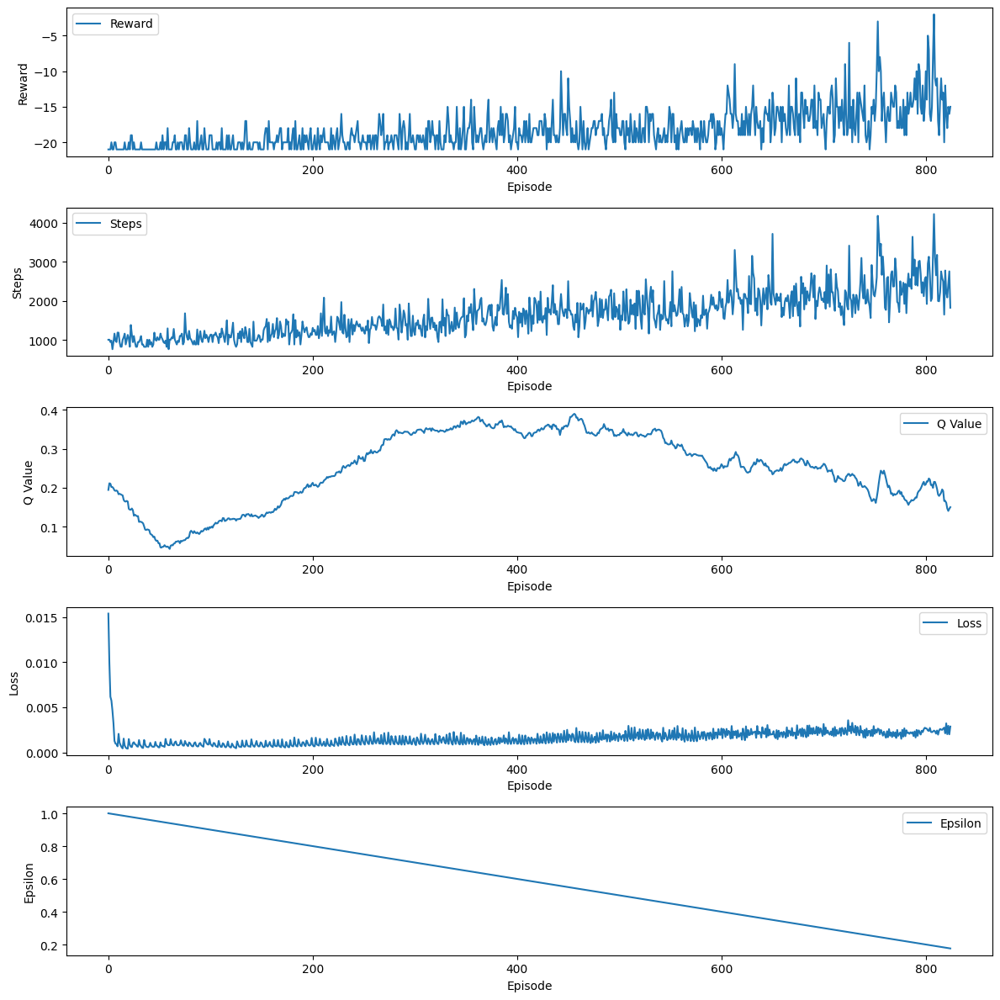

Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-825.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-825.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-825.mp4
Episode 826 abgeschlossen mit 1661 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.17499999999999927


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-826.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-826.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-826.mp4
Episode 827 abgeschlossen mit 2868 Schritten, Gesamtbelohnung: -11.0, Epsilon: 0.17399999999999927


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-827.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-827.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-827.mp4
Episode 828 abgeschlossen mit 2694 Schritten, Gesamtbelohnung: -9.0, Epsilon: 0.17299999999999927


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-828.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-828.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-828.mp4
Episode 829 abgeschlossen mit 2825 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.17199999999999926


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-829.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-829.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-829.mp4
Episode 830 abgeschlossen mit 2999 Schritten, Gesamtbelohnung: -9.0, Epsilon: 0.17099999999999926


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-830.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-830.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-830.mp4
Episode 831 abgeschlossen mit 2189 Schritten, Gesamtbelohnung: -15.0, Epsilon: 0.16999999999999926


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-831.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-831.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-831.mp4
Episode 832 abgeschlossen mit 2826 Schritten, Gesamtbelohnung: -7.0, Epsilon: 0.16899999999999926


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-832.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-832.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-832.mp4
Episode 833 abgeschlossen mit 2471 Schritten, Gesamtbelohnung: -12.0, Epsilon: 0.16799999999999926


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-833.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-833.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-833.mp4
Episode 834 abgeschlossen mit 2914 Schritten, Gesamtbelohnung: -8.0, Epsilon: 0.16699999999999926


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-834.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-834.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-834.mp4
Episode 835 abgeschlossen mit 2973 Schritten, Gesamtbelohnung: -8.0, Epsilon: 0.16599999999999926


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-835.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-835.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-835.mp4
Episode 836 abgeschlossen mit 2936 Schritten, Gesamtbelohnung: -9.0, Epsilon: 0.16499999999999926


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-836.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-836.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-836.mp4
Episode 837 abgeschlossen mit 2098 Schritten, Gesamtbelohnung: -14.0, Epsilon: 0.16399999999999926


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-837.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-837.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-837.mp4
Episode 838 abgeschlossen mit 2218 Schritten, Gesamtbelohnung: -14.0, Epsilon: 0.16299999999999926


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-838.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-838.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-838.mp4
Episode 839 abgeschlossen mit 3353 Schritten, Gesamtbelohnung: -4.0, Epsilon: 0.16199999999999926


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-839.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-839.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-839.mp4
Episode 840 abgeschlossen mit 2546 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.16099999999999925


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-840.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-840.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-840.mp4
Episode 841 abgeschlossen mit 3303 Schritten, Gesamtbelohnung: -9.0, Epsilon: 0.15999999999999925


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-841.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-841.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-841.mp4
Episode 842 abgeschlossen mit 3341 Schritten, Gesamtbelohnung: -15.0, Epsilon: 0.15899999999999925


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-842.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-842.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-842.mp4
Episode 843 abgeschlossen mit 2733 Schritten, Gesamtbelohnung: -13.0, Epsilon: 0.15799999999999925


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-843.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-843.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-843.mp4
Episode 844 abgeschlossen mit 3250 Schritten, Gesamtbelohnung: -7.0, Epsilon: 0.15699999999999925


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-844.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-844.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-844.mp4
Episode 845 abgeschlossen mit 3293 Schritten, Gesamtbelohnung: -13.0, Epsilon: 0.15599999999999925


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-845.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-845.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-845.mp4
Episode 846 abgeschlossen mit 2491 Schritten, Gesamtbelohnung: -15.0, Epsilon: 0.15499999999999925


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-846.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-846.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-846.mp4
Episode 847 abgeschlossen mit 2981 Schritten, Gesamtbelohnung: -6.0, Epsilon: 0.15399999999999925


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-847.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-847.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-847.mp4
Episode 848 abgeschlossen mit 3242 Schritten, Gesamtbelohnung: -9.0, Epsilon: 0.15299999999999925


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-848.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-848.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-848.mp4
Episode 849 abgeschlossen mit 2896 Schritten, Gesamtbelohnung: -12.0, Epsilon: 0.15199999999999925


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-849.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-849.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-849.mp4
Episode 850 abgeschlossen mit 2575 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.15099999999999925




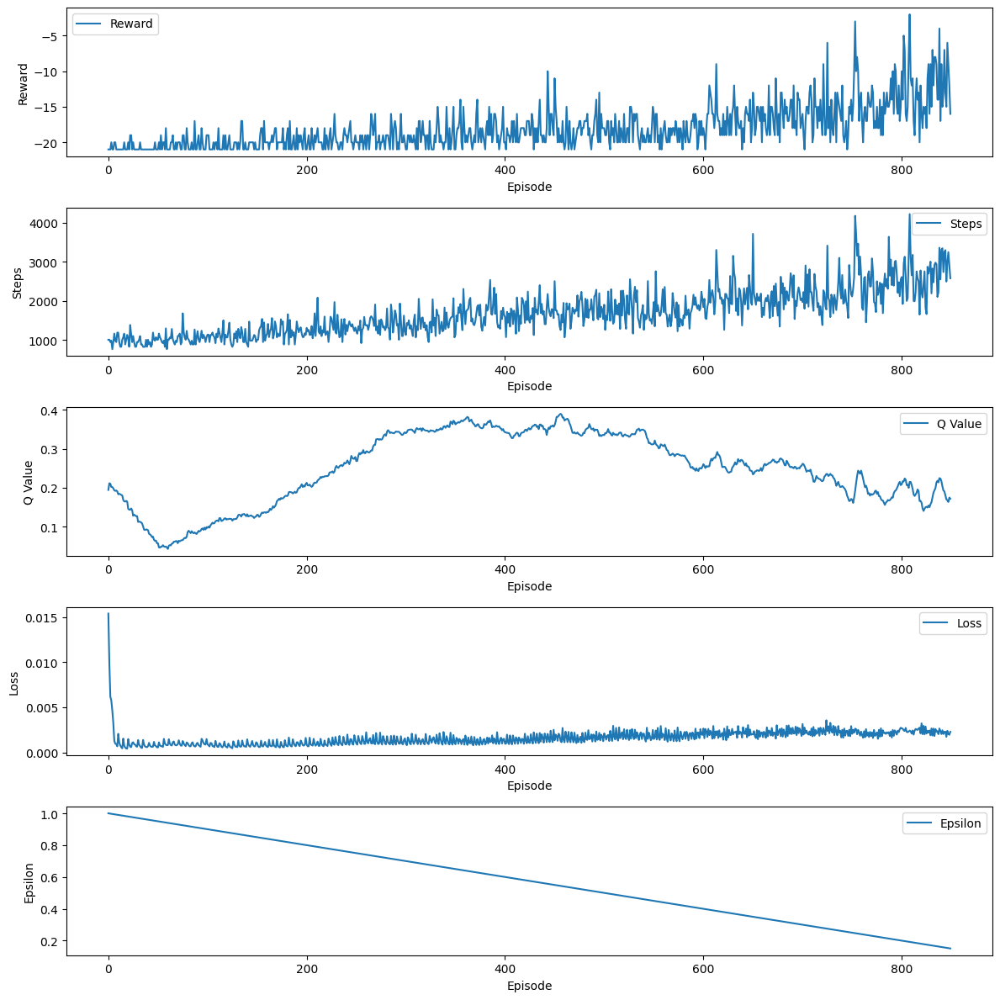

Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-850.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-850.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-850.mp4
Episode 851 abgeschlossen mit 3001 Schritten, Gesamtbelohnung: -14.0, Epsilon: 0.14999999999999925


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-851.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-851.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-851.mp4
Episode 852 abgeschlossen mit 2275 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.14899999999999924


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-852.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-852.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-852.mp4
Episode 853 abgeschlossen mit 2622 Schritten, Gesamtbelohnung: -13.0, Epsilon: 0.14799999999999924


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-853.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-853.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-853.mp4
Episode 854 abgeschlossen mit 3309 Schritten, Gesamtbelohnung: -14.0, Epsilon: 0.14699999999999924


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-854.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-854.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-854.mp4
Episode 855 abgeschlossen mit 2959 Schritten, Gesamtbelohnung: -10.0, Epsilon: 0.14599999999999924


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-855.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-855.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-855.mp4
Episode 856 abgeschlossen mit 3416 Schritten, Gesamtbelohnung: -9.0, Epsilon: 0.14499999999999924


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-856.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-856.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-856.mp4
Episode 857 abgeschlossen mit 3034 Schritten, Gesamtbelohnung: -15.0, Epsilon: 0.14399999999999924


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-857.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-857.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-857.mp4
Episode 858 abgeschlossen mit 2089 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.14299999999999924


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-858.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-858.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-858.mp4
Episode 859 abgeschlossen mit 2859 Schritten, Gesamtbelohnung: -13.0, Epsilon: 0.14199999999999924


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-859.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-859.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-859.mp4
Episode 860 abgeschlossen mit 2562 Schritten, Gesamtbelohnung: -18.0, Epsilon: 0.14099999999999924


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-860.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-860.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-860.mp4
Episode 861 abgeschlossen mit 3320 Schritten, Gesamtbelohnung: -12.0, Epsilon: 0.13999999999999924


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-861.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-861.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-861.mp4
Episode 862 abgeschlossen mit 2768 Schritten, Gesamtbelohnung: -14.0, Epsilon: 0.13899999999999924


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-862.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-862.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-862.mp4
Episode 863 abgeschlossen mit 3205 Schritten, Gesamtbelohnung: -12.0, Epsilon: 0.13799999999999923


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-863.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-863.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-863.mp4
Episode 864 abgeschlossen mit 3419 Schritten, Gesamtbelohnung: -11.0, Epsilon: 0.13699999999999923


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-864.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-864.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-864.mp4
Episode 865 abgeschlossen mit 2912 Schritten, Gesamtbelohnung: -8.0, Epsilon: 0.13599999999999923


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-865.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-865.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-865.mp4
Episode 866 abgeschlossen mit 2794 Schritten, Gesamtbelohnung: -15.0, Epsilon: 0.13499999999999923


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-866.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-866.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-866.mp4
Episode 867 abgeschlossen mit 3178 Schritten, Gesamtbelohnung: -11.0, Epsilon: 0.13399999999999923


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-867.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-867.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-867.mp4
Episode 868 abgeschlossen mit 2844 Schritten, Gesamtbelohnung: -10.0, Epsilon: 0.13299999999999923


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-868.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-868.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-868.mp4
Episode 869 abgeschlossen mit 3635 Schritten, Gesamtbelohnung: -10.0, Epsilon: 0.13199999999999923


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-869.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-869.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-869.mp4
Episode 870 abgeschlossen mit 4058 Schritten, Gesamtbelohnung: -10.0, Epsilon: 0.13099999999999923


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-870.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-870.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-870.mp4
Episode 871 abgeschlossen mit 4537 Schritten, Gesamtbelohnung: -3.0, Epsilon: 0.12999999999999923


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-871.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-871.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-871.mp4
Episode 872 abgeschlossen mit 3137 Schritten, Gesamtbelohnung: -12.0, Epsilon: 0.12899999999999923


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-872.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-872.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-872.mp4
Episode 873 abgeschlossen mit 2490 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.12799999999999923


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-873.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-873.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-873.mp4
Episode 874 abgeschlossen mit 3764 Schritten, Gesamtbelohnung: -10.0, Epsilon: 0.12699999999999922


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-874.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-874.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-874.mp4
Episode 875 abgeschlossen mit 3508 Schritten, Gesamtbelohnung: -12.0, Epsilon: 0.12599999999999922




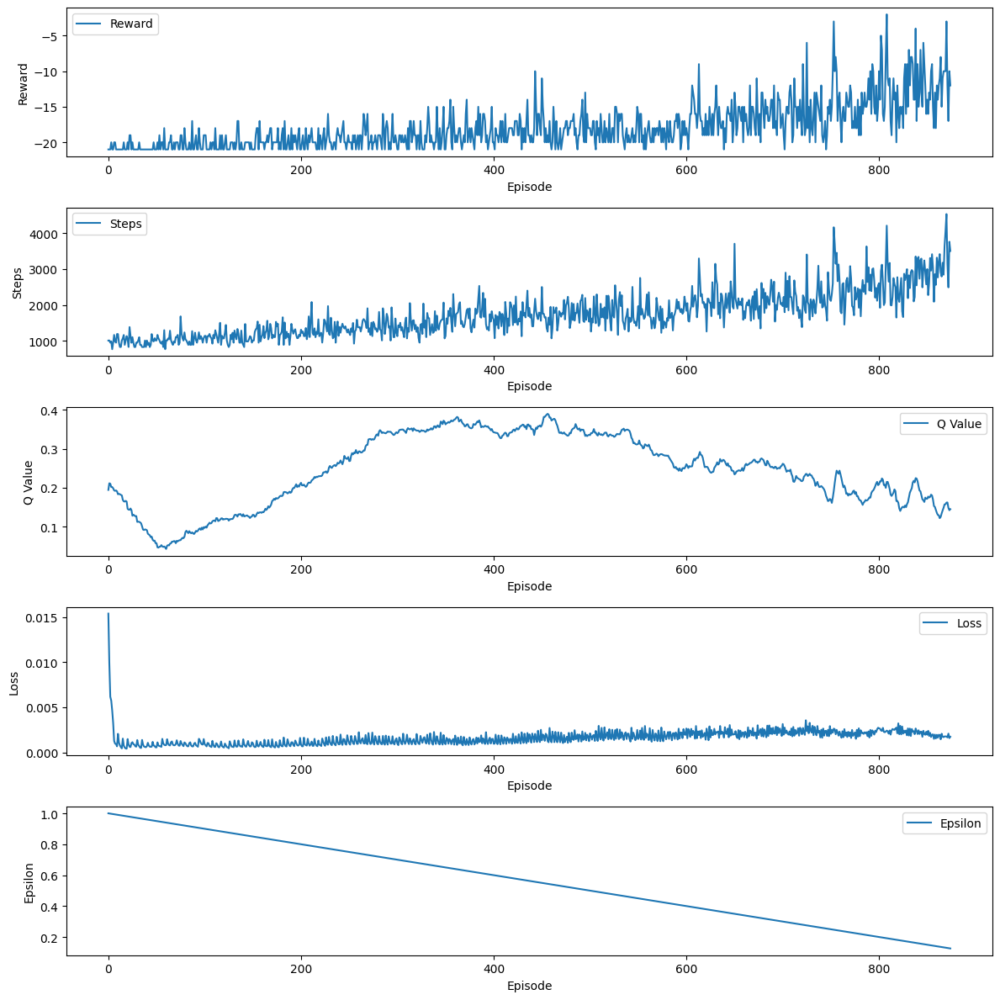

Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-875.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-875.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-875.mp4
Episode 876 abgeschlossen mit 2477 Schritten, Gesamtbelohnung: -21.0, Epsilon: 0.12499999999999922


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-876.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-876.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-876.mp4
Episode 877 abgeschlossen mit 3037 Schritten, Gesamtbelohnung: -13.0, Epsilon: 0.12399999999999922


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-877.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-877.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-877.mp4
Episode 878 abgeschlossen mit 3507 Schritten, Gesamtbelohnung: -3.0, Epsilon: 0.12299999999999922


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-878.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-878.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-878.mp4
Episode 879 abgeschlossen mit 2544 Schritten, Gesamtbelohnung: -19.0, Epsilon: 0.12199999999999922


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-879.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-879.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-879.mp4
Episode 880 abgeschlossen mit 4450 Schritten, Gesamtbelohnung: -2.0, Epsilon: 0.12099999999999922


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-880.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-880.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-880.mp4
Episode 881 abgeschlossen mit 2213 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.11999999999999922


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-881.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-881.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-881.mp4
Episode 882 abgeschlossen mit 2661 Schritten, Gesamtbelohnung: -10.0, Epsilon: 0.11899999999999922


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-882.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-882.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-882.mp4
Episode 883 abgeschlossen mit 2028 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.11799999999999922


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-883.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-883.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-883.mp4
Episode 884 abgeschlossen mit 2163 Schritten, Gesamtbelohnung: -14.0, Epsilon: 0.11699999999999922


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-884.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-884.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-884.mp4
Episode 885 abgeschlossen mit 3234 Schritten, Gesamtbelohnung: -11.0, Epsilon: 0.11599999999999921


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-885.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-885.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-885.mp4
Episode 886 abgeschlossen mit 3279 Schritten, Gesamtbelohnung: -8.0, Epsilon: 0.11499999999999921


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-886.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-886.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-886.mp4
Episode 887 abgeschlossen mit 4330 Schritten, Gesamtbelohnung: -2.0, Epsilon: 0.11399999999999921


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-887.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-887.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-887.mp4
Episode 888 abgeschlossen mit 3734 Schritten, Gesamtbelohnung: 6.0, Epsilon: 0.11299999999999921


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-888.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-888.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-888.mp4
Episode 889 abgeschlossen mit 3301 Schritten, Gesamtbelohnung: -9.0, Epsilon: 0.11199999999999921


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-889.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-889.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-889.mp4
Episode 890 abgeschlossen mit 4133 Schritten, Gesamtbelohnung: -1.0, Epsilon: 0.11099999999999921


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-890.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-890.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-890.mp4
Episode 891 abgeschlossen mit 4101 Schritten, Gesamtbelohnung: -7.0, Epsilon: 0.10999999999999921


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-891.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-891.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-891.mp4
Episode 892 abgeschlossen mit 3472 Schritten, Gesamtbelohnung: -11.0, Epsilon: 0.10899999999999921


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-892.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-892.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-892.mp4
Episode 893 abgeschlossen mit 2994 Schritten, Gesamtbelohnung: -9.0, Epsilon: 0.10799999999999921


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-893.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-893.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-893.mp4
Episode 894 abgeschlossen mit 4518 Schritten, Gesamtbelohnung: 1.0, Epsilon: 0.1069999999999992


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-894.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-894.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-894.mp4
Episode 895 abgeschlossen mit 3774 Schritten, Gesamtbelohnung: -6.0, Epsilon: 0.1059999999999992


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-895.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-895.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-895.mp4
Episode 896 abgeschlossen mit 2494 Schritten, Gesamtbelohnung: -15.0, Epsilon: 0.1049999999999992


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-896.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-896.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-896.mp4
Episode 897 abgeschlossen mit 2861 Schritten, Gesamtbelohnung: -13.0, Epsilon: 0.1039999999999992


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-897.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-897.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-897.mp4
Episode 898 abgeschlossen mit 3393 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.1029999999999992


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-898.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-898.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-898.mp4
Episode 899 abgeschlossen mit 2241 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.1019999999999992


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-899.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-899.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-899.mp4
Episode 900 abgeschlossen mit 3137 Schritten, Gesamtbelohnung: -14.0, Epsilon: 0.1009999999999992




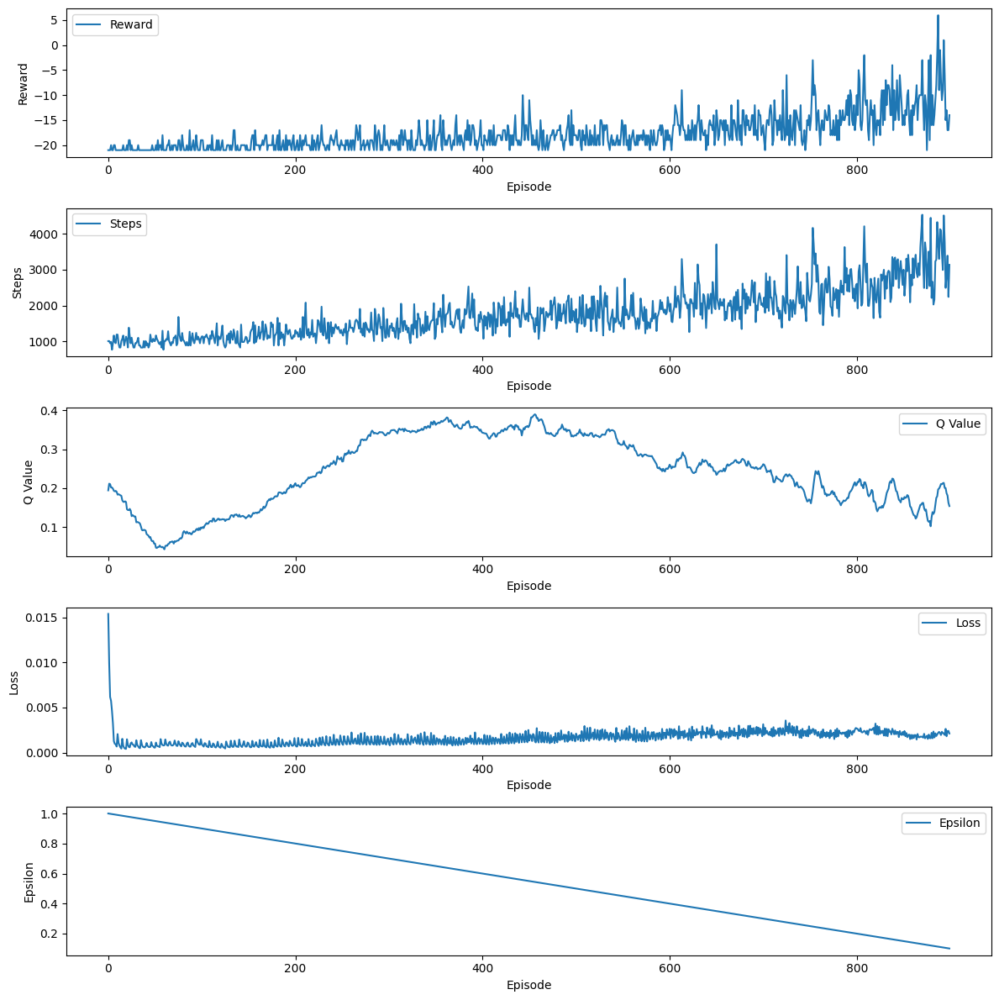

Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-900.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-900.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-900.mp4
Episode 901 abgeschlossen mit 2186 Schritten, Gesamtbelohnung: -15.0, Epsilon: 0.0999999999999992


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-901.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-901.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-901.mp4
Episode 902 abgeschlossen mit 2516 Schritten, Gesamtbelohnung: -16.0, Epsilon: 0.0989999999999992


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-902.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-902.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-902.mp4
Episode 903 abgeschlossen mit 2652 Schritten, Gesamtbelohnung: -12.0, Epsilon: 0.0979999999999992


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-903.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-903.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-903.mp4
Episode 904 abgeschlossen mit 4324 Schritten, Gesamtbelohnung: 3.0, Epsilon: 0.0969999999999992


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-904.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-904.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-904.mp4
Episode 905 abgeschlossen mit 2625 Schritten, Gesamtbelohnung: -20.0, Epsilon: 0.0959999999999992


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-905.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-905.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-905.mp4
Episode 906 abgeschlossen mit 3368 Schritten, Gesamtbelohnung: -9.0, Epsilon: 0.0949999999999992


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-906.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-906.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-906.mp4
Episode 907 abgeschlossen mit 3659 Schritten, Gesamtbelohnung: -2.0, Epsilon: 0.0939999999999992


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-907.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-907.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-907.mp4
Episode 908 abgeschlossen mit 3279 Schritten, Gesamtbelohnung: -8.0, Epsilon: 0.0929999999999992


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-908.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-908.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-908.mp4
Episode 909 abgeschlossen mit 3405 Schritten, Gesamtbelohnung: -15.0, Epsilon: 0.0919999999999992


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-909.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-909.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-909.mp4
Episode 910 abgeschlossen mit 3276 Schritten, Gesamtbelohnung: -8.0, Epsilon: 0.09099999999999919


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-910.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-910.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-910.mp4
Episode 911 abgeschlossen mit 4273 Schritten, Gesamtbelohnung: -9.0, Epsilon: 0.08999999999999919


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-911.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-911.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-911.mp4
Episode 912 abgeschlossen mit 3438 Schritten, Gesamtbelohnung: -5.0, Epsilon: 0.08899999999999919


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-912.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-912.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-912.mp4
Episode 913 abgeschlossen mit 3881 Schritten, Gesamtbelohnung: -12.0, Epsilon: 0.08799999999999919


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-913.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-913.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-913.mp4
Episode 914 abgeschlossen mit 3664 Schritten, Gesamtbelohnung: -4.0, Epsilon: 0.08699999999999919


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-914.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-914.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-914.mp4
Episode 915 abgeschlossen mit 4074 Schritten, Gesamtbelohnung: -4.0, Epsilon: 0.08599999999999919


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-915.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-915.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-915.mp4
Episode 916 abgeschlossen mit 3645 Schritten, Gesamtbelohnung: -8.0, Epsilon: 0.08499999999999919


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-916.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-916.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-916.mp4
Episode 917 abgeschlossen mit 4250 Schritten, Gesamtbelohnung: -8.0, Epsilon: 0.08399999999999919


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-917.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-917.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-917.mp4
Episode 918 abgeschlossen mit 3345 Schritten, Gesamtbelohnung: 12.0, Epsilon: 0.08299999999999919


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-918.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-918.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-918.mp4
Episode 919 abgeschlossen mit 2621 Schritten, Gesamtbelohnung: -11.0, Epsilon: 0.08199999999999918


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-919.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-919.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-919.mp4
Episode 920 abgeschlossen mit 4772 Schritten, Gesamtbelohnung: -5.0, Epsilon: 0.08099999999999918


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-920.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-920.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-920.mp4
Episode 921 abgeschlossen mit 3871 Schritten, Gesamtbelohnung: 2.0, Epsilon: 0.07999999999999918


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-921.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-921.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-921.mp4
Episode 922 abgeschlossen mit 2160 Schritten, Gesamtbelohnung: -14.0, Epsilon: 0.07899999999999918


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-922.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-922.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-922.mp4
Episode 923 abgeschlossen mit 4856 Schritten, Gesamtbelohnung: -3.0, Epsilon: 0.07799999999999918


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-923.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-923.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-923.mp4
Episode 924 abgeschlossen mit 2809 Schritten, Gesamtbelohnung: -11.0, Epsilon: 0.07699999999999918


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-924.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-924.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-924.mp4
Episode 925 abgeschlossen mit 3204 Schritten, Gesamtbelohnung: -10.0, Epsilon: 0.07599999999999918




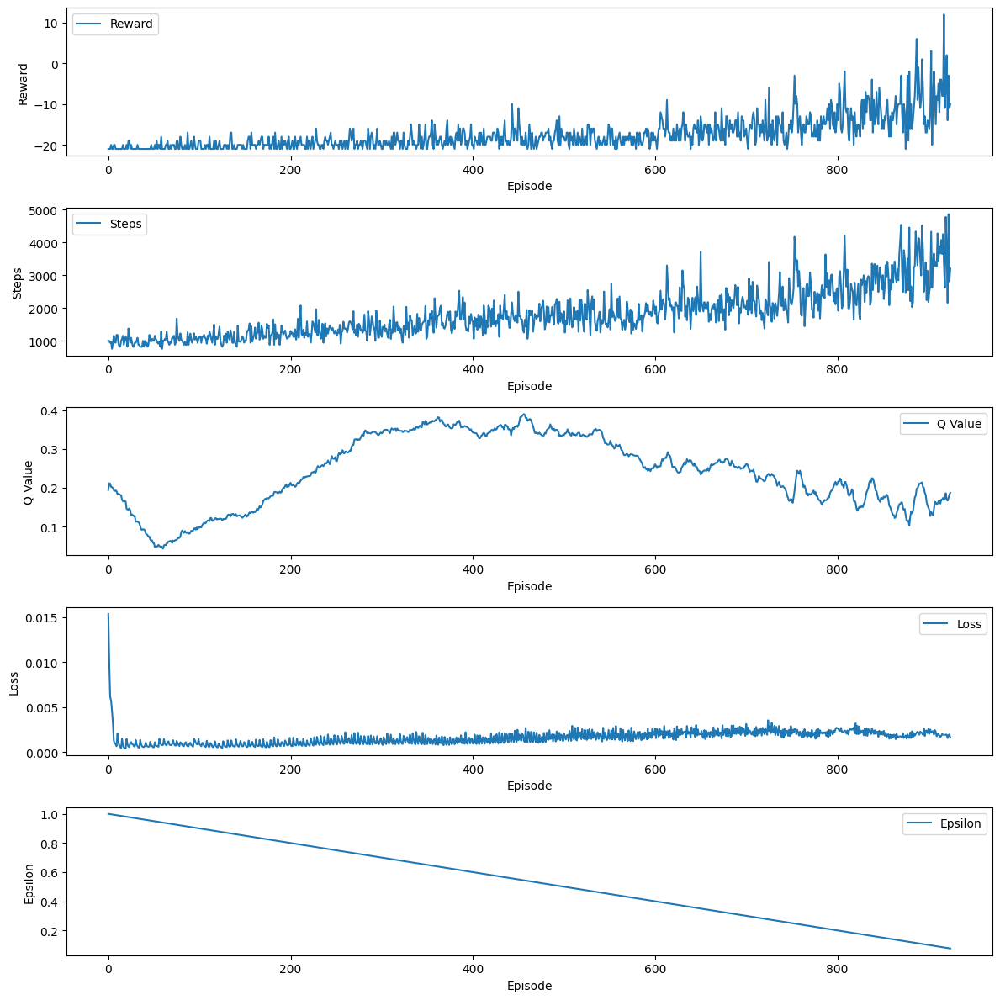

Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-925.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-925.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-925.mp4
Episode 926 abgeschlossen mit 3312 Schritten, Gesamtbelohnung: -9.0, Epsilon: 0.07499999999999918


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-926.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-926.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-926.mp4
Episode 927 abgeschlossen mit 4183 Schritten, Gesamtbelohnung: -8.0, Epsilon: 0.07399999999999918


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-927.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-927.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-927.mp4
Episode 928 abgeschlossen mit 3662 Schritten, Gesamtbelohnung: -9.0, Epsilon: 0.07299999999999918


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-928.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-928.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-928.mp4
Episode 929 abgeschlossen mit 3697 Schritten, Gesamtbelohnung: -3.0, Epsilon: 0.07199999999999918


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-929.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-929.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-929.mp4
Episode 930 abgeschlossen mit 3538 Schritten, Gesamtbelohnung: -6.0, Epsilon: 0.07099999999999917


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-930.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-930.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-930.mp4
Episode 931 abgeschlossen mit 3727 Schritten, Gesamtbelohnung: 1.0, Epsilon: 0.06999999999999917


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-931.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-931.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-931.mp4
Episode 932 abgeschlossen mit 3398 Schritten, Gesamtbelohnung: -8.0, Epsilon: 0.06899999999999917


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-932.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-932.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-932.mp4
Episode 933 abgeschlossen mit 4429 Schritten, Gesamtbelohnung: -1.0, Epsilon: 0.06799999999999917


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-933.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-933.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-933.mp4
Episode 934 abgeschlossen mit 3709 Schritten, Gesamtbelohnung: 2.0, Epsilon: 0.06699999999999917


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-934.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-934.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-934.mp4
Episode 935 abgeschlossen mit 3301 Schritten, Gesamtbelohnung: -9.0, Epsilon: 0.06599999999999917


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-935.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-935.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-935.mp4
Episode 936 abgeschlossen mit 3518 Schritten, Gesamtbelohnung: -3.0, Epsilon: 0.06499999999999917


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-936.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-936.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-936.mp4
Episode 937 abgeschlossen mit 3837 Schritten, Gesamtbelohnung: -13.0, Epsilon: 0.06399999999999917


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-937.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-937.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-937.mp4
Episode 938 abgeschlossen mit 3723 Schritten, Gesamtbelohnung: -4.0, Epsilon: 0.06299999999999917


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-938.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-938.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-938.mp4
Episode 939 abgeschlossen mit 3033 Schritten, Gesamtbelohnung: -17.0, Epsilon: 0.06199999999999917


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-939.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-939.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-939.mp4
Episode 940 abgeschlossen mit 2616 Schritten, Gesamtbelohnung: -15.0, Epsilon: 0.060999999999999166


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-940.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-940.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-940.mp4
Episode 941 abgeschlossen mit 3509 Schritten, Gesamtbelohnung: -10.0, Epsilon: 0.059999999999999165


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-941.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-941.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-941.mp4
Episode 942 abgeschlossen mit 3764 Schritten, Gesamtbelohnung: -8.0, Epsilon: 0.058999999999999164


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-942.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-942.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-942.mp4
Episode 943 abgeschlossen mit 3846 Schritten, Gesamtbelohnung: -4.0, Epsilon: 0.05799999999999916


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-943.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-943.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-943.mp4
Episode 944 abgeschlossen mit 4614 Schritten, Gesamtbelohnung: -1.0, Epsilon: 0.05699999999999916


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-944.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-944.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-944.mp4
Episode 945 abgeschlossen mit 3685 Schritten, Gesamtbelohnung: -7.0, Epsilon: 0.05599999999999916


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-945.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-945.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-945.mp4
Episode 946 abgeschlossen mit 3891 Schritten, Gesamtbelohnung: 7.0, Epsilon: 0.05499999999999916


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-946.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-946.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-946.mp4
Episode 947 abgeschlossen mit 4737 Schritten, Gesamtbelohnung: -3.0, Epsilon: 0.05399999999999916


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-947.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-947.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-947.mp4
Episode 948 abgeschlossen mit 4090 Schritten, Gesamtbelohnung: -2.0, Epsilon: 0.05299999999999916


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-948.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-948.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-948.mp4
Episode 949 abgeschlossen mit 3254 Schritten, Gesamtbelohnung: -12.0, Epsilon: 0.05199999999999916


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-949.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-949.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-949.mp4
Episode 950 abgeschlossen mit 2973 Schritten, Gesamtbelohnung: -8.0, Epsilon: 0.05099999999999916




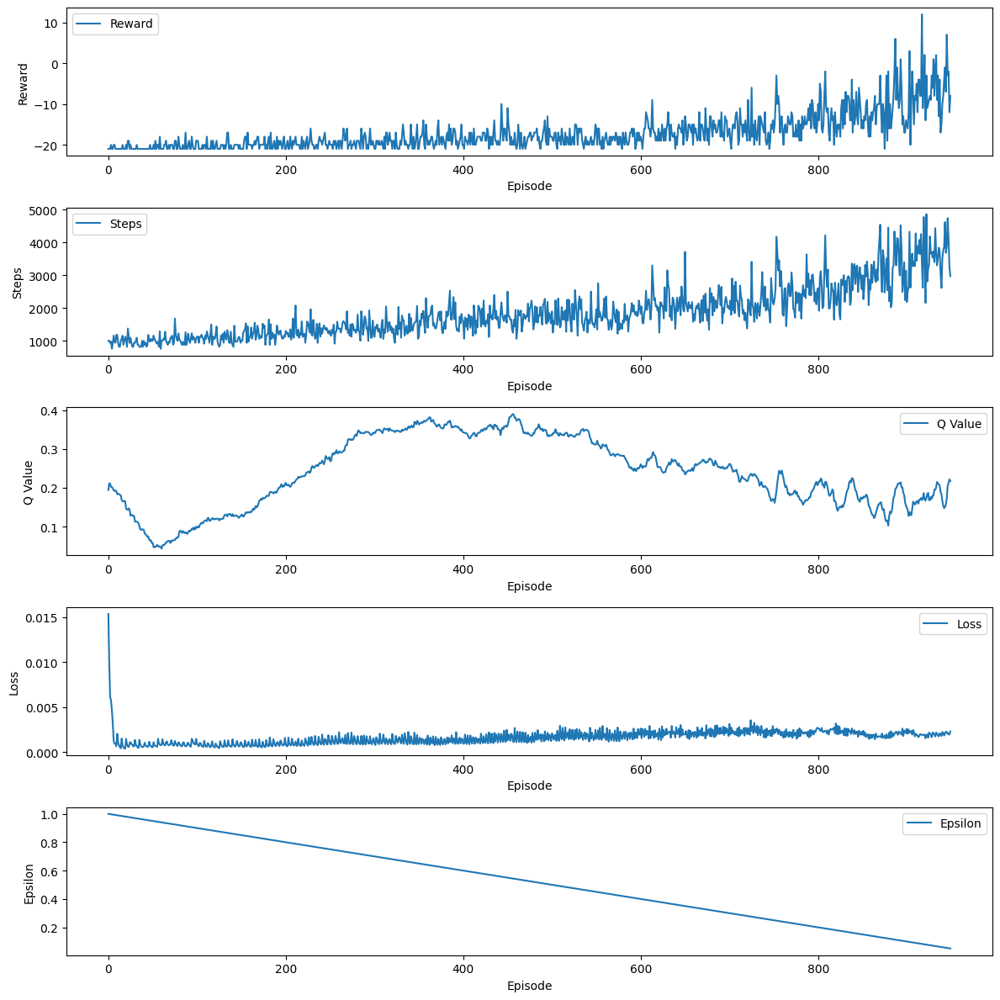

Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-950.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-950.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-950.mp4
Episode 951 abgeschlossen mit 3616 Schritten, Gesamtbelohnung: -9.0, Epsilon: 0.049999999999999156


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-951.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-951.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-951.mp4
Episode 952 abgeschlossen mit 2553 Schritten, Gesamtbelohnung: -15.0, Epsilon: 0.048999999999999155


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-952.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-952.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-952.mp4
Episode 953 abgeschlossen mit 4141 Schritten, Gesamtbelohnung: -6.0, Epsilon: 0.047999999999999154


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-953.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-953.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-953.mp4
Episode 954 abgeschlossen mit 3893 Schritten, Gesamtbelohnung: -8.0, Epsilon: 0.046999999999999154


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-954.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-954.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-954.mp4
Episode 955 abgeschlossen mit 3250 Schritten, Gesamtbelohnung: -9.0, Epsilon: 0.04599999999999915


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-955.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-955.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-955.mp4
Episode 956 abgeschlossen mit 3555 Schritten, Gesamtbelohnung: 13.0, Epsilon: 0.04499999999999915


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-956.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-956.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-956.mp4
Episode 957 abgeschlossen mit 4384 Schritten, Gesamtbelohnung: 5.0, Epsilon: 0.04399999999999915


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-957.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-957.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-957.mp4
Episode 958 abgeschlossen mit 2828 Schritten, Gesamtbelohnung: -14.0, Epsilon: 0.04299999999999915


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-958.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-958.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-958.mp4
Episode 959 abgeschlossen mit 4868 Schritten, Gesamtbelohnung: -1.0, Epsilon: 0.04199999999999915


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-959.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-959.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-959.mp4
Episode 960 abgeschlossen mit 3517 Schritten, Gesamtbelohnung: -5.0, Epsilon: 0.04099999999999915


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-960.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-960.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-960.mp4
Episode 961 abgeschlossen mit 3361 Schritten, Gesamtbelohnung: -11.0, Epsilon: 0.03999999999999915


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-961.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-961.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-961.mp4
Episode 962 abgeschlossen mit 4640 Schritten, Gesamtbelohnung: -2.0, Epsilon: 0.038999999999999146


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-962.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-962.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-962.mp4
Episode 963 abgeschlossen mit 3045 Schritten, Gesamtbelohnung: -8.0, Epsilon: 0.037999999999999146


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-963.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-963.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-963.mp4
Episode 964 abgeschlossen mit 3130 Schritten, Gesamtbelohnung: -7.0, Epsilon: 0.036999999999999145


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-964.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-964.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-964.mp4
Episode 965 abgeschlossen mit 2897 Schritten, Gesamtbelohnung: 11.0, Epsilon: 0.035999999999999144


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-965.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-965.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-965.mp4
Episode 966 abgeschlossen mit 3761 Schritten, Gesamtbelohnung: 7.0, Epsilon: 0.03499999999999914


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-966.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-966.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-966.mp4
Episode 967 abgeschlossen mit 3417 Schritten, Gesamtbelohnung: 10.0, Epsilon: 0.03399999999999914


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-967.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-967.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-967.mp4
Episode 968 abgeschlossen mit 3489 Schritten, Gesamtbelohnung: -9.0, Epsilon: 0.03299999999999914


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-968.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-968.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-968.mp4
Episode 969 abgeschlossen mit 3359 Schritten, Gesamtbelohnung: -13.0, Epsilon: 0.03199999999999914


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-969.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-969.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-969.mp4
Episode 970 abgeschlossen mit 4092 Schritten, Gesamtbelohnung: 3.0, Epsilon: 0.03099999999999914


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-970.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-970.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-970.mp4
Episode 971 abgeschlossen mit 2612 Schritten, Gesamtbelohnung: -15.0, Epsilon: 0.02999999999999914


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-971.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-971.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-971.mp4
Episode 972 abgeschlossen mit 4045 Schritten, Gesamtbelohnung: 1.0, Epsilon: 0.028999999999999138


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-972.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-972.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-972.mp4
Episode 973 abgeschlossen mit 4252 Schritten, Gesamtbelohnung: 2.0, Epsilon: 0.027999999999999137


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-973.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-973.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-973.mp4
Episode 974 abgeschlossen mit 3078 Schritten, Gesamtbelohnung: 11.0, Epsilon: 0.026999999999999136


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-974.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-974.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-974.mp4
Episode 975 abgeschlossen mit 3797 Schritten, Gesamtbelohnung: 6.0, Epsilon: 0.025999999999999135




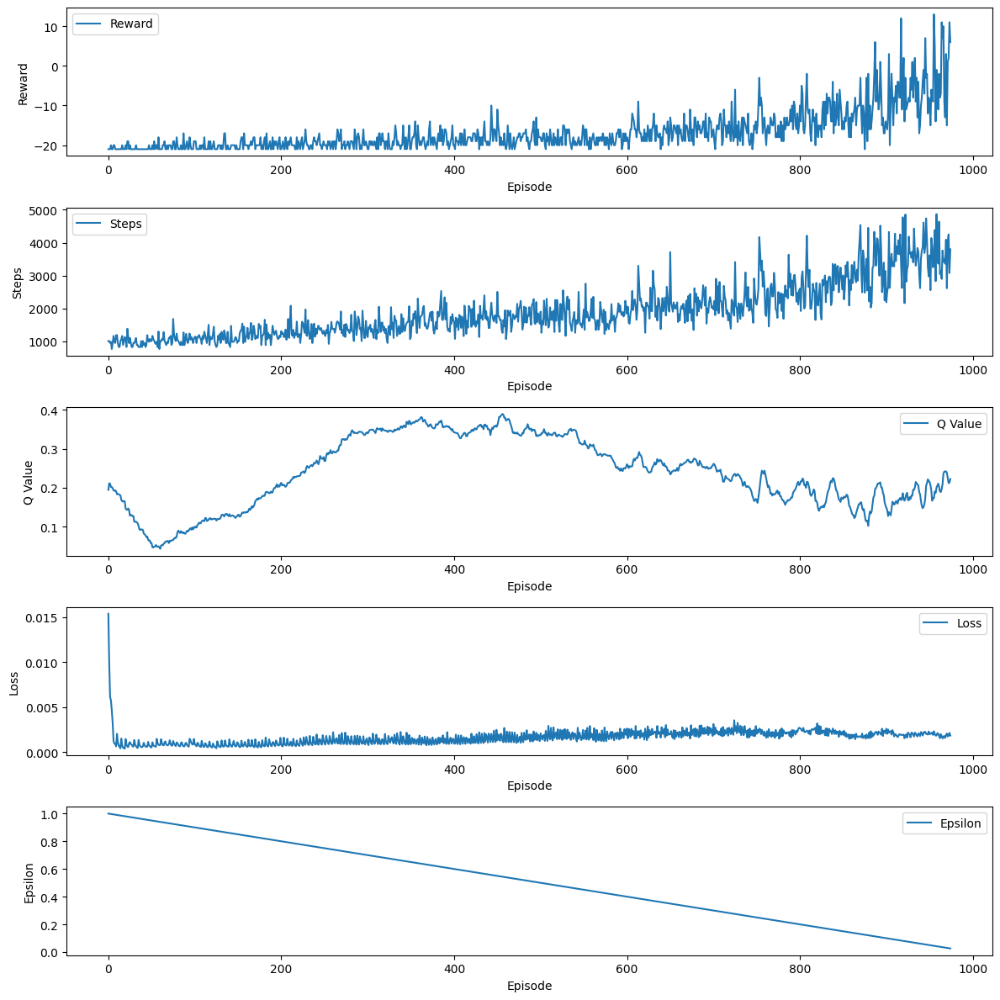

Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-975.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-975.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-975.mp4
Episode 976 abgeschlossen mit 3922 Schritten, Gesamtbelohnung: 1.0, Epsilon: 0.024999999999999134


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-976.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-976.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-976.mp4
Episode 977 abgeschlossen mit 3388 Schritten, Gesamtbelohnung: -7.0, Epsilon: 0.023999999999999133


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-977.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-977.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-977.mp4
Episode 978 abgeschlossen mit 4263 Schritten, Gesamtbelohnung: 7.0, Epsilon: 0.022999999999999132


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-978.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-978.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-978.mp4
Episode 979 abgeschlossen mit 4121 Schritten, Gesamtbelohnung: -5.0, Epsilon: 0.02199999999999913


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-979.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-979.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-979.mp4
Episode 980 abgeschlossen mit 4428 Schritten, Gesamtbelohnung: 2.0, Epsilon: 0.02099999999999913


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-980.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-980.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-980.mp4
Episode 981 abgeschlossen mit 3041 Schritten, Gesamtbelohnung: 14.0, Epsilon: 0.01999999999999913


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-981.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-981.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-981.mp4
Episode 982 abgeschlossen mit 4433 Schritten, Gesamtbelohnung: 2.0, Epsilon: 0.01899999999999913


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-982.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-982.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-982.mp4
Episode 983 abgeschlossen mit 2916 Schritten, Gesamtbelohnung: -10.0, Epsilon: 0.017999999999999128


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-983.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-983.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-983.mp4
Episode 984 abgeschlossen mit 3916 Schritten, Gesamtbelohnung: 3.0, Epsilon: 0.016999999999999127


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-984.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-984.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-984.mp4
Episode 985 abgeschlossen mit 3591 Schritten, Gesamtbelohnung: -8.0, Epsilon: 0.015999999999999126


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-985.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-985.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-985.mp4
Episode 986 abgeschlossen mit 4035 Schritten, Gesamtbelohnung: 1.0, Epsilon: 0.014999999999999125


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-986.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-986.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-986.mp4
Episode 987 abgeschlossen mit 3879 Schritten, Gesamtbelohnung: 2.0, Epsilon: 0.013999999999999124


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-987.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-987.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-987.mp4
Episode 988 abgeschlossen mit 3860 Schritten, Gesamtbelohnung: -2.0, Epsilon: 0.012999999999999123


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-988.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-988.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-988.mp4
Episode 989 abgeschlossen mit 4719 Schritten, Gesamtbelohnung: 1.0, Epsilon: 0.011999999999999122


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-989.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-989.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-989.mp4
Episode 990 abgeschlossen mit 2753 Schritten, Gesamtbelohnung: 15.0, Epsilon: 0.010999999999999122


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-990.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-990.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-990.mp4
Episode 991 abgeschlossen mit 3577 Schritten, Gesamtbelohnung: -12.0, Epsilon: 0.01


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-991.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-991.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-991.mp4
Episode 992 abgeschlossen mit 4682 Schritten, Gesamtbelohnung: -4.0, Epsilon: 0.01


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-992.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-992.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-992.mp4
Episode 993 abgeschlossen mit 3841 Schritten, Gesamtbelohnung: -4.0, Epsilon: 0.01


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-993.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-993.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-993.mp4
Episode 994 abgeschlossen mit 4613 Schritten, Gesamtbelohnung: -1.0, Epsilon: 0.01


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-994.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-994.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-994.mp4
Episode 995 abgeschlossen mit 4979 Schritten, Gesamtbelohnung: -6.0, Epsilon: 0.01


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-995.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-995.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-995.mp4
Episode 996 abgeschlossen mit 3316 Schritten, Gesamtbelohnung: 11.0, Epsilon: 0.01


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-996.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-996.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-996.mp4
Episode 997 abgeschlossen mit 4218 Schritten, Gesamtbelohnung: -2.0, Epsilon: 0.01


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-997.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-997.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-997.mp4
Episode 998 abgeschlossen mit 3837 Schritten, Gesamtbelohnung: 5.0, Epsilon: 0.01


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-998.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-998.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-998.mp4
Episode 999 abgeschlossen mit 5254 Schritten, Gesamtbelohnung: -2.0, Epsilon: 0.01


Moviepy - Building video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-999.mp4.
Moviepy - Writing video c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-999.mp4



Moviepy - Done !
Moviepy - video ready c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\RL\Abgaben\Reinforcement-Learning-Pong-Agent\res\training_v1\all_videos\rl-video-episode-999.mp4
Episode 1000 abgeschlossen mit 3259 Schritten, Gesamtbelohnung: 11.0, Epsilon: 0.01




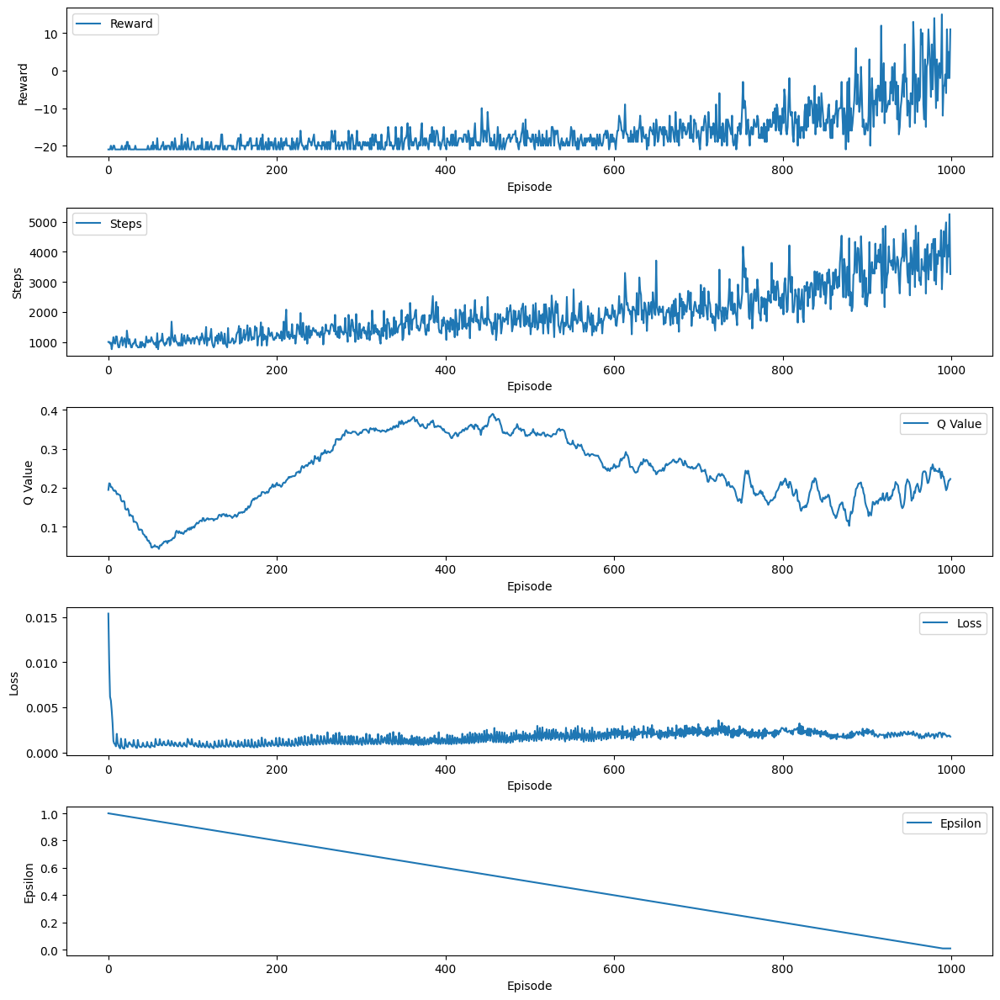

In [18]:
for episode in range(1, num_episodes + 1):
    state, _ = env.reset()
    state = np.squeeze(state, axis=-1)
    total_reward = 0
    steps = 0
    mean_episode_q = []
    mean_episode_loss = []
    resetnow = False
    # Initiate loop for the current episode to play the game until it ends
    while resetnow==False:
        # To visualize the training, uncomment the following line
        # env.render()
        action = agent.selectAction(state)
        next_state, reward, resetnow, truncated, info = env.step(action)
        next_state = np.squeeze(next_state, axis=-1)
        resetnow = resetnow or truncated
        agent.saveExp(state, action, next_state, reward, resetnow)
        q, loss = agent.learn_get_TDest_loss()
        state = next_state
        total_reward = total_reward + reward
        steps = steps + 1
        mean_episode_q.append(q)
        mean_episode_loss.append(loss)
    print(
        f"Episode {episode} abgeschlossen mit {steps} Schritten, Gesamtbelohnung: {total_reward}, Epsilon: {agent.epsilon}\n\n"
    )
    # Save the results of the current episode
    reward_list.append(total_reward)
    steps_list.append(steps)
    q_list.append(np.mean(mean_episode_q))
    loss_list.append(np.mean(mean_episode_loss))
    epsilon_list.append(agent.epsilon)

    # Plot the results of all episodes at the defined intervals
    if episode % plot_every == 0:
        plot_results(
            reward_list,
            steps_list,
            q_list,
            loss_list,
            epsilon_list,
            os.path.join(plot_folder, f"plot_{episode}.png"),
        )

    # Save the model at the defined intervals
    if episode % save_every == 0:
        torch.save(
            dict(
                model=agent.model.state_dict(),
                optimizer=agent.optimizer.state_dict(),
                epsilon=agent.epsilon,
            ),
            os.path.join(checkpoint_folder, f"model_ep{episode}.pth"),
        )

    # Decay the epsilon value at the end of each episode
    agent.decayEpsilon(strat="lin")

# Save the final model after all episodes are completed
torch.save(
    dict(
        model=agent.model.state_dict(),
        optimizer=agent.optimizer.state_dict(),
        epsilon=agent.epsilon,
    ),
    os.path.join(model_folder, f"final_model.pth"),
)

# Close the environment
env.close()